# Function Definitions

In [1]:
class LSTM:
    def __init__(self, input_size=340, output_size=101, n_h=100, seq_len=25, epochs=4, alpha=0.004, beta1=0.9,
                 beta2=0.999):
        self.input_size = input_size  # no. of unique characters in the training data
        self.output_size = output_size  # no. of RUL values in the dataset
        self.n_h = n_h  # no. of units in the hidden layer
        self.seq_len = seq_len  # no. of time steps, also size of mini batch
        self.epochs = epochs  # no. of training iterations
        self.alpha = alpha  # learning rate
        self.beta1 = beta1  # 1st momentum parameter
        self.beta2 = beta2  # 2nd momentum parameter

        # ----initialise weighs and biases----- #
        self.params = {}
        std = (1.0 / np.sqrt(self.input_size + self.n_h))  # Xavier initialisation

        # forget gate
        self.params["Wf"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bf"] = np.ones((self.n_h, 1))

        # input gate
        self.params["Wi"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bi"] = np.ones((self.n_h, 1))

        # cell gate
        self.params["Wc"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bc"] = np.ones((self.n_h, 1))

        # output gate
        self.params["Wo"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bo"] = np.ones((self.n_h, 1))

        # output
        self.params["Wv"] = np.random.randn(self.output_size, self.n_h) * (1.0 / np.sqrt(self.output_size))
        self.params["bv"] = np.ones((self.output_size, 1))

        # -----initialise gradients and Adam parameters-----#
        self.grads = {}
        self.adam_params = {}

        for key in self.params:
            self.grads["d" + key] = np.zeros_like(self.params[key])
            self.adam_params["m" + key] = np.zeros_like(self.params[key])
            self.adam_params["v" + key] = np.zeros_like(self.params[key])

        self.smooth_loss = -np.log(1.0 / self.output_size) * self.seq_len

        return

    def init_random_params(self):
        # ----initialise weighs and biases----- #
        self.params = {}
        std = (1.0 / np.sqrt(self.input_size + self.n_h))  # Xavier initialisation

        # forget gate
        self.params["Wf"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bf"] = np.ones((self.n_h, 1))

        # input gate
        self.params["Wi"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bi"] = np.ones((self.n_h, 1))

        # cell gate
        self.params["Wc"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bc"] = np.ones((self.n_h, 1))

        # output gate
        self.params["Wo"] = np.random.randn(self.n_h, self.n_h + self.input_size) * std
        self.params["bo"] = np.ones((self.n_h, 1))

        # output
        self.params["Wv"] = np.random.randn(self.output_size, self.n_h) * (1.0 / np.sqrt(self.output_size))
        self.params["bv"] = np.ones((self.output_size, 1))

        return self.params

    # Firstly, we will compute the sigmoid activation used at the forget, input and output gate layers, and the softmax
    # activation used at the output layer. Tanh activation is also needed but numpy.tanh is used instead.

    def sigmoid(self, x):
        """
        Smoothes out values in the range of [0,1]
        """
        return 1 / (1 + np.exp(-x))

    def softmax(self, x):
        """
        Normalizes output into a probability distribution
        """
        e_x = np.exp(x - np.max(x))  # max(x) subtracted for numerical stability
        # e_x = np.exp(x) # Normal softmax activation function
        return e_x / np.sum(e_x, axis=0)

    # Although exploding gradients is not as prevalent for LSTMs as for RNNs, we will limit the gradients to a
    # conservative value using clip_grads. After back propagating through all LSTM cells, we will reset the
    # gradients using reset_grads.

    def clip_grads(self):
        """
        Limits the magnitude of gradients to avoid exploding gradients
        """
        for key in self.grads:
            np.clip(self.grads[key], -5, 5, out=self.grads[key])
        return

    def reset_grads(self):
        """
        Resets gradients to zero before each backpropagation
        """
        for key in self.grads:
            self.grads[key].fill(0)
        return

    # The last utility function that we will create is for updating the weights using Adam. Note that the weights are
    # updated using the accumulated gradients for all time steps.

    def update_params(self, batch_num):
        """
        Updates parameters with Adam
        """
        for key in self.params:
            self.adam_params["m" + key] = self.adam_params["m" + key] * self.beta1 + \
                                          (1 - self.beta1) * self.grads["d" + key]
            self.adam_params["v" + key] = self.adam_params["v" + key] * self.beta2 + \
                                          (1 - self.beta2) * self.grads["d" + key] ** 2

            m_correlated = self.adam_params["m" + key] / (1 - self.beta1 ** batch_num)
            v_correlated = self.adam_params["v" + key] / (1 - self.beta2 ** batch_num)
            self.params[key] -= self.alpha * m_correlated / (np.sqrt(v_correlated) + 1e-8)
        return

    # Forward propagation for a time-step
    # We will propagate forwards through each LSTM cell using forward_step
    # A LSTM cell depends on the previous cell’s state (like Neural Networks). forward_step therefore takes as input
    # the previous hidden state (h_prev) and previous cell state (c_prev). At the beginning of every training iteration,
    # the previous hidden states are initialised to zero (i.e. at t = -1), but for subsequent time-steps, they
    # correspond to the hidden states at t-1, where t is the current time-step.

    def forward_step(self, x, h_prev, c_prev):
        """
        Implements the forward propagation for one time step
        """
        z = np.row_stack((h_prev, x))  # row_stack can also be used

        f = self.sigmoid(np.dot(self.params["Wf"], z) + self.params["bf"])  # [n_h, 1]
        i = self.sigmoid(np.dot(self.params["Wi"], z) + self.params["bi"])  # [n_h, 1]
        c_bar = np.tanh(np.dot(self.params["Wc"], z) + self.params["bc"])  # [n_h, 1]

        c = f * c_prev + i * c_bar  # [n_h, 1]
        o = self.sigmoid(np.dot(self.params["Wo"], z) + self.params["bo"])  # [n_h, 1]
        h = o * np.tanh(c)  # [n_h, 1]

        v = np.dot(self.params["Wv"], h) + self.params["bv"]  # [output_size, n_h] @ [n_h, 1] + [
        # output_size, 1] = [output_size, 1]
        y_hat = self.softmax(v)  # [output_size, 1]
        # print("y_hat from softmax function in forward step", y_hat)

        return y_hat, v, h, o, c, c_bar, i, f, z

    # Backward propagation for a time-step
    # After forward propagation, we will pass the updated values of the last LSTM cell to backward_step and propagate
    # the gradients backwards to the first LSTM cell.
    # dh_next and dc_next are initialised to zero at t = -1, but take the values of dh_prev and dc_prev that
    # backward_step returns in subsequent time steps.
    # In addition, it is worth clarifying:

    # 1. As weights are shared by all time steps, the weight gradients are accumulated.
    # 2. We are adding dh_next to dh, because as Figure 1 shows, h is branched in forward propagation in the softmax
    # output layer and the next LSTM cell, where it is concatenated with x. Therefore, there are two gradients flowing
    # back. This applies to dc as well.
    # 3. There are four gradients flowing towards the input layer from the gates, therefore dz is the summation of
    # those gradients.

    def backward_step(self, y, y_hat, dh_next, dc_next, c_prev, z, f, i, c_bar, c, o, h):
        dv = np.copy(y_hat)
        dv[y] -= 1  # dJ/dv = y_hat - y

        # print("-------------------------------------------------------------------------------------------------------")
        # print("y in back propagation:", y)
        # print("dv[y] from backward_step", dv)

        # Output bach propagation
        self.grads["dWv"] += np.dot(dv, h.T)
        self.grads["dbv"] += dv

        # Hidden state back propagation
        dh = np.dot(self.params["Wv"].T, dv)
        dh += dh_next

        do = dh * np.tanh(c)
        da_o = do * o * (1 - o)
        self.grads["dWo"] += np.dot(da_o, z.T)
        self.grads["dbo"] += da_o

        # Cell states back propagation
        dc = dh * o * (1 - np.tanh(c) ** 2)
        dc += dc_next

        dc_bar = dc * i
        da_c = dc_bar * (1 - c_bar ** 2)
        self.grads["dWc"] += np.dot(da_c, z.T)
        self.grads["dbc"] += da_c

        # Input gate back propagation
        di = dc * c_bar
        da_i = di * i * (1 - i)
        self.grads["dWi"] += np.dot(da_i, z.T)
        self.grads["dbi"] += da_i

        # Forget gate back propagation
        df = dc * c_prev
        da_f = df * f * (1 - f)
        self.grads["dWf"] += np.dot(da_f, z.T)
        self.grads["dbf"] += da_f

        # Input back propagation
        dz = (np.dot(self.params["Wf"].T, da_f)\
             + np.dot(self.params["Wi"].T, da_i)\
             + np.dot(self.params["Wo"].T, da_o) \
             + np.dot(self.params["Wc"].T, da_c))

        dh_prev = dz[:self.n_h, :]
        dc_prev = f * dc

        return dh_prev, dc_prev

    # Forward and backward propagation for all time-steps
    # The forward and backward propagation steps will be executed within the forward_backward function. Here, we iterate
    # over all time steps and store the results for each time step in dictionaries. In the forward propagation loop,
    # we also accumulate the cross entropy loss.

    # forward_backward exports the cross entropy loss of the training batch, in addition to the hidden and cell states
    # of the last layer which are fed to the first LSTM cell as hprev and prev of the next training batch.

    def forward_backward(self, x_batch, y_batch, h_prev, c_prev):
        x, z = {}, {}
        f, i, c_bar, c, o = {}, {}, {}, {}, {}
        y_hat, v, h = {}, {}, {}

        # Values at t= - 1
        h[-1] = h_prev
        c[-1] = c_prev

        loss = 0
        for t in range(self.seq_len):
            x[t] = x_batch[t].reshape(-1, 1)

            y_hat[t], v[t], h[t], o[t], c[t], c_bar[t], i[t], f[t], z[t] = \
                self.forward_step(x[t], h[t - 1], c[t - 1])

            loss += -np.log(y_hat[t][y_batch[t], 0])

        self.reset_grads()

        dh_next = np.zeros_like(h[0])
        dc_next = np.zeros_like(c[0])

        for t in reversed(range(self.seq_len)):
            dh_next, dc_next = self.backward_step(y_batch[t], y_hat[t], dh_next, dc_next, c[t - 1], z[t], f[t], i[t],
                                                  c_bar[t], c[t], o[t], h[t])

        return loss, h[self.seq_len - 1], c[self.seq_len - 1]


    def predict(self, x_batch, h_prev, c_prev):
        x, z = {}, {}
        f, i, c_bar, c, o = {}, {}, {}, {}, {}
        y_hat, v, h = {}, {}, {}
        y_hat_pred = np.zeros((self.seq_len, 1))


        # Values at t= - 1
        h[-1] = h_prev
        c[-1] = c_prev

        loss = 0
        for t in range(self.seq_len):
            x[t] = x_batch[t].reshape(-1, 1)

            y_hat[t], v[t], h[t], o[t], c[t], c_bar[t], i[t], f[t], z[t] = \
                self.forward_step(x[t], h[t - 1], c[t - 1])

            y_hat_pred[t, :] = np.argmax(y_hat[t])

            loss += -np.log(y_hat_pred[t, :])

        return y_hat_pred, loss, h[self.seq_len - 1], c[self.seq_len - 1]

    # Gradient checking: To check the backpropagation calculation, we can numerically approximate the gradient at a
    # point and compare it to the model’s back propagation gradient.

    def gradient_check(self, x, y, h_prev, c_prev, num_checks=10, delta=1e-6):
        """
        Checks the magnitude of gradients against expected approximate values
        """
        print("**********************************")
        print("Gradient check...\n")

        _, _, _ = self.forward_backward(x, y, h_prev, c_prev)
        grads_numerical = self.grads

        for key in self.params:
            print("---------", key, "---------")
            test = True

            dims = self.params[key].shape
            grad_numerical = 0
            grad_analytical = 0

            for _ in range(num_checks):  # sample 10 neurons

                idx = int(uniform(0, self.params[key].size))
                old_val = self.params[key].flat[idx]

                self.params[key].flat[idx] = old_val + delta
                J_plus, _, _ = self.forward_backward(x, y, h_prev, c_prev)

                self.params[key].flat[idx] = old_val - delta
                J_minus, _, _ = self.forward_backward(x, y, h_prev, c_prev)

                self.params[key].flat[idx] = old_val

                grad_numerical += (J_plus - J_minus) / (2 * delta)
                grad_analytical += grads_numerical["d" + key].flat[idx]

            grad_numerical /= num_checks
            grad_analytical /= num_checks

            rel_error = abs(grad_analytical - grad_numerical) / abs(grad_analytical + grad_numerical)

            if rel_error > 1e-2:
                if not (grad_analytical < 1e-6 and grad_numerical < 1e-6):
                    test = False
                    assert (test)

            print('Approximate: \t%e, Exact: \t%e =>  Error: \t%e' % (grad_numerical, grad_analytical, rel_error))
        print("\nTest successful!")
        print("**********************************\n")
        return

    # we define the function to train the model. train takes as input a sequence of input image data and outputs a list
    # of losses for each training batch (J) as well as the trained parameters.
    # In order to speed up training, we will train our data in batches. The number of batches (num_batches) is given by
    # the total number of inputs data for each agent (len(X[i])) divided by the seq_len, which is user-defined.
    # The input text goes through the following processing steps:

    # 1. Firstly, we trim the input data that don’t form a full sequence
    # 2. When we iterate over each training batch, we slice the input data in batches of size seq_len
    # 3.

    def train(self, X, Y, params ,verbose=True):
        """
        Main method of the LSTM class where training takes place
        """
        self.params = params
        J = []  # to store losses

        num_batches = len(X) // self.seq_len
        X_trimmed = X[: num_batches * self.seq_len]  # trim input to have full sequences
        Y_trimmed = Y[: num_batches * self.seq_len]  # trim output to have full sequences

        for epoch in range(self.epochs):
            h_prev = np.zeros((self.n_h, 1))
            c_prev = np.zeros((self.n_h, 1))

            for j in range(0, len(X_trimmed), self.seq_len):
                # prepare batches
                x_batch = X_trimmed[j: j + self.seq_len]
                y_batch = Y_trimmed[j: j + self.seq_len]

                loss, h_prev, c_prev = self.forward_backward(x_batch, y_batch, h_prev, c_prev)

                # smooth out loss and store in list
                self.smooth_loss = self.smooth_loss * 0.999 + loss * 0.001
                J.append(self.smooth_loss)

                # check gradients
            #    if epoch == 0 and j == 0:
            #        self.gradient_check(x_batch, y_batch, h_prev, c_prev, num_checks=10, delta=1e-7)

                self.clip_grads()

                batch_num = epoch * self.epochs + j / self.seq_len + 1
                self.update_params(batch_num)

                # print out loss
                if verbose and j == len(X_trimmed) - 2 * self.seq_len:
                    print('Epoch', epoch, '\tBatch:', j, "-", j + self.seq_len, '\tLoss:',
                          np.round(self.smooth_loss, 2))

        return J, self.params

    def test_pred(self, X_test, params):
        """
        Calculate the accuracy of the model with test data
        """
        self.params = params
        Y_hat_pred = np.ones(shape=(len(X_test), 1))

        num_batches = len(X_test) // self.seq_len
        X_trimmed = X_test[: num_batches * self.seq_len]  # trim input to have full sequences

        h_prev = np.zeros((self.n_h, 1))
        c_prev = np.zeros((self.n_h, 1))

        for j in range(0, len(X_trimmed), self.seq_len):
            # prepare batches
            x_batch = X_trimmed[j: j + self.seq_len]

            y_hat_pred, loss, h_prev, c_prev = self.predict(x_batch, h_prev, c_prev)

            Y_hat_pred[j: j + self.seq_len, :] = y_hat_pred

        return Y_hat_pred

    def test_loss(self, X_test, params, verbose=True):
        """
        Calculate the accuracy of the model with test data
        """
        self.params = params
        J_test = []  # to store losses
        Y_hat_pred = np.ones(shape=(len(X_test), 1))

        num_batches = len(X_test) // self.seq_len
        X_trimmed = X_test[: num_batches * self.seq_len]  # trim input to have full sequences

        for epoch in range(self.epochs):
            h_prev = np.zeros((self.n_h, 1))
            c_prev = np.zeros((self.n_h, 1))
            print('Epoch', epoch)
            for j in range(0, len(X_trimmed), self.seq_len):
                # prepare batches
                x_batch = X_trimmed[j: j + self.seq_len]

                y_hat_pred, loss, h_prev, c_prev = self.predict(x_batch, h_prev, c_prev)

                # smooth out loss and store in list
                self.smooth_loss = self.smooth_loss * 0.999 + loss * 0.001
                J_test.append(self.smooth_loss)

                Y_hat_pred[j: j + self.seq_len, :] = y_hat_pred

                # print out train loss
                if verbose and j == len(X_trimmed) - 2 * self.seq_len:
                    print('Epoch', epoch, '\tBatch:', j, "-", j + self.seq_len, '\tTrain_Loss:',
                          np.round(self.smooth_loss, 2))

        return J_test


In [2]:
# function to reshape features into (samples, time steps, features)
def gen_sequence(id_df, seq_length, seq_cols):
    #Only sequences that meet the window-length are considered, no padding is used. This means for testing
    #we need to drop those which are below the window-length. An alternative would be to pad sequences so that
    #we can use shorter ones """
    data_array = id_df[seq_cols].values
    num_elements = data_array.shape[0]
    for start, stop in zip(range(0, num_elements-seq_length), range(seq_length, num_elements)):
        yield data_array[start:stop, :]

In [3]:
# function to generate labels
def gen_labels(id_df, seq_length, label):
    data_array = id_df[label].values
    num_elements = data_array.shape[0]
    return data_array[seq_length:num_elements, :]

In [4]:
# function to reshape features into (samples, time steps, features)
def gen_sequence_reshape(id_df, seq_length, seq_cols):
    """ Only sequences that meet the window-length are considered, no padding is used. This means for testing
    we need to drop those which are below the window-length. An alternative would be to pad sequences so that
    we can use shorter ones """
    data_array = id_df[seq_cols].values
    num_elements = data_array.shape[0]
    for start, stop in zip(range(0, num_elements-seq_length), range(seq_length, num_elements)):
        yield data_array[start:stop, :].reshape(-1)

In [5]:
# function to reshape features into (samples, time steps, features)
def gen_sequence_reshape_append1(id_df, seq_length, seq_cols):
    """ Only sequences that meet the window-length are considered, no padding is used. This means for testing
    we need to drop those which are below the window-length. An alternative would be to pad sequences so that
    we can use shorter ones """
    data_array = id_df[seq_cols].values
    num_elements = data_array.shape[0]
    for start, stop in zip(range(0, num_elements-seq_length), range(seq_length, num_elements)):
        yield np.append(data_array[start:stop, :].reshape(-1), 1)

# Main

In [6]:

# input_size = 35 * 17 + 1 = 596 The input ton the LSTM, Z, has dimensions [input_size + n_h, 1]. Since the LSTM
# layer want to output n_h neurons, each weight should be of size [n_h, input_size + n_h] and each bias of size
# [n_h, 1]. Exception is the weight and bias at the output softmax layer (Wv, bv). The resulting output will be a
# probability distribution over all possible RUL in the dataset, therefore of size [output_size, 1], hence Wv should be
# of size [output_size, n_h] and bv of size [output_size, 1]
import numpy as np
import pickle
import os
# from model import *

# Import libraries
from random import uniform
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

import time
import math
import sys
import random

# the "resource" library is not available on windows.
# if it can be imported, we can use it! For example, while running on google colab
try:
    import resource

    print("Succesfully imported 'resource' package")
except:
    print("Failed on importing 'resource' package, continuing wihtout it!")


Failed on importing 'resource' package, continuing wihtout it!


# Read training data

In [7]:
# read training data
train_df = pd.read_csv('train_FD004.txt', sep=" ", header=None)
train_df.drop(train_df.columns[[26, 27]], axis=1, inplace=True)
train_df.columns = ['id', 'cycle', 'setting1', 'setting2', 'setting3', 's1', 's2', 's3',
                    's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
                    's15', 's16', 's17', 's18', 's19', 's20', 's21']

### Remove the features which has low prognosability
### This part has been calculated by Matlab and the signals was selected

In [8]:
# remove the features which has low prognosability
# this part has been calculated by Matlab and the signals was selected
train_df.drop(labels=['setting3', 's1', 's5', 's6', 's10', 's16', 's18', 's19'], axis=1, inplace=True)
train_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21
0,1,1,42.0049,0.8400,549.68,1343.43,1112.93,137.36,2211.86,8311.32,41.69,129.78,2387.99,8074.83,9.3335,330,10.62,6.3670
1,1,2,20.0020,0.7002,606.07,1477.61,1237.50,332.10,2323.66,8713.60,43.94,312.59,2387.73,8046.13,9.1913,361,24.37,14.6552
2,1,3,42.0038,0.8409,548.95,1343.12,1117.05,138.18,2211.92,8306.69,41.66,129.62,2387.97,8066.62,9.4007,329,10.48,6.4213
3,1,4,42.0000,0.8400,548.70,1341.24,1118.03,137.98,2211.88,8312.35,41.68,129.80,2388.02,8076.05,9.3369,328,10.54,6.4176
4,1,5,25.0063,0.6207,536.10,1255.23,1033.59,174.82,1915.22,7994.94,36.48,164.11,2028.08,7865.80,10.8366,305,14.03,8.6754


### Data Preprocessing
### Data Labeling - generate column RUL

In [9]:
# Data Preprocessing
# Data Labeling - generate column RUL
rul = pd.DataFrame(train_df.groupby('id')['cycle'].max()).reset_index()
rul.columns = ['id', 'max']
train_df = train_df.merge(rul, on=['id'], how='left')
train_df['RUL'] = train_df['max'] - train_df['cycle']
train_df.drop('max', axis=1, inplace=True)
train_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21,RUL
0,1,1,42.0049,0.8400,549.68,1343.43,1112.93,137.36,2211.86,8311.32,41.69,129.78,2387.99,8074.83,9.3335,330,10.62,6.3670,320
1,1,2,20.0020,0.7002,606.07,1477.61,1237.50,332.10,2323.66,8713.60,43.94,312.59,2387.73,8046.13,9.1913,361,24.37,14.6552,319
2,1,3,42.0038,0.8409,548.95,1343.12,1117.05,138.18,2211.92,8306.69,41.66,129.62,2387.97,8066.62,9.4007,329,10.48,6.4213,318
3,1,4,42.0000,0.8400,548.70,1341.24,1118.03,137.98,2211.88,8312.35,41.68,129.80,2388.02,8076.05,9.3369,328,10.54,6.4176,317
4,1,5,25.0063,0.6207,536.10,1255.23,1033.59,174.82,1915.22,7994.94,36.48,164.11,2028.08,7865.80,10.8366,305,14.03,8.6754,316


### Generate label columns for training data

In [10]:
# generate label columns for training data
w1 = 30
w0 = 15
train_df['label1'] = np.where(train_df['RUL'] <= w1, 1, -1)
train_df['label2'] = train_df['label1']
train_df.loc[train_df['RUL'] <= w0, 'label2'] = 2
train_df.head()


,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,...,s12,s13,s14,s15,s17,s20,s21,RUL,label1,label2
0,1,1,42.0049,0.8400,549.68,1343.43,1112.93,137.36,2211.86,8311.32,...,129.78,2387.99,8074.83,9.3335,330,10.62,6.3670,320,-1,-1
1,1,2,20.0020,0.7002,606.07,1477.61,1237.50,332.10,2323.66,8713.60,...,312.59,2387.73,8046.13,9.1913,361,24.37,14.6552,319,-1,-1
2,1,3,42.0038,0.8409,548.95,1343.12,1117.05,138.18,2211.92,8306.69,...,129.62,2387.97,8066.62,9.4007,329,10.48,6.4213,318,-1,-1
3,1,4,42.0000,0.8400,548.70,1341.24,1118.03,137.98,2211.88,8312.35,...,129.80,2388.02,8076.05,9.3369,328,10.54,6.4176,317,-1,-1
4,1,5,25.0063,0.6207,536.10,1255.23,1033.59,174.82,1915.22,7994.94,...,164.11,2028.08,7865.80,10.8366,305,14.03,8.6754,316,-1,-1


### MinMax normalization. In the Predictive Maintenance Template , cycle column is also used for training so I will also include the cycle column. Here, I normalize the columns in the training data

In [11]:
# MinMax normalization
# In the Predictive Maintenance Template , cycle column is also used for training so we will also include the cycle
# column.
# Here, we normalize the columns in the training data.
train_df['cycle_norm'] = train_df['cycle']
cols_normalize = train_df.columns.difference(['id', 'cycle', 'RUL', 'label1', 'label2'])
min_max_scaler = MinMaxScaler()
norm_train_df = pd.DataFrame(min_max_scaler.fit_transform(train_df[cols_normalize]),
                             columns=cols_normalize,
                             index=train_df.index)
join_df = train_df[train_df.columns.difference(cols_normalize)].join(norm_train_df)
train_df = join_df.reindex(columns=train_df.columns)
train_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,...,s13,s14,s15,s17,s20,s21,RUL,label1,label2,cycle_norm
0,1,1,0.999926,0.997625,0.130347,0.272082,0.212586,0.002738,0.626983,0.269578,...,0.993111,0.550773,0.400540,0.288660,0.015473,0.015881,320,-1,-1,0.000000
1,1,2,0.476147,0.831591,0.647971,0.634407,0.511781,0.450787,0.862888,0.601411,...,0.992395,0.481761,0.351346,0.608247,0.477968,0.481487,319,-1,-1,0.001845
2,1,3,0.999900,0.998694,0.123646,0.271245,0.222481,0.004625,0.627110,0.265759,...,0.993056,0.531031,0.423787,0.278351,0.010764,0.018932,318,-1,-1,0.003690
3,1,4,0.999810,0.997625,0.121351,0.266168,0.224835,0.004164,0.627026,0.270428,...,0.993194,0.553707,0.401716,0.268041,0.012782,0.018724,317,-1,-1,0.005535
4,1,5,0.595275,0.737173,0.005691,0.033916,0.022025,0.088924,0.001055,0.008603,...,0.001405,0.048140,0.920536,0.030928,0.130172,0.145560,316,-1,-1,0.007380


### Clip Response. This step is optional. In order for network to focus on the part of the data where engines are more likely to fail (end of the engine's life), clip the responses at the threshold of 150. This makes the network treat instances with higher RUL values as equal.

In [12]:
# Clip Response
# This step is optional. In order for network to focus on the part of the data where engines are more likely to fail
# (end of the engine's life), clip the responses at the threshold of 150. This makes the network treat instances with
# higher RUL values as equal.
clipResponse = True
if clipResponse:
    rulThreshold = 100
    for i in range(len(train_df['RUL'])):
        train_df.loc[i, 'RUL'] = min(train_df.loc[i, 'RUL'], rulThreshold)
train_df.head()

train_df = train_df.sort_values(['id', 'cycle'])
train_df.head()
train_df.shape

(61249, 22)

# Read test data

In [13]:
# read test data
test_df = pd.read_csv('test_FD004.txt', sep=" ", header=None)
test_df.drop(test_df.columns[[26, 27]], axis=1, inplace=True)
test_df.columns = ['id', 'cycle', 'setting1', 'setting2', 'setting3', 's1', 's2', 's3',
                   's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
                   's15', 's16', 's17', 's18', 's19', 's20', 's21']
test_df.head()

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s12,s13,s14,s15,s16,s17,s18,s19,s20,s21
0,1,1,20.0072,0.7000,100.0,491.19,606.67,1481.04,1227.81,9.35,...,313.03,2387.78,8048.98,9.2229,0.02,362,2324,100.00,24.31,14.7007
1,1,2,24.9984,0.6200,60.0,462.54,536.22,1256.17,1031.48,7.05,...,163.61,2028.09,7863.46,10.8632,0.02,306,1915,84.93,14.36,8.5748
2,1,3,42.0000,0.8420,100.0,445.00,549.23,1340.13,1105.88,3.91,...,129.98,2387.95,8071.13,9.3960,0.02,328,2212,100.00,10.39,6.4365
3,1,4,42.0035,0.8402,100.0,445.00,549.19,1339.70,1107.26,3.91,...,129.48,2387.90,8078.89,9.3594,0.02,328,2212,100.00,10.56,6.2367
4,1,5,35.0079,0.8400,100.0,449.44,555.10,1353.04,1117.80,5.48,...,181.82,2387.87,8057.83,9.3030,0.02,333,2223,100.00,14.85,8.9326


### Remove the features which has low prognosability like train_df dataset. this part has been calculated by Matlab and the signals was selected

In [14]:
# remove the features which has low prognosability like train_df dataset
# this part has been calculated by Matlab and the signals was selected
test_df.drop(labels=['setting3', 's1', 's5', 's6', 's10', 's16', 's18', 's19'], axis=1, inplace=True)
test_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21
0,1,1,20.0072,0.7000,606.67,1481.04,1227.81,332.52,2323.67,8704.98,43.83,313.03,2387.78,8048.98,9.2229,362,24.31,14.7007
1,1,2,24.9984,0.6200,536.22,1256.17,1031.48,174.46,1915.21,7999.94,36.11,163.61,2028.09,7863.46,10.8632,306,14.36,8.5748
2,1,3,42.0000,0.8420,549.23,1340.13,1105.88,137.34,2211.93,8305.38,41.52,129.98,2387.95,8071.13,9.3960,328,10.39,6.4365
3,1,4,42.0035,0.8402,549.19,1339.70,1107.26,137.23,2211.89,8301.00,41.73,129.48,2387.90,8078.89,9.3594,328,10.56,6.2367
4,1,5,35.0079,0.8400,555.10,1353.04,1117.80,192.94,2222.71,8331.05,41.32,181.82,2387.87,8057.83,9.3030,333,14.85,8.9326


### Read ground truth data

In [15]:
truth_df = pd.read_csv('RUL_FD004.txt', sep=" ", header=None)
truth_df.drop(truth_df.columns[[1]], axis=1, inplace=True)
truth_df.head()

,0
0,22
1,39
2,107
3,75
4,149


### Next, I prepare the test data. I first normalize the test data using the parameters from the MinMax normalization applied on the training data.

In [16]:
# Next, we prepare the test data. We first normalize the test data using the parameters from the MinMax normalization
# applied on the training data.
test_df['cycle_norm'] = test_df['cycle']
norm_test_df = pd.DataFrame(min_max_scaler.transform(test_df[cols_normalize]),
                            columns=cols_normalize,
                            index=test_df.index)
test_join_df = test_df[test_df.columns.difference(cols_normalize)].join(norm_test_df)
test_df = test_join_df.reindex(columns=test_df.columns)
test_df = test_df.reset_index(drop=True)
test_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21,cycle_norm
0,1,1,0.476271,0.831354,0.653479,0.643669,0.488507,0.451753,0.862909,0.594300,0.632305,0.451439,0.992533,0.488614,0.362278,0.618557,0.475950,0.484043,0.000000
1,1,2,0.595087,0.736342,0.006793,0.036454,0.016957,0.088096,0.001034,0.012728,0.005682,0.086270,0.001433,0.042513,0.929738,0.041237,0.141271,0.139909,0.001845
2,1,3,0.999810,1.000000,0.126216,0.263171,0.195653,0.002692,0.627131,0.264679,0.444805,0.004081,0.993001,0.541876,0.422161,0.268041,0.007736,0.019786,0.003690
3,1,4,0.999893,0.997862,0.125849,0.262010,0.198967,0.002439,0.627047,0.261066,0.461851,0.002859,0.992863,0.560536,0.409500,0.268041,0.013454,0.008561,0.005535
4,1,5,0.833363,0.997625,0.180099,0.298031,0.224282,0.130614,0.649878,0.285853,0.428571,0.130774,0.992781,0.509895,0.389988,0.319588,0.157753,0.160009,0.007380


### Next, I use the ground truth dataset to generate labels for the test data.
### Generate column max for test data

In [17]:
# Next, we use the ground truth dataset to generate labels for the test data.
# generate column max for test data
rul = pd.DataFrame(test_df.groupby('id')['cycle'].max()).reset_index()
rul.columns = ['id', 'max']
truth_df.columns = ['more']
truth_df['id'] = truth_df.index + 1
truth_df['max'] = rul['max'] + truth_df['more']
truth_df.drop('more', axis=1, inplace=True)

### Generate RUL for test data

In [18]:
test_df = test_df.merge(truth_df, on=['id'], how='left')
test_df['RUL'] = test_df['max'] - test_df['cycle']
test_df.drop('max', axis=1, inplace=True)
test_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21,cycle_norm,RUL
0,1,1,0.476271,0.831354,0.653479,0.643669,0.488507,0.451753,0.862909,0.594300,0.632305,0.451439,0.992533,0.488614,0.362278,0.618557,0.475950,0.484043,0.000000,251
1,1,2,0.595087,0.736342,0.006793,0.036454,0.016957,0.088096,0.001034,0.012728,0.005682,0.086270,0.001433,0.042513,0.929738,0.041237,0.141271,0.139909,0.001845,250
2,1,3,0.999810,1.000000,0.126216,0.263171,0.195653,0.002692,0.627131,0.264679,0.444805,0.004081,0.993001,0.541876,0.422161,0.268041,0.007736,0.019786,0.003690,249
3,1,4,0.999893,0.997862,0.125849,0.262010,0.198967,0.002439,0.627047,0.261066,0.461851,0.002859,0.992863,0.560536,0.409500,0.268041,0.013454,0.008561,0.005535,248
4,1,5,0.833363,0.997625,0.180099,0.298031,0.224282,0.130614,0.649878,0.285853,0.428571,0.130774,0.992781,0.509895,0.389988,0.319588,0.157753,0.160009,0.007380,247


### Clip Response on test dataset

In [19]:
# Clip Response on test dataset This step is optional. In order for network to focus on the part of the data
# where engines are more likely to fail (end of the engine's life), clip the responses at the threshold of 150.
# This makes the network treat instances with higher RUL values as equal.
clipResponse_dataset = True
if clipResponse_dataset:
    rulThreshold = 100
    for i in range(len(test_df['RUL'])):
        test_df.loc[i, 'RUL'] = min(test_df.loc[i, 'RUL'], rulThreshold)
test_df.head()

,id,cycle,setting1,setting2,s2,s3,s4,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21,cycle_norm,RUL
0,1,1,0.476271,0.831354,0.653479,0.643669,0.488507,0.451753,0.862909,0.594300,0.632305,0.451439,0.992533,0.488614,0.362278,0.618557,0.475950,0.484043,0.000000,100
1,1,2,0.595087,0.736342,0.006793,0.036454,0.016957,0.088096,0.001034,0.012728,0.005682,0.086270,0.001433,0.042513,0.929738,0.041237,0.141271,0.139909,0.001845,100
2,1,3,0.999810,1.000000,0.126216,0.263171,0.195653,0.002692,0.627131,0.264679,0.444805,0.004081,0.993001,0.541876,0.422161,0.268041,0.007736,0.019786,0.003690,100
3,1,4,0.999893,0.997862,0.125849,0.262010,0.198967,0.002439,0.627047,0.261066,0.461851,0.002859,0.992863,0.560536,0.409500,0.268041,0.013454,0.008561,0.005535,100
4,1,5,0.833363,0.997625,0.180099,0.298031,0.224282,0.130614,0.649878,0.285853,0.428571,0.130774,0.992781,0.509895,0.389988,0.319588,0.157753,0.160009,0.007380,100


### Generate label columns w0 and w1 for test data

In [20]:
test_df['label1'] = np.where(test_df['RUL'] <= w1, 1, -1)
test_df['label2'] = test_df['label1']
test_df.loc[test_df['RUL'] <= w0, 'label2'] = 2
test_df.head()
test_df.shape

(41214, 22)

In [21]:
column_order = ['id', 'cycle', 'setting1', 'setting2', 's2', 's3', 's4', 's7', 's8', 's9', 's11', 's12', 's13',
            's14', 's15', 's17', 's20', 's21', 'RUL', 'label1', 'label2', 'cycle_norm']

test_df = test_df.reindex(columns = column_order)

### Sliding window over the input data

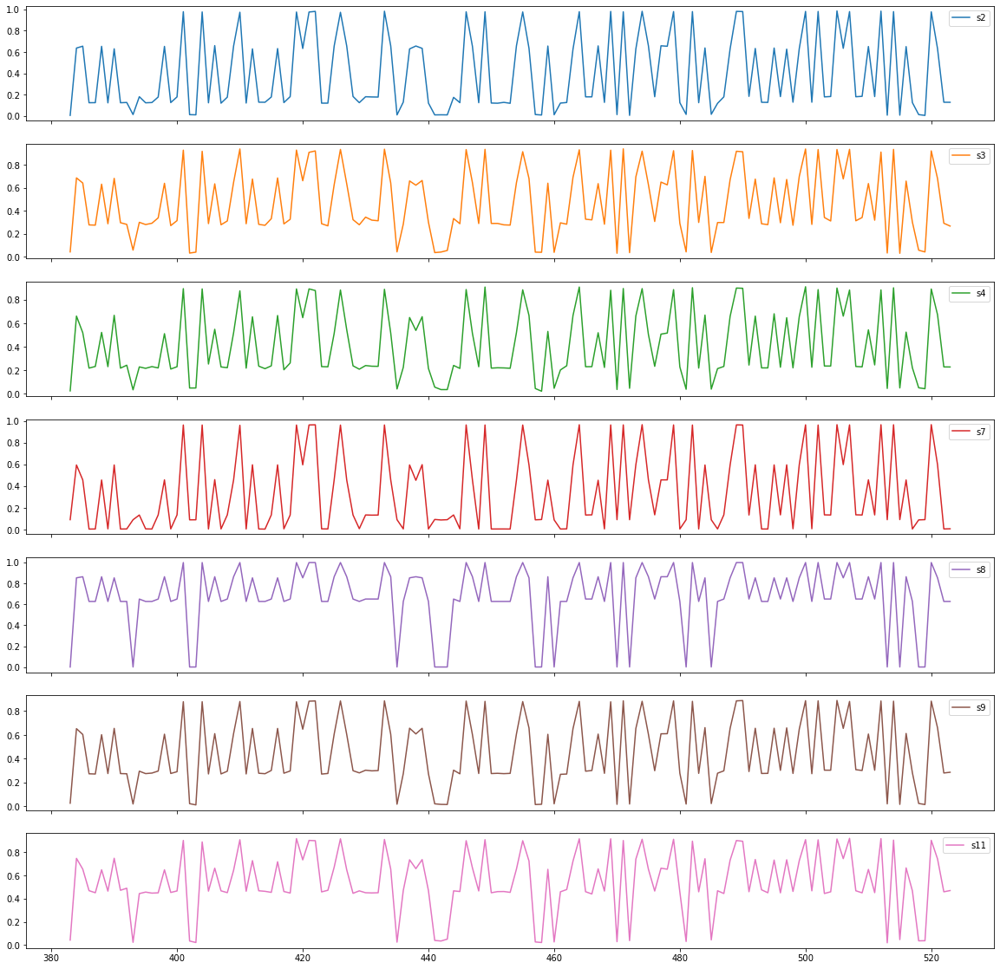

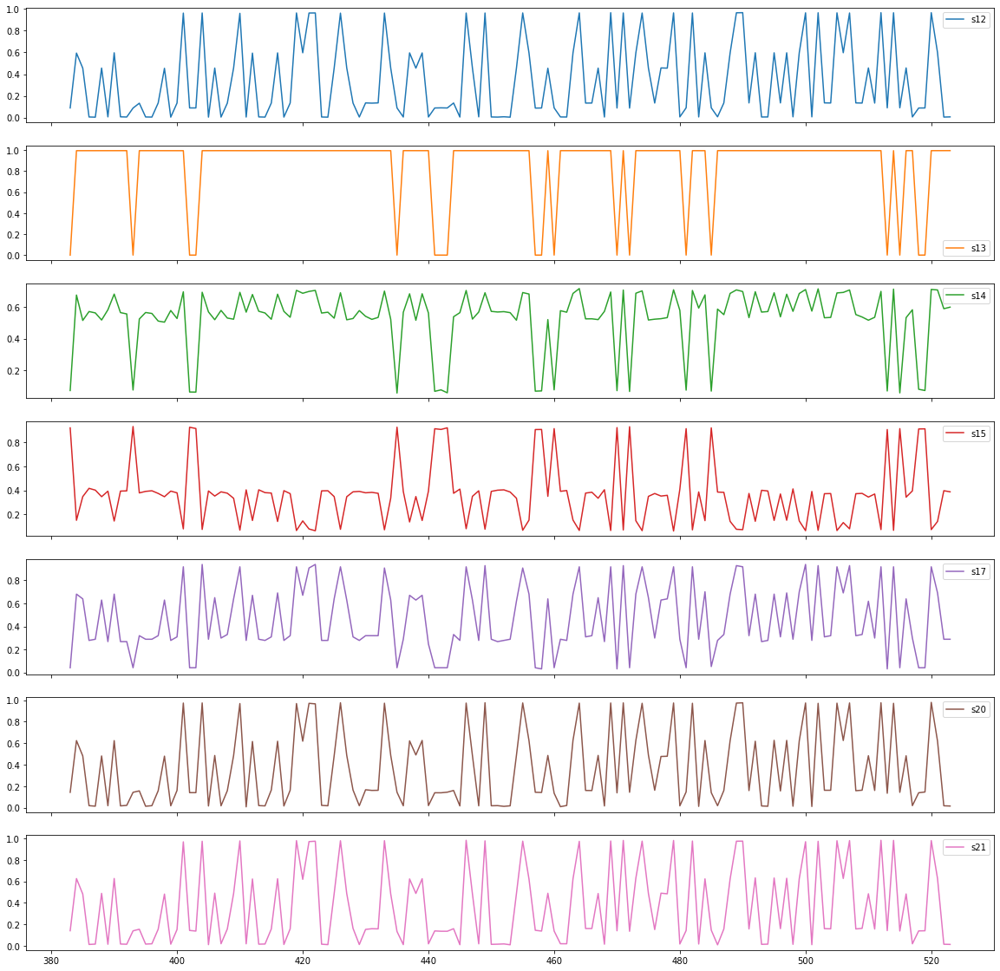

In [22]:
sequence_length = 35
sequence_length_ = 20  # length of sequence for each agent distraction
engine_id3 = test_df[test_df['id'] == 3]
engine_id3_50cycleWindow = engine_id3[engine_id3['RUL'] <= engine_id3['RUL'].min() + 50]
cols1 = ['s2', 's3', 's4', 's7', 's8', 's9', 's11']
engine_id3_50cycleWindow1 = engine_id3_50cycleWindow[cols1]
cols2 = ['s12', 's13', 's14', 's15', 's17', 's20', 's21']
engine_id3_50cycleWindow2 = engine_id3_50cycleWindow[cols2]

# plotting sensor data for engine ID 3 prior to a failure point - sensors 2, 3, 4, 7, 8, 9, 11
ax1 = engine_id3_50cycleWindow1.plot(subplots=True, sharex=True, figsize=(20,20))

# plotting sensor data for engine ID 3 prior to a failure point - sensors 12, 13, 14, 15, 17, 20, 21
ax2 = engine_id3_50cycleWindow2.plot(subplots=True, sharex=True, figsize=(20,20))

## Generate Train Data

In [23]:
# pick the feature columns
sensor_cols = ['s2', 's3', 's4', 's7', 's8', 's9', 's11', 's12', 's13', 's14', 's15', 's17', 's20', 's21']
sequence_cols = ['setting1', 'setting2', 'cycle_norm']
sequence_cols.extend(sensor_cols)

### generator train data for the sequences for each agent and save in a list

In [24]:
# Train data
# generator train data for the sequences for each agent and save in a list
data_array_ = {}
for i in train_df['id'].unique():
    seq_gen_ = (list(gen_sequence(train_df[train_df['id'] == id], sequence_length_, sequence_cols)) for id in [i])
    data_array_[i] = np.concatenate(list(seq_gen_)).astype(np.float32)

### generate train labels for each agent and save in a list

In [25]:
label_array_ = {}
# generate train labels for each agent and save in a list
for i in train_df['id'].unique():
    label_gen_ = (gen_labels(train_df[train_df['id'] == id], sequence_length_, ['label1']) for id in [i])
    label_array_[i] = np.concatenate(list(label_gen_)).astype(np.float32)

### Generate train labels based on RUL for each agent and save in a list

In [26]:
label_array_rul_ = {}
# Generate train labels based on RUL for each agent and save in a list
for i in train_df['id'].unique():
    label_gen_rul_ = (gen_labels(train_df[train_df['id'] == id], sequence_length_, ['RUL']) for id in [i])
    label_array_rul_[i] = np.concatenate(list(label_gen_rul_)).astype(np.int)

C:\Users\alibei\AppData\Local\Temp/ipykernel_1168/1920039281.py:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  label_array_rul_[i] = np.concatenate(list(label_gen_rul_)).astype(np.int)


In [27]:
# Find the minimum length of dataset for each agent
min_length = label_array_rul_[1].shape[0]
for i in train_df['id'].unique():
    if min_length > label_array_rul_[i].shape[0]:
        min_length = label_array_rul_[i].shape[0]

In [28]:
# set all length of lists to the minimum length of arrays
for i in train_df['id'].unique():
    label_array_rul_[i] = label_array_rul_[i][len(label_array_rul_[i]) - min_length:, :]
    label_array_[i] = label_array_[i][len(label_array_[i]) - min_length:, :]
    data_array_[i] = data_array_[i][len(data_array_[i]) - min_length:, :, :]
    
print(len(data_array_))
print(len(label_array_))
print(len(label_array_rul_))

print(data_array_[1].shape)
print(label_array_[1].shape)
print(label_array_rul_[1].shape)

249
249
249
(108, 20, 17)
(108, 1)
(108, 1)


### generator test data for the sequences for each agent and save in a list

In [29]:
# Test Data
# generator test data for the sequences for each agent and save in a list
seq_array_test_ = {}
for i in test_df['id'].unique():
    seq_gen_test_ = (list(gen_sequence(test_df[test_df['id'] == id], sequence_length_, sequence_cols)) for id in
                     [i])
    seq_array_test_[i] = np.concatenate(list(seq_gen_test_)).astype(np.float32)

### generate test labels for each agent and save in a list

In [30]:
label_array_test_ = {}
# generatAe test labels for each agent and save in a list
for i in test_df['id'].unique():
    label_gen_test_ = (gen_labels(test_df[test_df['id'] == id], sequence_length_, ['label1']) for id in [i])
    label_array_test_[i] = np.concatenate(list(label_gen_test_)).astype(np.float32)

### Generate test labels based on RUL for each agent and save in a list

In [31]:
label_array_test_rul_ = {}
# Generate test labels based on RUL for each agent and save in a list
for i in test_df['id'].unique():
    label_gen_test_rul_ = (gen_labels(test_df[test_df['id'] == id], sequence_length_, ['RUL']) for id in [i])
    label_array_test_rul_[i] = np.concatenate(list(label_gen_test_rul_)).astype(np.int)

C:\Users\alibei\AppData\Local\Temp/ipykernel_1168/500274830.py:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  label_array_test_rul_[i] = np.concatenate(list(label_gen_test_rul_)).astype(np.int)


### Select part of the train set which has the length longer than min_length

In [32]:
seq_array_test_tmp = {}
label_array_test_tmp = {}
label_array_test_rul_tmp = {}
for i in test_df['id'].unique():
    tmp = seq_array_test_[i].shape[0]
    if tmp >= min_length:
        seq_array_test_tmp[i] = seq_array_test_[i]
        label_array_test_tmp[i] = label_array_test_[i]
        label_array_test_rul_tmp[i] = label_array_test_rul_[i]

###  change the key of dictionary and indexing it based on increasing number from 1

In [33]:
# change the key of dictionary and indexing it based on increasing number from 1
seq_array_test_ = {}
label_array_test_ = {}
label_array_test_rul_ = {}
j = 1
for i in seq_array_test_tmp.keys():
    seq_array_test_[j] = seq_array_test_tmp[i]
    label_array_test_[j] = label_array_test_tmp[i]
    label_array_test_rul_[j] = label_array_test_rul_tmp[i]
    j += 1

del seq_array_test_tmp
del label_array_test_tmp
del label_array_test_rul_tmp

# set all length of test lists to the minimum length of arrays (min_length)
for i in seq_array_test_.keys():
    label_array_test_rul_[i] = label_array_test_rul_[i][len(label_array_test_rul_[i]) - min_length:, :]
    label_array_test_[i] = label_array_test_[i][len(label_array_test_[i]) - min_length:, :]
    seq_array_test_[i] = seq_array_test_[i][len(seq_array_test_[i]) - min_length:, :, :]

print(len(seq_array_test_))
print(len(label_array_test_))
print(len(label_array_test_rul_))

print(seq_array_test_[1].shape)
print(label_array_test_[1].shape)
print(label_array_test_rul_[1].shape)

X = {}
Y = {}
for i in data_array_.keys():
    X[i - 1] = data_array_[i].reshape(min_length, -1)
    Y[i - 1] = label_array_rul_[i]

X_test = {}
Y_test = {}
for i in seq_array_test_.keys():
    X_test[i - 1] = seq_array_test_[i].reshape(min_length, -1)
    Y_test[i - 1] = label_array_test_rul_[i]

151
151
151
(108, 20, 17)
(108, 1)
(108, 1)


## The main distributed LSTM model for 10 worker, in case of master and workers

In [34]:
num_workers = 10
array_params = [dict() for i in range(num_workers)]
J = [list() for i in range(num_workers)]

worker_model = {}
for worker_i in range(num_workers):
    worker_model[worker_i] = LSTM()
    array_params[worker_i] = worker_model[worker_i].init_random_params()

iteration_epoch = 3000
for i in range(iteration_epoch):
    print("Number of iteration:", i, "/from", iteration_epoch)
    for worker_i in range(num_workers):
        cost, array_params[worker_i] = worker_model[worker_i].train(X[worker_i], Y[worker_i],
                                                                    array_params[worker_i])
        J[worker_i].append(cost)

    for key in array_params[0]:  # Fed average
        tmp = array_params[0][key]
        for worker_i in range(1, num_workers):
            tmp = tmp + array_params[worker_i][key]
        for worker_i in range(num_workers):
            array_params[worker_i][key] = (1 / num_workers) * tmp  # Distribute aggregate parameters to all workers

Number of iteration: 0 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [115.4]
Epoch 1 	Batch: 50 - 75 	Loss: [115.4]
Epoch 2 	Batch: 50 - 75 	Loss: [115.39]
Epoch 3 	Batch: 50 - 75 	Loss: [115.36]
Epoch 0 	Batch: 50 - 75 	Loss: [115.41]
Epoch 1 	Batch: 50 - 75 	Loss: [115.4]
Epoch 2 	Batch: 50 - 75 	Loss: [115.38]
Epoch 3 	Batch: 50 - 75 	Loss: [115.36]
Epoch 0 	Batch: 50 - 75 	Loss: [115.4]
Epoch 1 	Batch: 50 - 75 	Loss: [115.4]
Epoch 2 	Batch: 50 - 75 	Loss: [115.37]
Epoch 3 	Batch: 50 - 75 	Loss: [115.34]
Epoch 0 	Batch: 50 - 75 	Loss: [115.41]
Epoch 1 	Batch: 50 - 75 	Loss: [115.41]
Epoch 2 	Batch: 50 - 75 	Loss: [115.39]
Epoch 3 	Batch: 50 - 75 	Loss: [115.36]
Epoch 0 	Batch: 50 - 75 	Loss: [115.4]
Epoch 1 	Batch: 50 - 75 	Loss: [115.4]
Epoch 2 	Batch: 50 - 75 	Loss: [115.38]
Epoch 3 	Batch: 50 - 75 	Loss: [115.35]
Epoch 0 	Batch: 50 - 75 	Loss: [115.41]
Epoch 1 	Batch: 50 - 75 	Loss: [115.41]
Epoch 2 	Batch: 50 - 75 	Loss: [115.39]
Epoch 3 	Batch: 50 - 75 	Loss: [115.36]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [115.01]
Epoch 2 	Batch: 50 - 75 	Loss: [114.98]
Epoch 3 	Batch: 50 - 75 	Loss: [114.95]
Epoch 0 	Batch: 50 - 75 	Loss: [114.98]
Epoch 1 	Batch: 50 - 75 	Loss: [114.96]
Epoch 2 	Batch: 50 - 75 	Loss: [114.93]
Epoch 3 	Batch: 50 - 75 	Loss: [114.89]
Epoch 0 	Batch: 50 - 75 	Loss: [115.05]
Epoch 1 	Batch: 50 - 75 	Loss: [115.03]
Epoch 2 	Batch: 50 - 75 	Loss: [115.01]
Epoch 3 	Batch: 50 - 75 	Loss: [114.98]
Epoch 0 	Batch: 50 - 75 	Loss: [115.02]
Epoch 1 	Batch: 50 - 75 	Loss: [115.]
Epoch 2 	Batch: 50 - 75 	Loss: [114.97]
Epoch 3 	Batch: 50 - 75 	Loss: [114.94]
Epoch 0 	Batch: 50 - 75 	Loss: [115.05]
Epoch 1 	Batch: 50 - 75 	Loss: [115.02]
Epoch 2 	Batch: 50 - 75 	Loss: [115.]
Epoch 3 	Batch: 50 - 75 	Loss: [114.97]
Epoch 0 	Batch: 50 - 75 	Loss: [115.05]
Epoch 1 	Batch: 50 - 75 	Loss: [115.03]
Epoch 2 	Batch: 50 - 75 	Loss: [115.]
Epoch 3 	Batch: 50 - 75 	Loss: [114.97]
Epoch 0 	Batch: 50 - 75 	Loss: [115.05]
Epoch 1 	Batch: 50 - 75 	Loss: [115.02]
Epoch 

Epoch 1 	Batch: 50 - 75 	Loss: [114.23]
Epoch 2 	Batch: 50 - 75 	Loss: [114.18]
Epoch 3 	Batch: 50 - 75 	Loss: [114.13]
Epoch 0 	Batch: 50 - 75 	Loss: [114.42]
Epoch 1 	Batch: 50 - 75 	Loss: [114.39]
Epoch 2 	Batch: 50 - 75 	Loss: [114.35]
Epoch 3 	Batch: 50 - 75 	Loss: [114.3]
Epoch 0 	Batch: 50 - 75 	Loss: [114.33]
Epoch 1 	Batch: 50 - 75 	Loss: [114.29]
Epoch 2 	Batch: 50 - 75 	Loss: [114.25]
Epoch 3 	Batch: 50 - 75 	Loss: [114.2]
Epoch 0 	Batch: 50 - 75 	Loss: [114.45]
Epoch 1 	Batch: 50 - 75 	Loss: [114.42]
Epoch 2 	Batch: 50 - 75 	Loss: [114.38]
Epoch 3 	Batch: 50 - 75 	Loss: [114.33]
Epoch 0 	Batch: 50 - 75 	Loss: [114.52]
Epoch 1 	Batch: 50 - 75 	Loss: [114.5]
Epoch 2 	Batch: 50 - 75 	Loss: [114.47]
Epoch 3 	Batch: 50 - 75 	Loss: [114.43]
Epoch 0 	Batch: 50 - 75 	Loss: [114.39]
Epoch 1 	Batch: 50 - 75 	Loss: [114.36]
Epoch 2 	Batch: 50 - 75 	Loss: [114.31]
Epoch 3 	Batch: 50 - 75 	Loss: [114.26]
Epoch 0 	Batch: 50 - 75 	Loss: [114.36]
Epoch 1 	Batch: 50 - 75 	Loss: [114.32]
Epo

Epoch 2 	Batch: 50 - 75 	Loss: [113.14]
Epoch 3 	Batch: 50 - 75 	Loss: [113.07]
Epoch 0 	Batch: 50 - 75 	Loss: [113.51]
Epoch 1 	Batch: 50 - 75 	Loss: [113.46]
Epoch 2 	Batch: 50 - 75 	Loss: [113.4]
Epoch 3 	Batch: 50 - 75 	Loss: [113.33]
Epoch 0 	Batch: 50 - 75 	Loss: [113.35]
Epoch 1 	Batch: 50 - 75 	Loss: [113.29]
Epoch 2 	Batch: 50 - 75 	Loss: [113.23]
Epoch 3 	Batch: 50 - 75 	Loss: [113.16]
Epoch 0 	Batch: 50 - 75 	Loss: [113.52]
Epoch 1 	Batch: 50 - 75 	Loss: [113.46]
Epoch 2 	Batch: 50 - 75 	Loss: [113.4]
Epoch 3 	Batch: 50 - 75 	Loss: [113.34]
Epoch 0 	Batch: 50 - 75 	Loss: [113.88]
Epoch 1 	Batch: 50 - 75 	Loss: [113.86]
Epoch 2 	Batch: 50 - 75 	Loss: [113.83]
Epoch 3 	Batch: 50 - 75 	Loss: [113.79]
Epoch 0 	Batch: 50 - 75 	Loss: [113.45]
Epoch 1 	Batch: 50 - 75 	Loss: [113.4]
Epoch 2 	Batch: 50 - 75 	Loss: [113.35]
Epoch 3 	Batch: 50 - 75 	Loss: [113.29]
Epoch 0 	Batch: 50 - 75 	Loss: [113.29]
Epoch 1 	Batch: 50 - 75 	Loss: [113.22]
Epoch 2 	Batch: 50 - 75 	Loss: [113.14]
Epo

Epoch 2 	Batch: 50 - 75 	Loss: [111.87]
Epoch 3 	Batch: 50 - 75 	Loss: [111.79]
Epoch 0 	Batch: 50 - 75 	Loss: [111.84]
Epoch 1 	Batch: 50 - 75 	Loss: [111.76]
Epoch 2 	Batch: 50 - 75 	Loss: [111.67]
Epoch 3 	Batch: 50 - 75 	Loss: [111.58]
Epoch 0 	Batch: 50 - 75 	Loss: [112.17]
Epoch 1 	Batch: 50 - 75 	Loss: [112.09]
Epoch 2 	Batch: 50 - 75 	Loss: [112.02]
Epoch 3 	Batch: 50 - 75 	Loss: [111.93]
Epoch 0 	Batch: 50 - 75 	Loss: [112.72]
Epoch 1 	Batch: 50 - 75 	Loss: [112.68]
Epoch 2 	Batch: 50 - 75 	Loss: [112.64]
Epoch 3 	Batch: 50 - 75 	Loss: [112.57]
Epoch 0 	Batch: 50 - 75 	Loss: [112.11]
Epoch 1 	Batch: 50 - 75 	Loss: [112.02]
Epoch 2 	Batch: 50 - 75 	Loss: [111.93]
Epoch 3 	Batch: 50 - 75 	Loss: [111.84]
Epoch 0 	Batch: 50 - 75 	Loss: [111.84]
Epoch 1 	Batch: 50 - 75 	Loss: [111.77]
Epoch 2 	Batch: 50 - 75 	Loss: [111.71]
Epoch 3 	Batch: 50 - 75 	Loss: [111.64]
Epoch 0 	Batch: 50 - 75 	Loss: [112.11]
Epoch 1 	Batch: 50 - 75 	Loss: [112.02]
Epoch 2 	Batch: 50 - 75 	Loss: [111.95]


Epoch 2 	Batch: 50 - 75 	Loss: [109.69]
Epoch 3 	Batch: 50 - 75 	Loss: [109.59]
Epoch 0 	Batch: 50 - 75 	Loss: [110.5]
Epoch 1 	Batch: 50 - 75 	Loss: [110.39]
Epoch 2 	Batch: 50 - 75 	Loss: [110.28]
Epoch 3 	Batch: 50 - 75 	Loss: [110.18]
Epoch 0 	Batch: 50 - 75 	Loss: [111.38]
Epoch 1 	Batch: 50 - 75 	Loss: [111.35]
Epoch 2 	Batch: 50 - 75 	Loss: [111.3]
Epoch 3 	Batch: 50 - 75 	Loss: [111.25]
Epoch 0 	Batch: 50 - 75 	Loss: [110.25]
Epoch 1 	Batch: 50 - 75 	Loss: [110.16]
Epoch 2 	Batch: 50 - 75 	Loss: [110.06]
Epoch 3 	Batch: 50 - 75 	Loss: [109.96]
Epoch 0 	Batch: 50 - 75 	Loss: [110.06]
Epoch 1 	Batch: 50 - 75 	Loss: [109.94]
Epoch 2 	Batch: 50 - 75 	Loss: [109.82]
Epoch 3 	Batch: 50 - 75 	Loss: [109.71]
Epoch 0 	Batch: 50 - 75 	Loss: [110.24]
Epoch 1 	Batch: 50 - 75 	Loss: [110.12]
Epoch 2 	Batch: 50 - 75 	Loss: [110.]
Epoch 3 	Batch: 50 - 75 	Loss: [109.88]
Number of iteration: 26 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [110.39]
Epoch 1 	Batch: 50 - 75 	Loss: [110.29]
Epoch 2 	

Epoch 3 	Batch: 50 - 75 	Loss: [107.95]
Epoch 0 	Batch: 50 - 75 	Loss: [110.]
Epoch 1 	Batch: 50 - 75 	Loss: [109.91]
Epoch 2 	Batch: 50 - 75 	Loss: [109.81]
Epoch 3 	Batch: 50 - 75 	Loss: [109.71]
Epoch 0 	Batch: 50 - 75 	Loss: [108.2]
Epoch 1 	Batch: 50 - 75 	Loss: [108.08]
Epoch 2 	Batch: 50 - 75 	Loss: [107.95]
Epoch 3 	Batch: 50 - 75 	Loss: [107.82]
Epoch 0 	Batch: 50 - 75 	Loss: [107.84]
Epoch 1 	Batch: 50 - 75 	Loss: [107.73]
Epoch 2 	Batch: 50 - 75 	Loss: [107.61]
Epoch 3 	Batch: 50 - 75 	Loss: [107.49]
Epoch 0 	Batch: 50 - 75 	Loss: [107.9]
Epoch 1 	Batch: 50 - 75 	Loss: [107.79]
Epoch 2 	Batch: 50 - 75 	Loss: [107.66]
Epoch 3 	Batch: 50 - 75 	Loss: [107.55]
Number of iteration: 31 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [108.11]
Epoch 1 	Batch: 50 - 75 	Loss: [107.98]
Epoch 2 	Batch: 50 - 75 	Loss: [107.85]
Epoch 3 	Batch: 50 - 75 	Loss: [107.7]
Epoch 0 	Batch: 50 - 75 	Loss: [107.87]
Epoch 1 	Batch: 50 - 75 	Loss: [107.76]
Epoch 2 	Batch: 50 - 75 	Loss: [107.63]
Epoch 3 	B

Epoch 0 	Batch: 50 - 75 	Loss: [105.71]
Epoch 1 	Batch: 50 - 75 	Loss: [105.58]
Epoch 2 	Batch: 50 - 75 	Loss: [105.44]
Epoch 3 	Batch: 50 - 75 	Loss: [105.29]
Epoch 0 	Batch: 50 - 75 	Loss: [105.35]
Epoch 1 	Batch: 50 - 75 	Loss: [105.24]
Epoch 2 	Batch: 50 - 75 	Loss: [105.11]
Epoch 3 	Batch: 50 - 75 	Loss: [104.98]
Epoch 0 	Batch: 50 - 75 	Loss: [105.43]
Epoch 1 	Batch: 50 - 75 	Loss: [105.33]
Epoch 2 	Batch: 50 - 75 	Loss: [105.21]
Epoch 3 	Batch: 50 - 75 	Loss: [105.07]
Number of iteration: 36 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [105.58]
Epoch 1 	Batch: 50 - 75 	Loss: [105.53]
Epoch 2 	Batch: 50 - 75 	Loss: [105.47]
Epoch 3 	Batch: 50 - 75 	Loss: [105.34]
Epoch 0 	Batch: 50 - 75 	Loss: [105.33]
Epoch 1 	Batch: 50 - 75 	Loss: [105.21]
Epoch 2 	Batch: 50 - 75 	Loss: [105.07]
Epoch 3 	Batch: 50 - 75 	Loss: [104.93]
Epoch 0 	Batch: 50 - 75 	Loss: [104.55]
Epoch 1 	Batch: 50 - 75 	Loss: [104.42]
Epoch 2 	Batch: 50 - 75 	Loss: [104.28]
Epoch 3 	Batch: 50 - 75 	Loss: [104.14]
Epoch

Epoch 2 	Batch: 50 - 75 	Loss: [103.08]
Epoch 3 	Batch: 50 - 75 	Loss: [102.93]
Epoch 0 	Batch: 50 - 75 	Loss: [102.64]
Epoch 1 	Batch: 50 - 75 	Loss: [102.5]
Epoch 2 	Batch: 50 - 75 	Loss: [102.34]
Epoch 3 	Batch: 50 - 75 	Loss: [102.19]
Epoch 0 	Batch: 50 - 75 	Loss: [102.62]
Epoch 1 	Batch: 50 - 75 	Loss: [102.49]
Epoch 2 	Batch: 50 - 75 	Loss: [102.33]
Epoch 3 	Batch: 50 - 75 	Loss: [102.18]
Number of iteration: 41 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [102.91]
Epoch 1 	Batch: 50 - 75 	Loss: [102.76]
Epoch 2 	Batch: 50 - 75 	Loss: [102.6]
Epoch 3 	Batch: 50 - 75 	Loss: [102.44]
Epoch 0 	Batch: 50 - 75 	Loss: [102.71]
Epoch 1 	Batch: 50 - 75 	Loss: [102.58]
Epoch 2 	Batch: 50 - 75 	Loss: [102.44]
Epoch 3 	Batch: 50 - 75 	Loss: [102.3]
Epoch 0 	Batch: 50 - 75 	Loss: [101.81]
Epoch 1 	Batch: 50 - 75 	Loss: [101.69]
Epoch 2 	Batch: 50 - 75 	Loss: [101.54]
Epoch 3 	Batch: 50 - 75 	Loss: [101.39]
Epoch 0 	Batch: 50 - 75 	Loss: [102.92]
Epoch 1 	Batch: 50 - 75 	Loss: [102.8]
Epoch 2 	

Epoch 0 	Batch: 50 - 75 	Loss: [99.61]
Epoch 1 	Batch: 50 - 75 	Loss: [99.46]
Epoch 2 	Batch: 50 - 75 	Loss: [99.3]
Epoch 3 	Batch: 50 - 75 	Loss: [99.13]
Number of iteration: 46 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [99.86]
Epoch 1 	Batch: 50 - 75 	Loss: [99.77]
Epoch 2 	Batch: 50 - 75 	Loss: [99.64]
Epoch 3 	Batch: 50 - 75 	Loss: [99.49]
Epoch 0 	Batch: 50 - 75 	Loss: [100.15]
Epoch 1 	Batch: 50 - 75 	Loss: [100.09]
Epoch 2 	Batch: 50 - 75 	Loss: [99.99]
Epoch 3 	Batch: 50 - 75 	Loss: [99.88]
Epoch 0 	Batch: 50 - 75 	Loss: [98.9]
Epoch 1 	Batch: 50 - 75 	Loss: [98.75]
Epoch 2 	Batch: 50 - 75 	Loss: [98.6]
Epoch 3 	Batch: 50 - 75 	Loss: [98.45]
Epoch 0 	Batch: 50 - 75 	Loss: [100.28]
Epoch 1 	Batch: 50 - 75 	Loss: [100.15]
Epoch 2 	Batch: 50 - 75 	Loss: [100.02]
Epoch 3 	Batch: 50 - 75 	Loss: [99.88]
Epoch 0 	Batch: 50 - 75 	Loss: [99.18]
Epoch 1 	Batch: 50 - 75 	Loss: [99.07]
Epoch 2 	Batch: 50 - 75 	Loss: [98.92]
Epoch 3 	Batch: 50 - 75 	Loss: [98.77]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [96.69]
Epoch 3 	Batch: 50 - 75 	Loss: [96.52]
Epoch 0 	Batch: 50 - 75 	Loss: [97.56]
Epoch 1 	Batch: 50 - 75 	Loss: [97.42]
Epoch 2 	Batch: 50 - 75 	Loss: [97.27]
Epoch 3 	Batch: 50 - 75 	Loss: [97.12]
Epoch 0 	Batch: 50 - 75 	Loss: [95.78]
Epoch 1 	Batch: 50 - 75 	Loss: [95.62]
Epoch 2 	Batch: 50 - 75 	Loss: [95.46]
Epoch 3 	Batch: 50 - 75 	Loss: [95.29]
Epoch 0 	Batch: 50 - 75 	Loss: [97.73]
Epoch 1 	Batch: 50 - 75 	Loss: [97.6]
Epoch 2 	Batch: 50 - 75 	Loss: [97.45]
Epoch 3 	Batch: 50 - 75 	Loss: [97.31]
Epoch 0 	Batch: 50 - 75 	Loss: [96.32]
Epoch 1 	Batch: 50 - 75 	Loss: [96.18]
Epoch 2 	Batch: 50 - 75 	Loss: [96.02]
Epoch 3 	Batch: 50 - 75 	Loss: [95.85]
Epoch 0 	Batch: 50 - 75 	Loss: [96.7]
Epoch 1 	Batch: 50 - 75 	Loss: [96.55]
Epoch 2 	Batch: 50 - 75 	Loss: [96.39]
Epoch 3 	Batch: 50 - 75 	Loss: [96.23]
Epoch 0 	Batch: 50 - 75 	Loss: [103.01]
Epoch 1 	Batch: 50 - 75 	Loss: [102.9]
Epoch 2 	Batch: 50 - 75 	Loss: [102.76]
Epoch 3 	Batch: 50 - 75 	

Epoch 0 	Batch: 50 - 75 	Loss: [92.64]
Epoch 1 	Batch: 50 - 75 	Loss: [92.48]
Epoch 2 	Batch: 50 - 75 	Loss: [92.32]
Epoch 3 	Batch: 50 - 75 	Loss: [92.15]
Epoch 0 	Batch: 50 - 75 	Loss: [94.93]
Epoch 1 	Batch: 50 - 75 	Loss: [94.8]
Epoch 2 	Batch: 50 - 75 	Loss: [94.65]
Epoch 3 	Batch: 50 - 75 	Loss: [94.5]
Epoch 0 	Batch: 50 - 75 	Loss: [93.33]
Epoch 1 	Batch: 50 - 75 	Loss: [93.19]
Epoch 2 	Batch: 50 - 75 	Loss: [93.03]
Epoch 3 	Batch: 50 - 75 	Loss: [92.86]
Epoch 0 	Batch: 50 - 75 	Loss: [93.63]
Epoch 1 	Batch: 50 - 75 	Loss: [93.48]
Epoch 2 	Batch: 50 - 75 	Loss: [93.33]
Epoch 3 	Batch: 50 - 75 	Loss: [93.16]
Epoch 0 	Batch: 50 - 75 	Loss: [100.89]
Epoch 1 	Batch: 50 - 75 	Loss: [100.77]
Epoch 2 	Batch: 50 - 75 	Loss: [100.65]
Epoch 3 	Batch: 50 - 75 	Loss: [100.53]
Epoch 0 	Batch: 50 - 75 	Loss: [94.53]
Epoch 1 	Batch: 50 - 75 	Loss: [94.38]
Epoch 2 	Batch: 50 - 75 	Loss: [94.23]
Epoch 3 	Batch: 50 - 75 	Loss: [94.07]
Epoch 0 	Batch: 50 - 75 	Loss: [92.63]
Epoch 1 	Batch: 50 - 75

Epoch 0 	Batch: 50 - 75 	Loss: [90.31]
Epoch 1 	Batch: 50 - 75 	Loss: [90.17]
Epoch 2 	Batch: 50 - 75 	Loss: [90.]
Epoch 3 	Batch: 50 - 75 	Loss: [89.83]
Epoch 0 	Batch: 50 - 75 	Loss: [90.53]
Epoch 1 	Batch: 50 - 75 	Loss: [90.36]
Epoch 2 	Batch: 50 - 75 	Loss: [90.2]
Epoch 3 	Batch: 50 - 75 	Loss: [90.02]
Epoch 0 	Batch: 50 - 75 	Loss: [98.53]
Epoch 1 	Batch: 50 - 75 	Loss: [98.4]
Epoch 2 	Batch: 50 - 75 	Loss: [98.3]
Epoch 3 	Batch: 50 - 75 	Loss: [98.18]
Epoch 0 	Batch: 50 - 75 	Loss: [91.65]
Epoch 1 	Batch: 50 - 75 	Loss: [91.53]
Epoch 2 	Batch: 50 - 75 	Loss: [91.39]
Epoch 3 	Batch: 50 - 75 	Loss: [91.24]
Epoch 0 	Batch: 50 - 75 	Loss: [89.38]
Epoch 1 	Batch: 50 - 75 	Loss: [89.22]
Epoch 2 	Batch: 50 - 75 	Loss: [89.05]
Epoch 3 	Batch: 50 - 75 	Loss: [88.88]
Epoch 0 	Batch: 50 - 75 	Loss: [89.55]
Epoch 1 	Batch: 50 - 75 	Loss: [89.4]
Epoch 2 	Batch: 50 - 75 	Loss: [89.24]
Epoch 3 	Batch: 50 - 75 	Loss: [89.07]
Number of iteration: 62 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [90.

Epoch 3 	Batch: 50 - 75 	Loss: [86.92]
Epoch 0 	Batch: 50 - 75 	Loss: [96.35]
Epoch 1 	Batch: 50 - 75 	Loss: [96.23]
Epoch 2 	Batch: 50 - 75 	Loss: [96.09]
Epoch 3 	Batch: 50 - 75 	Loss: [95.96]
Epoch 0 	Batch: 50 - 75 	Loss: [88.73]
Epoch 1 	Batch: 50 - 75 	Loss: [88.58]
Epoch 2 	Batch: 50 - 75 	Loss: [88.42]
Epoch 3 	Batch: 50 - 75 	Loss: [88.26]
Epoch 0 	Batch: 50 - 75 	Loss: [86.12]
Epoch 1 	Batch: 50 - 75 	Loss: [85.96]
Epoch 2 	Batch: 50 - 75 	Loss: [85.8]
Epoch 3 	Batch: 50 - 75 	Loss: [85.62]
Epoch 0 	Batch: 50 - 75 	Loss: [86.38]
Epoch 1 	Batch: 50 - 75 	Loss: [86.23]
Epoch 2 	Batch: 50 - 75 	Loss: [86.05]
Epoch 3 	Batch: 50 - 75 	Loss: [85.87]
Number of iteration: 67 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [87.09]
Epoch 1 	Batch: 50 - 75 	Loss: [86.94]
Epoch 2 	Batch: 50 - 75 	Loss: [86.78]
Epoch 3 	Batch: 50 - 75 	Loss: [86.61]
Epoch 0 	Batch: 50 - 75 	Loss: [88.43]
Epoch 1 	Batch: 50 - 75 	Loss: [88.3]
Epoch 2 	Batch: 50 - 75 	Loss: [88.16]
Epoch 3 	Batch: 50 - 75 	Loss: 

Epoch 1 	Batch: 50 - 75 	Loss: [82.66]
Epoch 2 	Batch: 50 - 75 	Loss: [82.49]
Epoch 3 	Batch: 50 - 75 	Loss: [82.31]
Epoch 0 	Batch: 50 - 75 	Loss: [83.04]
Epoch 1 	Batch: 50 - 75 	Loss: [82.87]
Epoch 2 	Batch: 50 - 75 	Loss: [82.7]
Epoch 3 	Batch: 50 - 75 	Loss: [82.53]
Number of iteration: 72 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [84.07]
Epoch 1 	Batch: 50 - 75 	Loss: [83.91]
Epoch 2 	Batch: 50 - 75 	Loss: [83.75]
Epoch 3 	Batch: 50 - 75 	Loss: [83.58]
Epoch 0 	Batch: 50 - 75 	Loss: [85.64]
Epoch 1 	Batch: 50 - 75 	Loss: [85.5]
Epoch 2 	Batch: 50 - 75 	Loss: [85.35]
Epoch 3 	Batch: 50 - 75 	Loss: [85.19]
Epoch 0 	Batch: 50 - 75 	Loss: [82.43]
Epoch 1 	Batch: 50 - 75 	Loss: [82.28]
Epoch 2 	Batch: 50 - 75 	Loss: [82.12]
Epoch 3 	Batch: 50 - 75 	Loss: [81.95]
Epoch 0 	Batch: 50 - 75 	Loss: [85.96]
Epoch 1 	Batch: 50 - 75 	Loss: [85.84]
Epoch 2 	Batch: 50 - 75 	Loss: [85.69]
Epoch 3 	Batch: 50 - 75 	Loss: [85.55]
Epoch 0 	Batch: 50 - 75 	Loss: [83.54]
Epoch 1 	Batch: 50 - 75 	Loss: 

Number of iteration: 77 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [80.9]
Epoch 1 	Batch: 50 - 75 	Loss: [80.75]
Epoch 2 	Batch: 50 - 75 	Loss: [80.58]
Epoch 3 	Batch: 50 - 75 	Loss: [80.41]
Epoch 0 	Batch: 50 - 75 	Loss: [82.8]
Epoch 1 	Batch: 50 - 75 	Loss: [82.67]
Epoch 2 	Batch: 50 - 75 	Loss: [82.53]
Epoch 3 	Batch: 50 - 75 	Loss: [82.38]
Epoch 0 	Batch: 50 - 75 	Loss: [79.32]
Epoch 1 	Batch: 50 - 75 	Loss: [79.17]
Epoch 2 	Batch: 50 - 75 	Loss: [79.01]
Epoch 3 	Batch: 50 - 75 	Loss: [78.84]
Epoch 0 	Batch: 50 - 75 	Loss: [83.27]
Epoch 1 	Batch: 50 - 75 	Loss: [83.14]
Epoch 2 	Batch: 50 - 75 	Loss: [83.]
Epoch 3 	Batch: 50 - 75 	Loss: [82.85]
Epoch 0 	Batch: 50 - 75 	Loss: [80.48]
Epoch 1 	Batch: 50 - 75 	Loss: [80.35]
Epoch 2 	Batch: 50 - 75 	Loss: [80.18]
Epoch 3 	Batch: 50 - 75 	Loss: [80.01]
Epoch 0 	Batch: 50 - 75 	Loss: [80.62]
Epoch 1 	Batch: 50 - 75 	Loss: [80.46]
Epoch 2 	Batch: 50 - 75 	Loss: [80.3]
Epoch 3 	Batch: 50 - 75 	Loss: [80.13]
Epoch 0 	Batch: 50 - 75 	Loss: [91

Epoch 0 	Batch: 50 - 75 	Loss: [76.4]
Epoch 1 	Batch: 50 - 75 	Loss: [76.25]
Epoch 2 	Batch: 50 - 75 	Loss: [76.11]
Epoch 3 	Batch: 50 - 75 	Loss: [75.96]
Epoch 0 	Batch: 50 - 75 	Loss: [80.61]
Epoch 1 	Batch: 50 - 75 	Loss: [80.48]
Epoch 2 	Batch: 50 - 75 	Loss: [80.33]
Epoch 3 	Batch: 50 - 75 	Loss: [80.19]
Epoch 0 	Batch: 50 - 75 	Loss: [77.45]
Epoch 1 	Batch: 50 - 75 	Loss: [77.32]
Epoch 2 	Batch: 50 - 75 	Loss: [77.16]
Epoch 3 	Batch: 50 - 75 	Loss: [76.99]
Epoch 0 	Batch: 50 - 75 	Loss: [77.56]
Epoch 1 	Batch: 50 - 75 	Loss: [77.4]
Epoch 2 	Batch: 50 - 75 	Loss: [77.23]
Epoch 3 	Batch: 50 - 75 	Loss: [77.05]
Epoch 0 	Batch: 50 - 75 	Loss: [88.89]
Epoch 1 	Batch: 50 - 75 	Loss: [88.76]
Epoch 2 	Batch: 50 - 75 	Loss: [88.63]
Epoch 3 	Batch: 50 - 75 	Loss: [88.51]
Epoch 0 	Batch: 50 - 75 	Loss: [79.52]
Epoch 1 	Batch: 50 - 75 	Loss: [79.4]
Epoch 2 	Batch: 50 - 75 	Loss: [79.25]
Epoch 3 	Batch: 50 - 75 	Loss: [79.11]
Epoch 0 	Batch: 50 - 75 	Loss: [75.64]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [77.63]
Epoch 0 	Batch: 50 - 75 	Loss: [74.46]
Epoch 1 	Batch: 50 - 75 	Loss: [74.33]
Epoch 2 	Batch: 50 - 75 	Loss: [74.17]
Epoch 3 	Batch: 50 - 75 	Loss: [74.]
Epoch 0 	Batch: 50 - 75 	Loss: [74.42]
Epoch 1 	Batch: 50 - 75 	Loss: [74.27]
Epoch 2 	Batch: 50 - 75 	Loss: [74.11]
Epoch 3 	Batch: 50 - 75 	Loss: [73.96]
Epoch 0 	Batch: 50 - 75 	Loss: [86.34]
Epoch 1 	Batch: 50 - 75 	Loss: [86.21]
Epoch 2 	Batch: 50 - 75 	Loss: [86.08]
Epoch 3 	Batch: 50 - 75 	Loss: [85.95]
Epoch 0 	Batch: 50 - 75 	Loss: [76.85]
Epoch 1 	Batch: 50 - 75 	Loss: [76.72]
Epoch 2 	Batch: 50 - 75 	Loss: [76.57]
Epoch 3 	Batch: 50 - 75 	Loss: [76.42]
Epoch 0 	Batch: 50 - 75 	Loss: [72.54]
Epoch 1 	Batch: 50 - 75 	Loss: [72.37]
Epoch 2 	Batch: 50 - 75 	Loss: [72.2]
Epoch 3 	Batch: 50 - 75 	Loss: [72.03]
Epoch 0 	Batch: 50 - 75 	Loss: [72.93]
Epoch 1 	Batch: 50 - 75 	Loss: [72.77]
Epoch 2 	Batch: 50 - 75 	Loss: [72.6]
Epoch 3 	Batch: 50 - 75 	Loss: [72.44]
Number of iteration: 88 /from

Epoch 2 	Batch: 50 - 75 	Loss: [71.12]
Epoch 3 	Batch: 50 - 75 	Loss: [70.96]
Epoch 0 	Batch: 50 - 75 	Loss: [83.83]
Epoch 1 	Batch: 50 - 75 	Loss: [83.73]
Epoch 2 	Batch: 50 - 75 	Loss: [83.61]
Epoch 3 	Batch: 50 - 75 	Loss: [83.49]
Epoch 0 	Batch: 50 - 75 	Loss: [74.11]
Epoch 1 	Batch: 50 - 75 	Loss: [74.01]
Epoch 2 	Batch: 50 - 75 	Loss: [73.86]
Epoch 3 	Batch: 50 - 75 	Loss: [73.74]
Epoch 0 	Batch: 50 - 75 	Loss: [69.44]
Epoch 1 	Batch: 50 - 75 	Loss: [69.28]
Epoch 2 	Batch: 50 - 75 	Loss: [69.13]
Epoch 3 	Batch: 50 - 75 	Loss: [68.96]
Epoch 0 	Batch: 50 - 75 	Loss: [69.92]
Epoch 1 	Batch: 50 - 75 	Loss: [69.78]
Epoch 2 	Batch: 50 - 75 	Loss: [69.63]
Epoch 3 	Batch: 50 - 75 	Loss: [69.48]
Number of iteration: 93 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [71.32]
Epoch 1 	Batch: 50 - 75 	Loss: [71.21]
Epoch 2 	Batch: 50 - 75 	Loss: [71.07]
Epoch 3 	Batch: 50 - 75 	Loss: [70.92]
Epoch 0 	Batch: 50 - 75 	Loss: [73.91]
Epoch 1 	Batch: 50 - 75 	Loss: [73.77]
Epoch 2 	Batch: 50 - 75 	Loss

Epoch 1 	Batch: 50 - 75 	Loss: [71.39]
Epoch 2 	Batch: 50 - 75 	Loss: [71.25]
Epoch 3 	Batch: 50 - 75 	Loss: [71.1]
Epoch 0 	Batch: 50 - 75 	Loss: [66.32]
Epoch 1 	Batch: 50 - 75 	Loss: [66.16]
Epoch 2 	Batch: 50 - 75 	Loss: [66.]
Epoch 3 	Batch: 50 - 75 	Loss: [65.84]
Epoch 0 	Batch: 50 - 75 	Loss: [67.03]
Epoch 1 	Batch: 50 - 75 	Loss: [66.88]
Epoch 2 	Batch: 50 - 75 	Loss: [66.72]
Epoch 3 	Batch: 50 - 75 	Loss: [66.56]
Number of iteration: 98 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [68.59]
Epoch 1 	Batch: 50 - 75 	Loss: [68.45]
Epoch 2 	Batch: 50 - 75 	Loss: [68.29]
Epoch 3 	Batch: 50 - 75 	Loss: [68.13]
Epoch 0 	Batch: 50 - 75 	Loss: [71.14]
Epoch 1 	Batch: 50 - 75 	Loss: [71.]
Epoch 2 	Batch: 50 - 75 	Loss: [70.86]
Epoch 3 	Batch: 50 - 75 	Loss: [70.71]
Epoch 0 	Batch: 50 - 75 	Loss: [67.52]
Epoch 1 	Batch: 50 - 75 	Loss: [67.38]
Epoch 2 	Batch: 50 - 75 	Loss: [67.24]
Epoch 3 	Batch: 50 - 75 	Loss: [67.08]
Epoch 0 	Batch: 50 - 75 	Loss: [72.48]
Epoch 1 	Batch: 50 - 75 	Loss: [72

Number of iteration: 103 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [65.65]
Epoch 1 	Batch: 50 - 75 	Loss: [65.51]
Epoch 2 	Batch: 50 - 75 	Loss: [65.35]
Epoch 3 	Batch: 50 - 75 	Loss: [65.2]
Epoch 0 	Batch: 50 - 75 	Loss: [68.39]
Epoch 1 	Batch: 50 - 75 	Loss: [68.26]
Epoch 2 	Batch: 50 - 75 	Loss: [68.12]
Epoch 3 	Batch: 50 - 75 	Loss: [67.97]
Epoch 0 	Batch: 50 - 75 	Loss: [64.64]
Epoch 1 	Batch: 50 - 75 	Loss: [64.5]
Epoch 2 	Batch: 50 - 75 	Loss: [64.36]
Epoch 3 	Batch: 50 - 75 	Loss: [64.21]
Epoch 0 	Batch: 50 - 75 	Loss: [69.93]
Epoch 1 	Batch: 50 - 75 	Loss: [69.82]
Epoch 2 	Batch: 50 - 75 	Loss: [69.69]
Epoch 3 	Batch: 50 - 75 	Loss: [69.56]
Epoch 0 	Batch: 50 - 75 	Loss: [65.23]
Epoch 1 	Batch: 50 - 75 	Loss: [65.1]
Epoch 2 	Batch: 50 - 75 	Loss: [64.95]
Epoch 3 	Batch: 50 - 75 	Loss: [64.8]
Epoch 0 	Batch: 50 - 75 	Loss: [64.87]
Epoch 1 	Batch: 50 - 75 	Loss: [64.73]
Epoch 2 	Batch: 50 - 75 	Loss: [64.57]
Epoch 3 	Batch: 50 - 75 	Loss: [64.42]
Epoch 0 	Batch: 50 - 75 	Loss: [

Epoch 0 	Batch: 50 - 75 	Loss: [61.81]
Epoch 1 	Batch: 50 - 75 	Loss: [61.68]
Epoch 2 	Batch: 50 - 75 	Loss: [61.54]
Epoch 3 	Batch: 50 - 75 	Loss: [61.39]
Epoch 0 	Batch: 50 - 75 	Loss: [67.44]
Epoch 1 	Batch: 50 - 75 	Loss: [67.34]
Epoch 2 	Batch: 50 - 75 	Loss: [67.22]
Epoch 3 	Batch: 50 - 75 	Loss: [67.1]
Epoch 0 	Batch: 50 - 75 	Loss: [62.42]
Epoch 1 	Batch: 50 - 75 	Loss: [62.31]
Epoch 2 	Batch: 50 - 75 	Loss: [62.16]
Epoch 3 	Batch: 50 - 75 	Loss: [62.01]
Epoch 0 	Batch: 50 - 75 	Loss: [62.04]
Epoch 1 	Batch: 50 - 75 	Loss: [61.9]
Epoch 2 	Batch: 50 - 75 	Loss: [61.75]
Epoch 3 	Batch: 50 - 75 	Loss: [61.61]
Epoch 0 	Batch: 50 - 75 	Loss: [75.49]
Epoch 1 	Batch: 50 - 75 	Loss: [75.38]
Epoch 2 	Batch: 50 - 75 	Loss: [75.25]
Epoch 3 	Batch: 50 - 75 	Loss: [75.1]
Epoch 0 	Batch: 50 - 75 	Loss: [65.69]
Epoch 1 	Batch: 50 - 75 	Loss: [65.59]
Epoch 2 	Batch: 50 - 75 	Loss: [65.45]
Epoch 3 	Batch: 50 - 75 	Loss: [65.32]
Epoch 0 	Batch: 50 - 75 	Loss: [59.68]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [59.4]
Epoch 3 	Batch: 50 - 75 	Loss: [59.25]
Epoch 0 	Batch: 50 - 75 	Loss: [59.28]
Epoch 1 	Batch: 50 - 75 	Loss: [59.16]
Epoch 2 	Batch: 50 - 75 	Loss: [59.02]
Epoch 3 	Batch: 50 - 75 	Loss: [58.89]
Epoch 0 	Batch: 50 - 75 	Loss: [72.94]
Epoch 1 	Batch: 50 - 75 	Loss: [72.81]
Epoch 2 	Batch: 50 - 75 	Loss: [72.66]
Epoch 3 	Batch: 50 - 75 	Loss: [72.51]
Epoch 0 	Batch: 50 - 75 	Loss: [63.18]
Epoch 1 	Batch: 50 - 75 	Loss: [63.05]
Epoch 2 	Batch: 50 - 75 	Loss: [62.91]
Epoch 3 	Batch: 50 - 75 	Loss: [62.77]
Epoch 0 	Batch: 50 - 75 	Loss: [56.79]
Epoch 1 	Batch: 50 - 75 	Loss: [56.65]
Epoch 2 	Batch: 50 - 75 	Loss: [56.51]
Epoch 3 	Batch: 50 - 75 	Loss: [56.37]
Epoch 0 	Batch: 50 - 75 	Loss: [57.92]
Epoch 1 	Batch: 50 - 75 	Loss: [57.81]
Epoch 2 	Batch: 50 - 75 	Loss: [57.68]
Epoch 3 	Batch: 50 - 75 	Loss: [57.54]
Number of iteration: 114 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [59.38]
Epoch 1 	Batch: 50 - 75 	Loss: [59.25]
Epoch 2 	Batch: 50 - 75 	Loss

Epoch 2 	Batch: 50 - 75 	Loss: [70.11]
Epoch 3 	Batch: 50 - 75 	Loss: [69.99]
Epoch 0 	Batch: 50 - 75 	Loss: [60.64]
Epoch 1 	Batch: 50 - 75 	Loss: [60.53]
Epoch 2 	Batch: 50 - 75 	Loss: [60.4]
Epoch 3 	Batch: 50 - 75 	Loss: [60.26]
Epoch 0 	Batch: 50 - 75 	Loss: [54.02]
Epoch 1 	Batch: 50 - 75 	Loss: [53.88]
Epoch 2 	Batch: 50 - 75 	Loss: [53.74]
Epoch 3 	Batch: 50 - 75 	Loss: [53.6]
Epoch 0 	Batch: 50 - 75 	Loss: [55.33]
Epoch 1 	Batch: 50 - 75 	Loss: [55.2]
Epoch 2 	Batch: 50 - 75 	Loss: [55.06]
Epoch 3 	Batch: 50 - 75 	Loss: [54.93]
Number of iteration: 119 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [56.75]
Epoch 1 	Batch: 50 - 75 	Loss: [56.63]
Epoch 2 	Batch: 50 - 75 	Loss: [56.49]
Epoch 3 	Batch: 50 - 75 	Loss: [56.34]
Epoch 0 	Batch: 50 - 75 	Loss: [59.7]
Epoch 1 	Batch: 50 - 75 	Loss: [59.56]
Epoch 2 	Batch: 50 - 75 	Loss: [59.42]
Epoch 3 	Batch: 50 - 75 	Loss: [59.28]
Epoch 0 	Batch: 50 - 75 	Loss: [55.95]
Epoch 1 	Batch: 50 - 75 	Loss: [55.83]
Epoch 2 	Batch: 50 - 75 	Loss: [

Epoch 2 	Batch: 50 - 75 	Loss: [51.05]
Epoch 3 	Batch: 50 - 75 	Loss: [50.91]
Epoch 0 	Batch: 50 - 75 	Loss: [52.82]
Epoch 1 	Batch: 50 - 75 	Loss: [52.7]
Epoch 2 	Batch: 50 - 75 	Loss: [52.56]
Epoch 3 	Batch: 50 - 75 	Loss: [52.43]
Number of iteration: 124 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [54.16]
Epoch 1 	Batch: 50 - 75 	Loss: [54.04]
Epoch 2 	Batch: 50 - 75 	Loss: [53.91]
Epoch 3 	Batch: 50 - 75 	Loss: [53.77]
Epoch 0 	Batch: 50 - 75 	Loss: [56.98]
Epoch 1 	Batch: 50 - 75 	Loss: [56.85]
Epoch 2 	Batch: 50 - 75 	Loss: [56.71]
Epoch 3 	Batch: 50 - 75 	Loss: [56.57]
Epoch 0 	Batch: 50 - 75 	Loss: [53.42]
Epoch 1 	Batch: 50 - 75 	Loss: [53.3]
Epoch 2 	Batch: 50 - 75 	Loss: [53.18]
Epoch 3 	Batch: 50 - 75 	Loss: [53.04]
Epoch 0 	Batch: 50 - 75 	Loss: [59.47]
Epoch 1 	Batch: 50 - 75 	Loss: [59.35]
Epoch 2 	Batch: 50 - 75 	Loss: [59.22]
Epoch 3 	Batch: 50 - 75 	Loss: [59.09]
Epoch 0 	Batch: 50 - 75 	Loss: [53.87]
Epoch 1 	Batch: 50 - 75 	Loss: [53.77]
Epoch 2 	Batch: 50 - 75 	Loss:

Epoch 1 	Batch: 50 - 75 	Loss: [51.55]
Epoch 2 	Batch: 50 - 75 	Loss: [51.41]
Epoch 3 	Batch: 50 - 75 	Loss: [51.28]
Epoch 0 	Batch: 50 - 75 	Loss: [54.27]
Epoch 1 	Batch: 50 - 75 	Loss: [54.13]
Epoch 2 	Batch: 50 - 75 	Loss: [53.99]
Epoch 3 	Batch: 50 - 75 	Loss: [53.85]
Epoch 0 	Batch: 50 - 75 	Loss: [50.99]
Epoch 1 	Batch: 50 - 75 	Loss: [50.88]
Epoch 2 	Batch: 50 - 75 	Loss: [50.76]
Epoch 3 	Batch: 50 - 75 	Loss: [50.63]
Epoch 0 	Batch: 50 - 75 	Loss: [57.02]
Epoch 1 	Batch: 50 - 75 	Loss: [56.92]
Epoch 2 	Batch: 50 - 75 	Loss: [56.79]
Epoch 3 	Batch: 50 - 75 	Loss: [56.67]
Epoch 0 	Batch: 50 - 75 	Loss: [51.35]
Epoch 1 	Batch: 50 - 75 	Loss: [51.26]
Epoch 2 	Batch: 50 - 75 	Loss: [51.13]
Epoch 3 	Batch: 50 - 75 	Loss: [50.99]
Epoch 0 	Batch: 50 - 75 	Loss: [50.83]
Epoch 1 	Batch: 50 - 75 	Loss: [50.7]
Epoch 2 	Batch: 50 - 75 	Loss: [50.57]
Epoch 3 	Batch: 50 - 75 	Loss: [50.44]
Epoch 0 	Batch: 50 - 75 	Loss: [64.82]
Epoch 1 	Batch: 50 - 75 	Loss: [64.7]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [48.62]
Epoch 1 	Batch: 50 - 75 	Loss: [48.52]
Epoch 2 	Batch: 50 - 75 	Loss: [48.4]
Epoch 3 	Batch: 50 - 75 	Loss: [48.28]
Epoch 0 	Batch: 50 - 75 	Loss: [54.65]
Epoch 1 	Batch: 50 - 75 	Loss: [54.54]
Epoch 2 	Batch: 50 - 75 	Loss: [54.41]
Epoch 3 	Batch: 50 - 75 	Loss: [54.29]
Epoch 0 	Batch: 50 - 75 	Loss: [48.91]
Epoch 1 	Batch: 50 - 75 	Loss: [48.8]
Epoch 2 	Batch: 50 - 75 	Loss: [48.66]
Epoch 3 	Batch: 50 - 75 	Loss: [48.53]
Epoch 0 	Batch: 50 - 75 	Loss: [48.33]
Epoch 1 	Batch: 50 - 75 	Loss: [48.2]
Epoch 2 	Batch: 50 - 75 	Loss: [48.08]
Epoch 3 	Batch: 50 - 75 	Loss: [47.95]
Epoch 0 	Batch: 50 - 75 	Loss: [62.25]
Epoch 1 	Batch: 50 - 75 	Loss: [62.13]
Epoch 2 	Batch: 50 - 75 	Loss: [62.]
Epoch 3 	Batch: 50 - 75 	Loss: [61.86]
Epoch 0 	Batch: 50 - 75 	Loss: [52.88]
Epoch 1 	Batch: 50 - 75 	Loss: [52.76]
Epoch 2 	Batch: 50 - 75 	Loss: [52.64]
Epoch 3 	Batch: 50 - 75 	Loss: [52.51]
Epoch 0 	Batch: 50 - 75 	Loss: [45.68]
Epoch 1 	Batch: 50 - 75 	Loss:

Epoch 1 	Batch: 50 - 75 	Loss: [46.38]
Epoch 2 	Batch: 50 - 75 	Loss: [46.25]
Epoch 3 	Batch: 50 - 75 	Loss: [46.12]
Epoch 0 	Batch: 50 - 75 	Loss: [45.9]
Epoch 1 	Batch: 50 - 75 	Loss: [45.78]
Epoch 2 	Batch: 50 - 75 	Loss: [45.66]
Epoch 3 	Batch: 50 - 75 	Loss: [45.54]
Epoch 0 	Batch: 50 - 75 	Loss: [59.7]
Epoch 1 	Batch: 50 - 75 	Loss: [59.58]
Epoch 2 	Batch: 50 - 75 	Loss: [59.45]
Epoch 3 	Batch: 50 - 75 	Loss: [59.31]
Epoch 0 	Batch: 50 - 75 	Loss: [50.56]
Epoch 1 	Batch: 50 - 75 	Loss: [50.44]
Epoch 2 	Batch: 50 - 75 	Loss: [50.32]
Epoch 3 	Batch: 50 - 75 	Loss: [50.2]
Epoch 0 	Batch: 50 - 75 	Loss: [43.26]
Epoch 1 	Batch: 50 - 75 	Loss: [43.15]
Epoch 2 	Batch: 50 - 75 	Loss: [43.03]
Epoch 3 	Batch: 50 - 75 	Loss: [42.91]
Epoch 0 	Batch: 50 - 75 	Loss: [44.93]
Epoch 1 	Batch: 50 - 75 	Loss: [44.82]
Epoch 2 	Batch: 50 - 75 	Loss: [44.7]
Epoch 3 	Batch: 50 - 75 	Loss: [44.57]
Number of iteration: 140 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [46.37]
Epoch 1 	Batch: 50 - 75 	Loss: [

Epoch 1 	Batch: 50 - 75 	Loss: [57.04]
Epoch 2 	Batch: 50 - 75 	Loss: [56.91]
Epoch 3 	Batch: 50 - 75 	Loss: [56.78]
Epoch 0 	Batch: 50 - 75 	Loss: [48.31]
Epoch 1 	Batch: 50 - 75 	Loss: [48.21]
Epoch 2 	Batch: 50 - 75 	Loss: [48.09]
Epoch 3 	Batch: 50 - 75 	Loss: [47.97]
Epoch 0 	Batch: 50 - 75 	Loss: [40.95]
Epoch 1 	Batch: 50 - 75 	Loss: [40.84]
Epoch 2 	Batch: 50 - 75 	Loss: [40.73]
Epoch 3 	Batch: 50 - 75 	Loss: [40.61]
Epoch 0 	Batch: 50 - 75 	Loss: [42.58]
Epoch 1 	Batch: 50 - 75 	Loss: [42.47]
Epoch 2 	Batch: 50 - 75 	Loss: [42.35]
Epoch 3 	Batch: 50 - 75 	Loss: [42.23]
Number of iteration: 145 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [44.09]
Epoch 1 	Batch: 50 - 75 	Loss: [43.98]
Epoch 2 	Batch: 50 - 75 	Loss: [43.86]
Epoch 3 	Batch: 50 - 75 	Loss: [43.75]
Epoch 0 	Batch: 50 - 75 	Loss: [45.98]
Epoch 1 	Batch: 50 - 75 	Loss: [45.87]
Epoch 2 	Batch: 50 - 75 	Loss: [45.74]
Epoch 3 	Batch: 50 - 75 	Loss: [45.61]
Epoch 0 	Batch: 50 - 75 	Loss: [43.69]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [38.62]
Epoch 2 	Batch: 50 - 75 	Loss: [38.51]
Epoch 3 	Batch: 50 - 75 	Loss: [38.4]
Epoch 0 	Batch: 50 - 75 	Loss: [40.3]
Epoch 1 	Batch: 50 - 75 	Loss: [40.19]
Epoch 2 	Batch: 50 - 75 	Loss: [40.08]
Epoch 3 	Batch: 50 - 75 	Loss: [39.96]
Number of iteration: 150 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [41.89]
Epoch 1 	Batch: 50 - 75 	Loss: [41.78]
Epoch 2 	Batch: 50 - 75 	Loss: [41.67]
Epoch 3 	Batch: 50 - 75 	Loss: [41.55]
Epoch 0 	Batch: 50 - 75 	Loss: [43.58]
Epoch 1 	Batch: 50 - 75 	Loss: [43.46]
Epoch 2 	Batch: 50 - 75 	Loss: [43.34]
Epoch 3 	Batch: 50 - 75 	Loss: [43.22]
Epoch 0 	Batch: 50 - 75 	Loss: [41.57]
Epoch 1 	Batch: 50 - 75 	Loss: [41.47]
Epoch 2 	Batch: 50 - 75 	Loss: [41.37]
Epoch 3 	Batch: 50 - 75 	Loss: [41.26]
Epoch 0 	Batch: 50 - 75 	Loss: [47.44]
Epoch 1 	Batch: 50 - 75 	Loss: [47.34]
Epoch 2 	Batch: 50 - 75 	Loss: [47.22]
Epoch 3 	Batch: 50 - 75 	Loss: [47.11]
Epoch 0 	Batch: 50 - 75 	Loss: [41.43]
Epoch 1 	Batch: 50 - 75 	Loss:

Number of iteration: 155 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [39.76]
Epoch 1 	Batch: 50 - 75 	Loss: [39.67]
Epoch 2 	Batch: 50 - 75 	Loss: [39.56]
Epoch 3 	Batch: 50 - 75 	Loss: [39.45]
Epoch 0 	Batch: 50 - 75 	Loss: [41.26]
Epoch 1 	Batch: 50 - 75 	Loss: [41.15]
Epoch 2 	Batch: 50 - 75 	Loss: [41.03]
Epoch 3 	Batch: 50 - 75 	Loss: [40.92]
Epoch 0 	Batch: 50 - 75 	Loss: [39.52]
Epoch 1 	Batch: 50 - 75 	Loss: [39.42]
Epoch 2 	Batch: 50 - 75 	Loss: [39.32]
Epoch 3 	Batch: 50 - 75 	Loss: [39.22]
Epoch 0 	Batch: 50 - 75 	Loss: [45.32]
Epoch 1 	Batch: 50 - 75 	Loss: [45.22]
Epoch 2 	Batch: 50 - 75 	Loss: [45.11]
Epoch 3 	Batch: 50 - 75 	Loss: [45.]
Epoch 0 	Batch: 50 - 75 	Loss: [39.28]
Epoch 1 	Batch: 50 - 75 	Loss: [39.18]
Epoch 2 	Batch: 50 - 75 	Loss: [39.07]
Epoch 3 	Batch: 50 - 75 	Loss: [38.95]
Epoch 0 	Batch: 50 - 75 	Loss: [38.77]
Epoch 1 	Batch: 50 - 75 	Loss: [38.67]
Epoch 2 	Batch: 50 - 75 	Loss: [38.56]
Epoch 3 	Batch: 50 - 75 	Loss: [38.45]
Epoch 0 	Batch: 50 - 75 	Loss:

Epoch 0 	Batch: 50 - 75 	Loss: [37.54]
Epoch 1 	Batch: 50 - 75 	Loss: [37.45]
Epoch 2 	Batch: 50 - 75 	Loss: [37.35]
Epoch 3 	Batch: 50 - 75 	Loss: [37.25]
Epoch 0 	Batch: 50 - 75 	Loss: [43.28]
Epoch 1 	Batch: 50 - 75 	Loss: [43.18]
Epoch 2 	Batch: 50 - 75 	Loss: [43.07]
Epoch 3 	Batch: 50 - 75 	Loss: [42.97]
Epoch 0 	Batch: 50 - 75 	Loss: [37.21]
Epoch 1 	Batch: 50 - 75 	Loss: [37.12]
Epoch 2 	Batch: 50 - 75 	Loss: [37.01]
Epoch 3 	Batch: 50 - 75 	Loss: [36.9]
Epoch 0 	Batch: 50 - 75 	Loss: [36.74]
Epoch 1 	Batch: 50 - 75 	Loss: [36.64]
Epoch 2 	Batch: 50 - 75 	Loss: [36.54]
Epoch 3 	Batch: 50 - 75 	Loss: [36.43]
Epoch 0 	Batch: 50 - 75 	Loss: [49.34]
Epoch 1 	Batch: 50 - 75 	Loss: [49.23]
Epoch 2 	Batch: 50 - 75 	Loss: [49.11]
Epoch 3 	Batch: 50 - 75 	Loss: [48.99]
Epoch 0 	Batch: 50 - 75 	Loss: [41.55]
Epoch 1 	Batch: 50 - 75 	Loss: [41.45]
Epoch 2 	Batch: 50 - 75 	Loss: [41.34]
Epoch 3 	Batch: 50 - 75 	Loss: [41.23]
Epoch 0 	Batch: 50 - 75 	Loss: [34.18]
Epoch 1 	Batch: 50 - 75 	L

Epoch 2 	Batch: 50 - 75 	Loss: [35.05]
Epoch 3 	Batch: 50 - 75 	Loss: [34.94]
Epoch 0 	Batch: 50 - 75 	Loss: [34.8]
Epoch 1 	Batch: 50 - 75 	Loss: [34.7]
Epoch 2 	Batch: 50 - 75 	Loss: [34.61]
Epoch 3 	Batch: 50 - 75 	Loss: [34.51]
Epoch 0 	Batch: 50 - 75 	Loss: [47.04]
Epoch 1 	Batch: 50 - 75 	Loss: [46.93]
Epoch 2 	Batch: 50 - 75 	Loss: [46.82]
Epoch 3 	Batch: 50 - 75 	Loss: [46.7]
Epoch 0 	Batch: 50 - 75 	Loss: [39.57]
Epoch 1 	Batch: 50 - 75 	Loss: [39.47]
Epoch 2 	Batch: 50 - 75 	Loss: [39.37]
Epoch 3 	Batch: 50 - 75 	Loss: [39.27]
Epoch 0 	Batch: 50 - 75 	Loss: [32.26]
Epoch 1 	Batch: 50 - 75 	Loss: [32.17]
Epoch 2 	Batch: 50 - 75 	Loss: [32.08]
Epoch 3 	Batch: 50 - 75 	Loss: [31.98]
Epoch 0 	Batch: 50 - 75 	Loss: [33.56]
Epoch 1 	Batch: 50 - 75 	Loss: [33.46]
Epoch 2 	Batch: 50 - 75 	Loss: [33.36]
Epoch 3 	Batch: 50 - 75 	Loss: [33.26]
Number of iteration: 166 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [35.33]
Epoch 1 	Batch: 50 - 75 	Loss: [35.24]
Epoch 2 	Batch: 50 - 75 	Loss: 

Epoch 1 	Batch: 50 - 75 	Loss: [44.7]
Epoch 2 	Batch: 50 - 75 	Loss: [44.59]
Epoch 3 	Batch: 50 - 75 	Loss: [44.47]
Epoch 0 	Batch: 50 - 75 	Loss: [37.66]
Epoch 1 	Batch: 50 - 75 	Loss: [37.57]
Epoch 2 	Batch: 50 - 75 	Loss: [37.47]
Epoch 3 	Batch: 50 - 75 	Loss: [37.38]
Epoch 0 	Batch: 50 - 75 	Loss: [30.44]
Epoch 1 	Batch: 50 - 75 	Loss: [30.36]
Epoch 2 	Batch: 50 - 75 	Loss: [30.27]
Epoch 3 	Batch: 50 - 75 	Loss: [30.17]
Epoch 0 	Batch: 50 - 75 	Loss: [31.66]
Epoch 1 	Batch: 50 - 75 	Loss: [31.57]
Epoch 2 	Batch: 50 - 75 	Loss: [31.47]
Epoch 3 	Batch: 50 - 75 	Loss: [31.37]
Number of iteration: 171 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [33.46]
Epoch 1 	Batch: 50 - 75 	Loss: [33.37]
Epoch 2 	Batch: 50 - 75 	Loss: [33.28]
Epoch 3 	Batch: 50 - 75 	Loss: [33.18]
Epoch 0 	Batch: 50 - 75 	Loss: [34.65]
Epoch 1 	Batch: 50 - 75 	Loss: [34.58]
Epoch 2 	Batch: 50 - 75 	Loss: [34.51]
Epoch 3 	Batch: 50 - 75 	Loss: [34.48]
Epoch 0 	Batch: 50 - 75 	Loss: [33.43]
Epoch 1 	Batch: 50 - 75 	Loss

Epoch 3 	Batch: 50 - 75 	Loss: [28.48]
Epoch 0 	Batch: 50 - 75 	Loss: [29.87]
Epoch 1 	Batch: 50 - 75 	Loss: [29.79]
Epoch 2 	Batch: 50 - 75 	Loss: [29.7]
Epoch 3 	Batch: 50 - 75 	Loss: [29.61]
Number of iteration: 176 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [31.73]
Epoch 1 	Batch: 50 - 75 	Loss: [31.66]
Epoch 2 	Batch: 50 - 75 	Loss: [31.58]
Epoch 3 	Batch: 50 - 75 	Loss: [31.51]
Epoch 0 	Batch: 50 - 75 	Loss: [34.05]
Epoch 1 	Batch: 50 - 75 	Loss: [33.96]
Epoch 2 	Batch: 50 - 75 	Loss: [33.87]
Epoch 3 	Batch: 50 - 75 	Loss: [33.77]
Epoch 0 	Batch: 50 - 75 	Loss: [31.72]
Epoch 1 	Batch: 50 - 75 	Loss: [31.64]
Epoch 2 	Batch: 50 - 75 	Loss: [31.55]
Epoch 3 	Batch: 50 - 75 	Loss: [31.47]
Epoch 0 	Batch: 50 - 75 	Loss: [37.27]
Epoch 1 	Batch: 50 - 75 	Loss: [37.19]
Epoch 2 	Batch: 50 - 75 	Loss: [37.11]
Epoch 3 	Batch: 50 - 75 	Loss: [37.02]
Epoch 0 	Batch: 50 - 75 	Loss: [31.2]
Epoch 1 	Batch: 50 - 75 	Loss: [31.13]
Epoch 2 	Batch: 50 - 75 	Loss: [31.03]
Epoch 3 	Batch: 50 - 75 	Loss:

Epoch 3 	Batch: 50 - 75 	Loss: [29.89]
Epoch 0 	Batch: 50 - 75 	Loss: [32.18]
Epoch 1 	Batch: 50 - 75 	Loss: [32.08]
Epoch 2 	Batch: 50 - 75 	Loss: [31.99]
Epoch 3 	Batch: 50 - 75 	Loss: [31.9]
Epoch 0 	Batch: 50 - 75 	Loss: [30.06]
Epoch 1 	Batch: 50 - 75 	Loss: [29.99]
Epoch 2 	Batch: 50 - 75 	Loss: [29.91]
Epoch 3 	Batch: 50 - 75 	Loss: [29.83]
Epoch 0 	Batch: 50 - 75 	Loss: [35.7]
Epoch 1 	Batch: 50 - 75 	Loss: [35.62]
Epoch 2 	Batch: 50 - 75 	Loss: [35.53]
Epoch 3 	Batch: 50 - 75 	Loss: [35.43]
Epoch 0 	Batch: 50 - 75 	Loss: [29.69]
Epoch 1 	Batch: 50 - 75 	Loss: [29.61]
Epoch 2 	Batch: 50 - 75 	Loss: [29.52]
Epoch 3 	Batch: 50 - 75 	Loss: [29.43]
Epoch 0 	Batch: 50 - 75 	Loss: [29.44]
Epoch 1 	Batch: 50 - 75 	Loss: [29.37]
Epoch 2 	Batch: 50 - 75 	Loss: [29.3]
Epoch 3 	Batch: 50 - 75 	Loss: [29.23]
Epoch 0 	Batch: 50 - 75 	Loss: [40.35]
Epoch 1 	Batch: 50 - 75 	Loss: [40.25]
Epoch 2 	Batch: 50 - 75 	Loss: [40.15]
Epoch 3 	Batch: 50 - 75 	Loss: [40.04]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [33.9]
Epoch 2 	Batch: 50 - 75 	Loss: [33.82]
Epoch 3 	Batch: 50 - 75 	Loss: [33.73]
Epoch 0 	Batch: 50 - 75 	Loss: [28.04]
Epoch 1 	Batch: 50 - 75 	Loss: [27.97]
Epoch 2 	Batch: 50 - 75 	Loss: [27.88]
Epoch 3 	Batch: 50 - 75 	Loss: [27.8]
Epoch 0 	Batch: 50 - 75 	Loss: [27.91]
Epoch 1 	Batch: 50 - 75 	Loss: [27.83]
Epoch 2 	Batch: 50 - 75 	Loss: [27.75]
Epoch 3 	Batch: 50 - 75 	Loss: [27.67]
Epoch 0 	Batch: 50 - 75 	Loss: [38.34]
Epoch 1 	Batch: 50 - 75 	Loss: [38.24]
Epoch 2 	Batch: 50 - 75 	Loss: [38.14]
Epoch 3 	Batch: 50 - 75 	Loss: [38.04]
Epoch 0 	Batch: 50 - 75 	Loss: [32.15]
Epoch 1 	Batch: 50 - 75 	Loss: [32.07]
Epoch 2 	Batch: 50 - 75 	Loss: [31.99]
Epoch 3 	Batch: 50 - 75 	Loss: [31.9]
Epoch 0 	Batch: 50 - 75 	Loss: [25.24]
Epoch 1 	Batch: 50 - 75 	Loss: [25.17]
Epoch 2 	Batch: 50 - 75 	Loss: [25.09]
Epoch 3 	Batch: 50 - 75 	Loss: [25.01]
Epoch 0 	Batch: 50 - 75 	Loss: [26.26]
Epoch 1 	Batch: 50 - 75 	Loss: [26.18]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [26.39]
Epoch 1 	Batch: 50 - 75 	Loss: [26.31]
Epoch 2 	Batch: 50 - 75 	Loss: [26.24]
Epoch 3 	Batch: 50 - 75 	Loss: [26.16]
Epoch 0 	Batch: 50 - 75 	Loss: [36.4]
Epoch 1 	Batch: 50 - 75 	Loss: [36.31]
Epoch 2 	Batch: 50 - 75 	Loss: [36.21]
Epoch 3 	Batch: 50 - 75 	Loss: [36.11]
Epoch 0 	Batch: 50 - 75 	Loss: [30.54]
Epoch 1 	Batch: 50 - 75 	Loss: [30.47]
Epoch 2 	Batch: 50 - 75 	Loss: [30.39]
Epoch 3 	Batch: 50 - 75 	Loss: [30.3]
Epoch 0 	Batch: 50 - 75 	Loss: [23.78]
Epoch 1 	Batch: 50 - 75 	Loss: [23.71]
Epoch 2 	Batch: 50 - 75 	Loss: [23.64]
Epoch 3 	Batch: 50 - 75 	Loss: [23.57]
Epoch 0 	Batch: 50 - 75 	Loss: [24.73]
Epoch 1 	Batch: 50 - 75 	Loss: [24.66]
Epoch 2 	Batch: 50 - 75 	Loss: [24.59]
Epoch 3 	Batch: 50 - 75 	Loss: [24.51]
Number of iteration: 192 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [26.63]
Epoch 1 	Batch: 50 - 75 	Loss: [26.56]
Epoch 2 	Batch: 50 - 75 	Loss: [26.48]
Epoch 3 	Batch: 50 - 75 	Loss: [26.4]
Epoch 0 	Batch: 50 - 75 	Loss: 

Epoch 1 	Batch: 50 - 75 	Loss: [28.93]
Epoch 2 	Batch: 50 - 75 	Loss: [28.85]
Epoch 3 	Batch: 50 - 75 	Loss: [28.77]
Epoch 0 	Batch: 50 - 75 	Loss: [22.4]
Epoch 1 	Batch: 50 - 75 	Loss: [22.34]
Epoch 2 	Batch: 50 - 75 	Loss: [22.27]
Epoch 3 	Batch: 50 - 75 	Loss: [22.2]
Epoch 0 	Batch: 50 - 75 	Loss: [23.29]
Epoch 1 	Batch: 50 - 75 	Loss: [23.22]
Epoch 2 	Batch: 50 - 75 	Loss: [23.15]
Epoch 3 	Batch: 50 - 75 	Loss: [23.08]
Number of iteration: 197 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [25.16]
Epoch 1 	Batch: 50 - 75 	Loss: [25.09]
Epoch 2 	Batch: 50 - 75 	Loss: [25.01]
Epoch 3 	Batch: 50 - 75 	Loss: [24.94]
Epoch 0 	Batch: 50 - 75 	Loss: [26.72]
Epoch 1 	Batch: 50 - 75 	Loss: [26.65]
Epoch 2 	Batch: 50 - 75 	Loss: [26.57]
Epoch 3 	Batch: 50 - 75 	Loss: [26.49]
Epoch 0 	Batch: 50 - 75 	Loss: [25.18]
Epoch 1 	Batch: 50 - 75 	Loss: [25.11]
Epoch 2 	Batch: 50 - 75 	Loss: [25.04]
Epoch 3 	Batch: 50 - 75 	Loss: [24.97]
Epoch 0 	Batch: 50 - 75 	Loss: [30.46]
Epoch 1 	Batch: 50 - 75 	Loss:

Epoch 1 	Batch: 50 - 75 	Loss: [21.85]
Epoch 2 	Batch: 50 - 75 	Loss: [21.79]
Epoch 3 	Batch: 50 - 75 	Loss: [21.72]
Number of iteration: 202 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [23.75]
Epoch 1 	Batch: 50 - 75 	Loss: [23.69]
Epoch 2 	Batch: 50 - 75 	Loss: [23.62]
Epoch 3 	Batch: 50 - 75 	Loss: [23.54]
Epoch 0 	Batch: 50 - 75 	Loss: [25.2]
Epoch 1 	Batch: 50 - 75 	Loss: [25.13]
Epoch 2 	Batch: 50 - 75 	Loss: [25.05]
Epoch 3 	Batch: 50 - 75 	Loss: [24.98]
Epoch 0 	Batch: 50 - 75 	Loss: [23.78]
Epoch 1 	Batch: 50 - 75 	Loss: [23.72]
Epoch 2 	Batch: 50 - 75 	Loss: [23.65]
Epoch 3 	Batch: 50 - 75 	Loss: [23.58]
Epoch 0 	Batch: 50 - 75 	Loss: [28.97]
Epoch 1 	Batch: 50 - 75 	Loss: [28.9]
Epoch 2 	Batch: 50 - 75 	Loss: [28.82]
Epoch 3 	Batch: 50 - 75 	Loss: [28.74]
Epoch 0 	Batch: 50 - 75 	Loss: [23.33]
Epoch 1 	Batch: 50 - 75 	Loss: [23.27]
Epoch 2 	Batch: 50 - 75 	Loss: [23.2]
Epoch 3 	Batch: 50 - 75 	Loss: [23.13]
Epoch 0 	Batch: 50 - 75 	Loss: [23.32]
Epoch 1 	Batch: 50 - 75 	Loss: 

Epoch 0 	Batch: 50 - 75 	Loss: [23.76]
Epoch 1 	Batch: 50 - 75 	Loss: [23.69]
Epoch 2 	Batch: 50 - 75 	Loss: [23.62]
Epoch 3 	Batch: 50 - 75 	Loss: [23.55]
Epoch 0 	Batch: 50 - 75 	Loss: [22.45]
Epoch 1 	Batch: 50 - 75 	Loss: [22.39]
Epoch 2 	Batch: 50 - 75 	Loss: [22.33]
Epoch 3 	Batch: 50 - 75 	Loss: [22.26]
Epoch 0 	Batch: 50 - 75 	Loss: [27.54]
Epoch 1 	Batch: 50 - 75 	Loss: [27.48]
Epoch 2 	Batch: 50 - 75 	Loss: [27.4]
Epoch 3 	Batch: 50 - 75 	Loss: [27.33]
Epoch 0 	Batch: 50 - 75 	Loss: [22.02]
Epoch 1 	Batch: 50 - 75 	Loss: [21.97]
Epoch 2 	Batch: 50 - 75 	Loss: [21.9]
Epoch 3 	Batch: 50 - 75 	Loss: [21.83]
Epoch 0 	Batch: 50 - 75 	Loss: [22.04]
Epoch 1 	Batch: 50 - 75 	Loss: [21.97]
Epoch 2 	Batch: 50 - 75 	Loss: [21.91]
Epoch 3 	Batch: 50 - 75 	Loss: [21.84]
Epoch 0 	Batch: 50 - 75 	Loss: [30.7]
Epoch 1 	Batch: 50 - 75 	Loss: [30.62]
Epoch 2 	Batch: 50 - 75 	Loss: [30.54]
Epoch 3 	Batch: 50 - 75 	Loss: [30.45]
Epoch 0 	Batch: 50 - 75 	Loss: [25.83]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [26.18]
Epoch 1 	Batch: 50 - 75 	Loss: [26.12]
Epoch 2 	Batch: 50 - 75 	Loss: [26.05]
Epoch 3 	Batch: 50 - 75 	Loss: [25.98]
Epoch 0 	Batch: 50 - 75 	Loss: [20.78]
Epoch 1 	Batch: 50 - 75 	Loss: [20.72]
Epoch 2 	Batch: 50 - 75 	Loss: [20.66]
Epoch 3 	Batch: 50 - 75 	Loss: [20.59]
Epoch 0 	Batch: 50 - 75 	Loss: [20.82]
Epoch 1 	Batch: 50 - 75 	Loss: [20.76]
Epoch 2 	Batch: 50 - 75 	Loss: [20.7]
Epoch 3 	Batch: 50 - 75 	Loss: [20.63]
Epoch 0 	Batch: 50 - 75 	Loss: [29.08]
Epoch 1 	Batch: 50 - 75 	Loss: [29.01]
Epoch 2 	Batch: 50 - 75 	Loss: [28.93]
Epoch 3 	Batch: 50 - 75 	Loss: [28.85]
Epoch 0 	Batch: 50 - 75 	Loss: [24.5]
Epoch 1 	Batch: 50 - 75 	Loss: [24.43]
Epoch 2 	Batch: 50 - 75 	Loss: [24.36]
Epoch 3 	Batch: 50 - 75 	Loss: [24.29]
Epoch 0 	Batch: 50 - 75 	Loss: [18.48]
Epoch 1 	Batch: 50 - 75 	Loss: [18.42]
Epoch 2 	Batch: 50 - 75 	Loss: [18.36]
Epoch 3 	Batch: 50 - 75 	Loss: [18.31]
Epoch 0 	Batch: 50 - 75 	Loss: [19.16]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [19.49]
Epoch 0 	Batch: 50 - 75 	Loss: [27.54]
Epoch 1 	Batch: 50 - 75 	Loss: [27.47]
Epoch 2 	Batch: 50 - 75 	Loss: [27.39]
Epoch 3 	Batch: 50 - 75 	Loss: [27.31]
Epoch 0 	Batch: 50 - 75 	Loss: [23.22]
Epoch 1 	Batch: 50 - 75 	Loss: [23.16]
Epoch 2 	Batch: 50 - 75 	Loss: [23.09]
Epoch 3 	Batch: 50 - 75 	Loss: [23.03]
Epoch 0 	Batch: 50 - 75 	Loss: [17.39]
Epoch 1 	Batch: 50 - 75 	Loss: [17.34]
Epoch 2 	Batch: 50 - 75 	Loss: [17.29]
Epoch 3 	Batch: 50 - 75 	Loss: [17.23]
Epoch 0 	Batch: 50 - 75 	Loss: [18.01]
Epoch 1 	Batch: 50 - 75 	Loss: [17.96]
Epoch 2 	Batch: 50 - 75 	Loss: [17.9]
Epoch 3 	Batch: 50 - 75 	Loss: [17.85]
Number of iteration: 218 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [19.72]
Epoch 1 	Batch: 50 - 75 	Loss: [19.67]
Epoch 2 	Batch: 50 - 75 	Loss: [19.61]
Epoch 3 	Batch: 50 - 75 	Loss: [19.55]
Epoch 0 	Batch: 50 - 75 	Loss: [20.86]
Epoch 1 	Batch: 50 - 75 	Loss: [20.8]
Epoch 2 	Batch: 50 - 75 	Loss: [20.74]
Epoch 3 	Batch: 50 - 75 	Loss:

Epoch 3 	Batch: 50 - 75 	Loss: [21.81]
Epoch 0 	Batch: 50 - 75 	Loss: [16.37]
Epoch 1 	Batch: 50 - 75 	Loss: [16.32]
Epoch 2 	Batch: 50 - 75 	Loss: [16.27]
Epoch 3 	Batch: 50 - 75 	Loss: [16.22]
Epoch 0 	Batch: 50 - 75 	Loss: [16.93]
Epoch 1 	Batch: 50 - 75 	Loss: [16.88]
Epoch 2 	Batch: 50 - 75 	Loss: [16.83]
Epoch 3 	Batch: 50 - 75 	Loss: [16.77]
Number of iteration: 223 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [18.6]
Epoch 1 	Batch: 50 - 75 	Loss: [18.55]
Epoch 2 	Batch: 50 - 75 	Loss: [18.49]
Epoch 3 	Batch: 50 - 75 	Loss: [18.44]
Epoch 0 	Batch: 50 - 75 	Loss: [19.66]
Epoch 1 	Batch: 50 - 75 	Loss: [19.6]
Epoch 2 	Batch: 50 - 75 	Loss: [19.54]
Epoch 3 	Batch: 50 - 75 	Loss: [19.48]
Epoch 0 	Batch: 50 - 75 	Loss: [18.61]
Epoch 1 	Batch: 50 - 75 	Loss: [18.55]
Epoch 2 	Batch: 50 - 75 	Loss: [18.5]
Epoch 3 	Batch: 50 - 75 	Loss: [18.44]
Epoch 0 	Batch: 50 - 75 	Loss: [23.39]
Epoch 1 	Batch: 50 - 75 	Loss: [23.33]
Epoch 2 	Batch: 50 - 75 	Loss: [23.27]
Epoch 3 	Batch: 50 - 75 	Loss: 

Epoch 0 	Batch: 50 - 75 	Loss: [17.54]
Epoch 1 	Batch: 50 - 75 	Loss: [17.49]
Epoch 2 	Batch: 50 - 75 	Loss: [17.44]
Epoch 3 	Batch: 50 - 75 	Loss: [17.38]
Epoch 0 	Batch: 50 - 75 	Loss: [18.52]
Epoch 1 	Batch: 50 - 75 	Loss: [18.47]
Epoch 2 	Batch: 50 - 75 	Loss: [18.41]
Epoch 3 	Batch: 50 - 75 	Loss: [18.36]
Epoch 0 	Batch: 50 - 75 	Loss: [17.53]
Epoch 1 	Batch: 50 - 75 	Loss: [17.48]
Epoch 2 	Batch: 50 - 75 	Loss: [17.42]
Epoch 3 	Batch: 50 - 75 	Loss: [17.37]
Epoch 0 	Batch: 50 - 75 	Loss: [22.21]
Epoch 1 	Batch: 50 - 75 	Loss: [22.16]
Epoch 2 	Batch: 50 - 75 	Loss: [22.1]
Epoch 3 	Batch: 50 - 75 	Loss: [22.04]
Epoch 0 	Batch: 50 - 75 	Loss: [17.2]
Epoch 1 	Batch: 50 - 75 	Loss: [17.16]
Epoch 2 	Batch: 50 - 75 	Loss: [17.1]
Epoch 3 	Batch: 50 - 75 	Loss: [17.05]
Epoch 0 	Batch: 50 - 75 	Loss: [17.32]
Epoch 1 	Batch: 50 - 75 	Loss: [17.27]
Epoch 2 	Batch: 50 - 75 	Loss: [17.22]
Epoch 3 	Batch: 50 - 75 	Loss: [17.16]
Epoch 0 	Batch: 50 - 75 	Loss: [24.39]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [17.35]
Epoch 3 	Batch: 50 - 75 	Loss: [17.29]
Epoch 0 	Batch: 50 - 75 	Loss: [16.51]
Epoch 1 	Batch: 50 - 75 	Loss: [16.46]
Epoch 2 	Batch: 50 - 75 	Loss: [16.41]
Epoch 3 	Batch: 50 - 75 	Loss: [16.36]
Epoch 0 	Batch: 50 - 75 	Loss: [21.1]
Epoch 1 	Batch: 50 - 75 	Loss: [21.04]
Epoch 2 	Batch: 50 - 75 	Loss: [20.99]
Epoch 3 	Batch: 50 - 75 	Loss: [20.93]
Epoch 0 	Batch: 50 - 75 	Loss: [16.25]
Epoch 1 	Batch: 50 - 75 	Loss: [16.2]
Epoch 2 	Batch: 50 - 75 	Loss: [16.15]
Epoch 3 	Batch: 50 - 75 	Loss: [16.1]
Epoch 0 	Batch: 50 - 75 	Loss: [16.34]
Epoch 1 	Batch: 50 - 75 	Loss: [16.3]
Epoch 2 	Batch: 50 - 75 	Loss: [16.25]
Epoch 3 	Batch: 50 - 75 	Loss: [16.2]
Epoch 0 	Batch: 50 - 75 	Loss: [23.07]
Epoch 1 	Batch: 50 - 75 	Loss: [23.01]
Epoch 2 	Batch: 50 - 75 	Loss: [22.94]
Epoch 3 	Batch: 50 - 75 	Loss: [22.87]
Epoch 0 	Batch: 50 - 75 	Loss: [19.52]
Epoch 1 	Batch: 50 - 75 	Loss: [19.47]
Epoch 2 	Batch: 50 - 75 	Loss: [19.41]
Epoch 3 	Batch: 50 - 75 	Loss:

Epoch 0 	Batch: 50 - 75 	Loss: [15.29]
Epoch 1 	Batch: 50 - 75 	Loss: [15.25]
Epoch 2 	Batch: 50 - 75 	Loss: [15.2]
Epoch 3 	Batch: 50 - 75 	Loss: [15.15]
Epoch 0 	Batch: 50 - 75 	Loss: [15.42]
Epoch 1 	Batch: 50 - 75 	Loss: [15.38]
Epoch 2 	Batch: 50 - 75 	Loss: [15.33]
Epoch 3 	Batch: 50 - 75 	Loss: [15.29]
Epoch 0 	Batch: 50 - 75 	Loss: [21.81]
Epoch 1 	Batch: 50 - 75 	Loss: [21.75]
Epoch 2 	Batch: 50 - 75 	Loss: [21.69]
Epoch 3 	Batch: 50 - 75 	Loss: [21.63]
Epoch 0 	Batch: 50 - 75 	Loss: [18.48]
Epoch 1 	Batch: 50 - 75 	Loss: [18.43]
Epoch 2 	Batch: 50 - 75 	Loss: [18.38]
Epoch 3 	Batch: 50 - 75 	Loss: [18.32]
Epoch 0 	Batch: 50 - 75 	Loss: [13.49]
Epoch 1 	Batch: 50 - 75 	Loss: [13.45]
Epoch 2 	Batch: 50 - 75 	Loss: [13.41]
Epoch 3 	Batch: 50 - 75 	Loss: [13.36]
Epoch 0 	Batch: 50 - 75 	Loss: [13.87]
Epoch 1 	Batch: 50 - 75 	Loss: [13.83]
Epoch 2 	Batch: 50 - 75 	Loss: [13.78]
Epoch 3 	Batch: 50 - 75 	Loss: [13.74]
Number of iteration: 239 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss

Epoch 2 	Batch: 50 - 75 	Loss: [14.47]
Epoch 3 	Batch: 50 - 75 	Loss: [14.42]
Epoch 0 	Batch: 50 - 75 	Loss: [20.62]
Epoch 1 	Batch: 50 - 75 	Loss: [20.56]
Epoch 2 	Batch: 50 - 75 	Loss: [20.5]
Epoch 3 	Batch: 50 - 75 	Loss: [20.44]
Epoch 0 	Batch: 50 - 75 	Loss: [17.49]
Epoch 1 	Batch: 50 - 75 	Loss: [17.44]
Epoch 2 	Batch: 50 - 75 	Loss: [17.39]
Epoch 3 	Batch: 50 - 75 	Loss: [17.34]
Epoch 0 	Batch: 50 - 75 	Loss: [12.7]
Epoch 1 	Batch: 50 - 75 	Loss: [12.66]
Epoch 2 	Batch: 50 - 75 	Loss: [12.62]
Epoch 3 	Batch: 50 - 75 	Loss: [12.58]
Epoch 0 	Batch: 50 - 75 	Loss: [13.03]
Epoch 1 	Batch: 50 - 75 	Loss: [12.99]
Epoch 2 	Batch: 50 - 75 	Loss: [12.95]
Epoch 3 	Batch: 50 - 75 	Loss: [12.91]
Number of iteration: 244 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [14.51]
Epoch 1 	Batch: 50 - 75 	Loss: [14.47]
Epoch 2 	Batch: 50 - 75 	Loss: [14.42]
Epoch 3 	Batch: 50 - 75 	Loss: [14.38]
Epoch 0 	Batch: 50 - 75 	Loss: [15.3]
Epoch 1 	Batch: 50 - 75 	Loss: [15.25]
Epoch 2 	Batch: 50 - 75 	Loss: 

Epoch 1 	Batch: 50 - 75 	Loss: [16.51]
Epoch 2 	Batch: 50 - 75 	Loss: [16.46]
Epoch 3 	Batch: 50 - 75 	Loss: [16.41]
Epoch 0 	Batch: 50 - 75 	Loss: [11.95]
Epoch 1 	Batch: 50 - 75 	Loss: [11.91]
Epoch 2 	Batch: 50 - 75 	Loss: [11.88]
Epoch 3 	Batch: 50 - 75 	Loss: [11.84]
Epoch 0 	Batch: 50 - 75 	Loss: [12.24]
Epoch 1 	Batch: 50 - 75 	Loss: [12.2]
Epoch 2 	Batch: 50 - 75 	Loss: [12.16]
Epoch 3 	Batch: 50 - 75 	Loss: [12.12]
Number of iteration: 249 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [13.67]
Epoch 1 	Batch: 50 - 75 	Loss: [13.63]
Epoch 2 	Batch: 50 - 75 	Loss: [13.59]
Epoch 3 	Batch: 50 - 75 	Loss: [13.54]
Epoch 0 	Batch: 50 - 75 	Loss: [14.4]
Epoch 1 	Batch: 50 - 75 	Loss: [14.36]
Epoch 2 	Batch: 50 - 75 	Loss: [14.32]
Epoch 3 	Batch: 50 - 75 	Loss: [14.27]
Epoch 0 	Batch: 50 - 75 	Loss: [13.6]
Epoch 1 	Batch: 50 - 75 	Loss: [13.56]
Epoch 2 	Batch: 50 - 75 	Loss: [13.52]
Epoch 3 	Batch: 50 - 75 	Loss: [13.47]
Epoch 0 	Batch: 50 - 75 	Loss: [17.85]
Epoch 1 	Batch: 50 - 75 	Loss: 

Epoch 2 	Batch: 50 - 75 	Loss: [11.42]
Epoch 3 	Batch: 50 - 75 	Loss: [11.38]
Number of iteration: 254 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [12.87]
Epoch 1 	Batch: 50 - 75 	Loss: [12.84]
Epoch 2 	Batch: 50 - 75 	Loss: [12.8]
Epoch 3 	Batch: 50 - 75 	Loss: [12.76]
Epoch 0 	Batch: 50 - 75 	Loss: [13.56]
Epoch 1 	Batch: 50 - 75 	Loss: [13.52]
Epoch 2 	Batch: 50 - 75 	Loss: [13.48]
Epoch 3 	Batch: 50 - 75 	Loss: [13.44]
Epoch 0 	Batch: 50 - 75 	Loss: [12.79]
Epoch 1 	Batch: 50 - 75 	Loss: [12.76]
Epoch 2 	Batch: 50 - 75 	Loss: [12.72]
Epoch 3 	Batch: 50 - 75 	Loss: [12.68]
Epoch 0 	Batch: 50 - 75 	Loss: [16.93]
Epoch 1 	Batch: 50 - 75 	Loss: [16.89]
Epoch 2 	Batch: 50 - 75 	Loss: [16.84]
Epoch 3 	Batch: 50 - 75 	Loss: [16.8]
Epoch 0 	Batch: 50 - 75 	Loss: [12.59]
Epoch 1 	Batch: 50 - 75 	Loss: [12.55]
Epoch 2 	Batch: 50 - 75 	Loss: [12.51]
Epoch 3 	Batch: 50 - 75 	Loss: [12.47]
Epoch 0 	Batch: 50 - 75 	Loss: [12.8]
Epoch 1 	Batch: 50 - 75 	Loss: [12.77]
Epoch 2 	Batch: 50 - 75 	Loss: 

Epoch 3 	Batch: 50 - 75 	Loss: [12.01]
Epoch 0 	Batch: 50 - 75 	Loss: [12.77]
Epoch 1 	Batch: 50 - 75 	Loss: [12.73]
Epoch 2 	Batch: 50 - 75 	Loss: [12.69]
Epoch 3 	Batch: 50 - 75 	Loss: [12.65]
Epoch 0 	Batch: 50 - 75 	Loss: [12.03]
Epoch 1 	Batch: 50 - 75 	Loss: [12.]
Epoch 2 	Batch: 50 - 75 	Loss: [11.96]
Epoch 3 	Batch: 50 - 75 	Loss: [11.92]
Epoch 0 	Batch: 50 - 75 	Loss: [16.06]
Epoch 1 	Batch: 50 - 75 	Loss: [16.02]
Epoch 2 	Batch: 50 - 75 	Loss: [15.98]
Epoch 3 	Batch: 50 - 75 	Loss: [15.93]
Epoch 0 	Batch: 50 - 75 	Loss: [11.84]
Epoch 1 	Batch: 50 - 75 	Loss: [11.81]
Epoch 2 	Batch: 50 - 75 	Loss: [11.77]
Epoch 3 	Batch: 50 - 75 	Loss: [11.73]
Epoch 0 	Batch: 50 - 75 	Loss: [12.08]
Epoch 1 	Batch: 50 - 75 	Loss: [12.04]
Epoch 2 	Batch: 50 - 75 	Loss: [12.01]
Epoch 3 	Batch: 50 - 75 	Loss: [11.97]
Epoch 0 	Batch: 50 - 75 	Loss: [17.19]
Epoch 1 	Batch: 50 - 75 	Loss: [17.14]
Epoch 2 	Batch: 50 - 75 	Loss: [17.09]
Epoch 3 	Batch: 50 - 75 	Loss: [17.04]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [15.2]
Epoch 2 	Batch: 50 - 75 	Loss: [15.16]
Epoch 3 	Batch: 50 - 75 	Loss: [15.11]
Epoch 0 	Batch: 50 - 75 	Loss: [11.13]
Epoch 1 	Batch: 50 - 75 	Loss: [11.1]
Epoch 2 	Batch: 50 - 75 	Loss: [11.07]
Epoch 3 	Batch: 50 - 75 	Loss: [11.03]
Epoch 0 	Batch: 50 - 75 	Loss: [11.4]
Epoch 1 	Batch: 50 - 75 	Loss: [11.36]
Epoch 2 	Batch: 50 - 75 	Loss: [11.33]
Epoch 3 	Batch: 50 - 75 	Loss: [11.29]
Epoch 0 	Batch: 50 - 75 	Loss: [16.23]
Epoch 1 	Batch: 50 - 75 	Loss: [16.19]
Epoch 2 	Batch: 50 - 75 	Loss: [16.14]
Epoch 3 	Batch: 50 - 75 	Loss: [16.1]
Epoch 0 	Batch: 50 - 75 	Loss: [13.85]
Epoch 1 	Batch: 50 - 75 	Loss: [13.82]
Epoch 2 	Batch: 50 - 75 	Loss: [13.78]
Epoch 3 	Batch: 50 - 75 	Loss: [13.74]
Epoch 0 	Batch: 50 - 75 	Loss: [9.83]
Epoch 1 	Batch: 50 - 75 	Loss: [9.8]
Epoch 2 	Batch: 50 - 75 	Loss: [9.77]
Epoch 3 	Batch: 50 - 75 	Loss: [9.74]
Epoch 0 	Batch: 50 - 75 	Loss: [10.01]
Epoch 1 	Batch: 50 - 75 	Loss: [9.98]
Epoch 2 	Batch: 50 - 75 	Loss: [9.9

Epoch 3 	Batch: 50 - 75 	Loss: [10.65]
Epoch 0 	Batch: 50 - 75 	Loss: [15.33]
Epoch 1 	Batch: 50 - 75 	Loss: [15.29]
Epoch 2 	Batch: 50 - 75 	Loss: [15.24]
Epoch 3 	Batch: 50 - 75 	Loss: [15.2]
Epoch 0 	Batch: 50 - 75 	Loss: [13.1]
Epoch 1 	Batch: 50 - 75 	Loss: [13.06]
Epoch 2 	Batch: 50 - 75 	Loss: [13.03]
Epoch 3 	Batch: 50 - 75 	Loss: [12.99]
Epoch 0 	Batch: 50 - 75 	Loss: [9.25]
Epoch 1 	Batch: 50 - 75 	Loss: [9.22]
Epoch 2 	Batch: 50 - 75 	Loss: [9.19]
Epoch 3 	Batch: 50 - 75 	Loss: [9.16]
Epoch 0 	Batch: 50 - 75 	Loss: [9.4]
Epoch 1 	Batch: 50 - 75 	Loss: [9.37]
Epoch 2 	Batch: 50 - 75 	Loss: [9.34]
Epoch 3 	Batch: 50 - 75 	Loss: [9.31]
Number of iteration: 270 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [10.62]
Epoch 1 	Batch: 50 - 75 	Loss: [10.59]
Epoch 2 	Batch: 50 - 75 	Loss: [10.55]
Epoch 3 	Batch: 50 - 75 	Loss: [10.52]
Epoch 0 	Batch: 50 - 75 	Loss: [11.18]
Epoch 1 	Batch: 50 - 75 	Loss: [11.15]
Epoch 2 	Batch: 50 - 75 	Loss: [11.11]
Epoch 3 	Batch: 50 - 75 	Loss: [11.08]


Epoch 3 	Batch: 50 - 75 	Loss: [8.62]
Epoch 0 	Batch: 50 - 75 	Loss: [8.83]
Epoch 1 	Batch: 50 - 75 	Loss: [8.8]
Epoch 2 	Batch: 50 - 75 	Loss: [8.77]
Epoch 3 	Batch: 50 - 75 	Loss: [8.75]
Number of iteration: 275 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [9.99]
Epoch 1 	Batch: 50 - 75 	Loss: [9.97]
Epoch 2 	Batch: 50 - 75 	Loss: [9.93]
Epoch 3 	Batch: 50 - 75 	Loss: [9.9]
Epoch 0 	Batch: 50 - 75 	Loss: [10.52]
Epoch 1 	Batch: 50 - 75 	Loss: [10.49]
Epoch 2 	Batch: 50 - 75 	Loss: [10.46]
Epoch 3 	Batch: 50 - 75 	Loss: [10.43]
Epoch 0 	Batch: 50 - 75 	Loss: [9.88]
Epoch 1 	Batch: 50 - 75 	Loss: [9.85]
Epoch 2 	Batch: 50 - 75 	Loss: [9.82]
Epoch 3 	Batch: 50 - 75 	Loss: [9.79]
Epoch 0 	Batch: 50 - 75 	Loss: [13.56]
Epoch 1 	Batch: 50 - 75 	Loss: [13.52]
Epoch 2 	Batch: 50 - 75 	Loss: [13.49]
Epoch 3 	Batch: 50 - 75 	Loss: [13.45]
Epoch 0 	Batch: 50 - 75 	Loss: [9.72]
Epoch 1 	Batch: 50 - 75 	Loss: [9.69]
Epoch 2 	Batch: 50 - 75 	Loss: [9.66]
Epoch 3 	Batch: 50 - 75 	Loss: [9.63]
Epoch 0 

Epoch 1 	Batch: 50 - 75 	Loss: [9.88]
Epoch 2 	Batch: 50 - 75 	Loss: [9.85]
Epoch 3 	Batch: 50 - 75 	Loss: [9.81]
Epoch 0 	Batch: 50 - 75 	Loss: [9.29]
Epoch 1 	Batch: 50 - 75 	Loss: [9.26]
Epoch 2 	Batch: 50 - 75 	Loss: [9.23]
Epoch 3 	Batch: 50 - 75 	Loss: [9.2]
Epoch 0 	Batch: 50 - 75 	Loss: [12.86]
Epoch 1 	Batch: 50 - 75 	Loss: [12.82]
Epoch 2 	Batch: 50 - 75 	Loss: [12.79]
Epoch 3 	Batch: 50 - 75 	Loss: [12.75]
Epoch 0 	Batch: 50 - 75 	Loss: [9.14]
Epoch 1 	Batch: 50 - 75 	Loss: [9.11]
Epoch 2 	Batch: 50 - 75 	Loss: [9.08]
Epoch 3 	Batch: 50 - 75 	Loss: [9.05]
Epoch 0 	Batch: 50 - 75 	Loss: [9.46]
Epoch 1 	Batch: 50 - 75 	Loss: [9.43]
Epoch 2 	Batch: 50 - 75 	Loss: [9.4]
Epoch 3 	Batch: 50 - 75 	Loss: [9.37]
Epoch 0 	Batch: 50 - 75 	Loss: [13.51]
Epoch 1 	Batch: 50 - 75 	Loss: [13.47]
Epoch 2 	Batch: 50 - 75 	Loss: [13.43]
Epoch 3 	Batch: 50 - 75 	Loss: [13.39]
Epoch 0 	Batch: 50 - 75 	Loss: [11.57]
Epoch 1 	Batch: 50 - 75 	Loss: [11.54]
Epoch 2 	Batch: 50 - 75 	Loss: [11.51]
Epo

Epoch 3 	Batch: 50 - 75 	Loss: [12.09]
Epoch 0 	Batch: 50 - 75 	Loss: [8.59]
Epoch 1 	Batch: 50 - 75 	Loss: [8.56]
Epoch 2 	Batch: 50 - 75 	Loss: [8.53]
Epoch 3 	Batch: 50 - 75 	Loss: [8.51]
Epoch 0 	Batch: 50 - 75 	Loss: [8.92]
Epoch 1 	Batch: 50 - 75 	Loss: [8.9]
Epoch 2 	Batch: 50 - 75 	Loss: [8.87]
Epoch 3 	Batch: 50 - 75 	Loss: [8.84]
Epoch 0 	Batch: 50 - 75 	Loss: [12.75]
Epoch 1 	Batch: 50 - 75 	Loss: [12.71]
Epoch 2 	Batch: 50 - 75 	Loss: [12.68]
Epoch 3 	Batch: 50 - 75 	Loss: [12.64]
Epoch 0 	Batch: 50 - 75 	Loss: [10.94]
Epoch 1 	Batch: 50 - 75 	Loss: [10.91]
Epoch 2 	Batch: 50 - 75 	Loss: [10.88]
Epoch 3 	Batch: 50 - 75 	Loss: [10.84]
Epoch 0 	Batch: 50 - 75 	Loss: [7.61]
Epoch 1 	Batch: 50 - 75 	Loss: [7.59]
Epoch 2 	Batch: 50 - 75 	Loss: [7.56]
Epoch 3 	Batch: 50 - 75 	Loss: [7.54]
Epoch 0 	Batch: 50 - 75 	Loss: [7.69]
Epoch 1 	Batch: 50 - 75 	Loss: [7.67]
Epoch 2 	Batch: 50 - 75 	Loss: [7.64]
Epoch 3 	Batch: 50 - 75 	Loss: [7.62]
Number of iteration: 286 /from 3000
Epoch 

Epoch 0 	Batch: 50 - 75 	Loss: [10.34]
Epoch 1 	Batch: 50 - 75 	Loss: [10.31]
Epoch 2 	Batch: 50 - 75 	Loss: [10.28]
Epoch 3 	Batch: 50 - 75 	Loss: [10.25]
Epoch 0 	Batch: 50 - 75 	Loss: [7.16]
Epoch 1 	Batch: 50 - 75 	Loss: [7.14]
Epoch 2 	Batch: 50 - 75 	Loss: [7.12]
Epoch 3 	Batch: 50 - 75 	Loss: [7.09]
Epoch 0 	Batch: 50 - 75 	Loss: [7.22]
Epoch 1 	Batch: 50 - 75 	Loss: [7.2]
Epoch 2 	Batch: 50 - 75 	Loss: [7.18]
Epoch 3 	Batch: 50 - 75 	Loss: [7.16]
Number of iteration: 291 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [8.23]
Epoch 1 	Batch: 50 - 75 	Loss: [8.21]
Epoch 2 	Batch: 50 - 75 	Loss: [8.18]
Epoch 3 	Batch: 50 - 75 	Loss: [8.16]
Epoch 0 	Batch: 50 - 75 	Loss: [8.67]
Epoch 1 	Batch: 50 - 75 	Loss: [8.64]
Epoch 2 	Batch: 50 - 75 	Loss: [8.62]
Epoch 3 	Batch: 50 - 75 	Loss: [8.59]
Epoch 0 	Batch: 50 - 75 	Loss: [8.1]
Epoch 1 	Batch: 50 - 75 	Loss: [8.08]
Epoch 2 	Batch: 50 - 75 	Loss: [8.05]
Epoch 3 	Batch: 50 - 75 	Loss: [8.03]
Epoch 0 	Batch: 50 - 75 	Loss: [11.43]
Epoch 1 	Ba

Epoch 2 	Batch: 50 - 75 	Loss: [7.7]
Epoch 3 	Batch: 50 - 75 	Loss: [7.68]
Epoch 0 	Batch: 50 - 75 	Loss: [8.16]
Epoch 1 	Batch: 50 - 75 	Loss: [8.13]
Epoch 2 	Batch: 50 - 75 	Loss: [8.11]
Epoch 3 	Batch: 50 - 75 	Loss: [8.08]
Epoch 0 	Batch: 50 - 75 	Loss: [7.62]
Epoch 1 	Batch: 50 - 75 	Loss: [7.59]
Epoch 2 	Batch: 50 - 75 	Loss: [7.57]
Epoch 3 	Batch: 50 - 75 	Loss: [7.55]
Epoch 0 	Batch: 50 - 75 	Loss: [10.84]
Epoch 1 	Batch: 50 - 75 	Loss: [10.81]
Epoch 2 	Batch: 50 - 75 	Loss: [10.78]
Epoch 3 	Batch: 50 - 75 	Loss: [10.75]
Epoch 0 	Batch: 50 - 75 	Loss: [7.49]
Epoch 1 	Batch: 50 - 75 	Loss: [7.47]
Epoch 2 	Batch: 50 - 75 	Loss: [7.44]
Epoch 3 	Batch: 50 - 75 	Loss: [7.42]
Epoch 0 	Batch: 50 - 75 	Loss: [7.85]
Epoch 1 	Batch: 50 - 75 	Loss: [7.83]
Epoch 2 	Batch: 50 - 75 	Loss: [7.8]
Epoch 3 	Batch: 50 - 75 	Loss: [7.78]
Epoch 0 	Batch: 50 - 75 	Loss: [11.22]
Epoch 1 	Batch: 50 - 75 	Loss: [11.19]
Epoch 2 	Batch: 50 - 75 	Loss: [11.16]
Epoch 3 	Batch: 50 - 75 	Loss: [11.13]
Epoch 

Epoch 1 	Batch: 50 - 75 	Loss: [10.24]
Epoch 2 	Batch: 50 - 75 	Loss: [10.21]
Epoch 3 	Batch: 50 - 75 	Loss: [10.18]
Epoch 0 	Batch: 50 - 75 	Loss: [7.04]
Epoch 1 	Batch: 50 - 75 	Loss: [7.02]
Epoch 2 	Batch: 50 - 75 	Loss: [6.99]
Epoch 3 	Batch: 50 - 75 	Loss: [6.97]
Epoch 0 	Batch: 50 - 75 	Loss: [7.41]
Epoch 1 	Batch: 50 - 75 	Loss: [7.39]
Epoch 2 	Batch: 50 - 75 	Loss: [7.36]
Epoch 3 	Batch: 50 - 75 	Loss: [7.34]
Epoch 0 	Batch: 50 - 75 	Loss: [10.59]
Epoch 1 	Batch: 50 - 75 	Loss: [10.56]
Epoch 2 	Batch: 50 - 75 	Loss: [10.53]
Epoch 3 	Batch: 50 - 75 	Loss: [10.5]
Epoch 0 	Batch: 50 - 75 	Loss: [9.12]
Epoch 1 	Batch: 50 - 75 	Loss: [9.1]
Epoch 2 	Batch: 50 - 75 	Loss: [9.07]
Epoch 3 	Batch: 50 - 75 	Loss: [9.04]
Epoch 0 	Batch: 50 - 75 	Loss: [6.26]
Epoch 1 	Batch: 50 - 75 	Loss: [6.24]
Epoch 2 	Batch: 50 - 75 	Loss: [6.22]
Epoch 3 	Batch: 50 - 75 	Loss: [6.2]
Epoch 0 	Batch: 50 - 75 	Loss: [6.3]
Epoch 1 	Batch: 50 - 75 	Loss: [6.28]
Epoch 2 	Batch: 50 - 75 	Loss: [6.26]
Epoch 3 	

Epoch 3 	Batch: 50 - 75 	Loss: [9.91]
Epoch 0 	Batch: 50 - 75 	Loss: [8.62]
Epoch 1 	Batch: 50 - 75 	Loss: [8.6]
Epoch 2 	Batch: 50 - 75 	Loss: [8.57]
Epoch 3 	Batch: 50 - 75 	Loss: [8.54]
Epoch 0 	Batch: 50 - 75 	Loss: [5.89]
Epoch 1 	Batch: 50 - 75 	Loss: [5.87]
Epoch 2 	Batch: 50 - 75 	Loss: [5.85]
Epoch 3 	Batch: 50 - 75 	Loss: [5.84]
Epoch 0 	Batch: 50 - 75 	Loss: [5.91]
Epoch 1 	Batch: 50 - 75 	Loss: [5.9]
Epoch 2 	Batch: 50 - 75 	Loss: [5.88]
Epoch 3 	Batch: 50 - 75 	Loss: [5.86]
Number of iteration: 307 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [6.78]
Epoch 1 	Batch: 50 - 75 	Loss: [6.76]
Epoch 2 	Batch: 50 - 75 	Loss: [6.74]
Epoch 3 	Batch: 50 - 75 	Loss: [6.72]
Epoch 0 	Batch: 50 - 75 	Loss: [7.14]
Epoch 1 	Batch: 50 - 75 	Loss: [7.12]
Epoch 2 	Batch: 50 - 75 	Loss: [7.1]
Epoch 3 	Batch: 50 - 75 	Loss: [7.07]
Epoch 0 	Batch: 50 - 75 	Loss: [6.64]
Epoch 1 	Batch: 50 - 75 	Loss: [6.62]
Epoch 2 	Batch: 50 - 75 	Loss: [6.6]
Epoch 3 	Batch: 50 - 75 	Loss: [6.58]
Epoch 0 	Batch: 50

Epoch 2 	Batch: 50 - 75 	Loss: [6.34]
Epoch 3 	Batch: 50 - 75 	Loss: [6.32]
Epoch 0 	Batch: 50 - 75 	Loss: [6.72]
Epoch 1 	Batch: 50 - 75 	Loss: [6.7]
Epoch 2 	Batch: 50 - 75 	Loss: [6.68]
Epoch 3 	Batch: 50 - 75 	Loss: [6.66]
Epoch 0 	Batch: 50 - 75 	Loss: [6.24]
Epoch 1 	Batch: 50 - 75 	Loss: [6.22]
Epoch 2 	Batch: 50 - 75 	Loss: [6.2]
Epoch 3 	Batch: 50 - 75 	Loss: [6.18]
Epoch 0 	Batch: 50 - 75 	Loss: [9.11]
Epoch 1 	Batch: 50 - 75 	Loss: [9.09]
Epoch 2 	Batch: 50 - 75 	Loss: [9.06]
Epoch 3 	Batch: 50 - 75 	Loss: [9.04]
Epoch 0 	Batch: 50 - 75 	Loss: [6.13]
Epoch 1 	Batch: 50 - 75 	Loss: [6.12]
Epoch 2 	Batch: 50 - 75 	Loss: [6.1]
Epoch 3 	Batch: 50 - 75 	Loss: [6.08]
Epoch 0 	Batch: 50 - 75 	Loss: [6.52]
Epoch 1 	Batch: 50 - 75 	Loss: [6.5]
Epoch 2 	Batch: 50 - 75 	Loss: [6.48]
Epoch 3 	Batch: 50 - 75 	Loss: [6.46]
Epoch 0 	Batch: 50 - 75 	Loss: [9.32]
Epoch 1 	Batch: 50 - 75 	Loss: [9.3]
Epoch 2 	Batch: 50 - 75 	Loss: [9.27]
Epoch 3 	Batch: 50 - 75 	Loss: [9.24]
Epoch 0 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [5.73]
Epoch 3 	Batch: 50 - 75 	Loss: [5.71]
Epoch 0 	Batch: 50 - 75 	Loss: [6.15]
Epoch 1 	Batch: 50 - 75 	Loss: [6.13]
Epoch 2 	Batch: 50 - 75 	Loss: [6.12]
Epoch 3 	Batch: 50 - 75 	Loss: [6.1]
Epoch 0 	Batch: 50 - 75 	Loss: [8.8]
Epoch 1 	Batch: 50 - 75 	Loss: [8.77]
Epoch 2 	Batch: 50 - 75 	Loss: [8.74]
Epoch 3 	Batch: 50 - 75 	Loss: [8.72]
Epoch 0 	Batch: 50 - 75 	Loss: [7.61]
Epoch 1 	Batch: 50 - 75 	Loss: [7.58]
Epoch 2 	Batch: 50 - 75 	Loss: [7.56]
Epoch 3 	Batch: 50 - 75 	Loss: [7.54]
Epoch 0 	Batch: 50 - 75 	Loss: [5.15]
Epoch 1 	Batch: 50 - 75 	Loss: [5.14]
Epoch 2 	Batch: 50 - 75 	Loss: [5.12]
Epoch 3 	Batch: 50 - 75 	Loss: [5.1]
Epoch 0 	Batch: 50 - 75 	Loss: [5.16]
Epoch 1 	Batch: 50 - 75 	Loss: [5.14]
Epoch 2 	Batch: 50 - 75 	Loss: [5.12]
Epoch 3 	Batch: 50 - 75 	Loss: [5.11]
Number of iteration: 318 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [5.93]
Epoch 1 	Batch: 50 - 75 	Loss: [5.91]
Epoch 2 	Batch: 50 - 75 	Loss: [5.89]
Epoch 3 	Batch: 5

Epoch 3 	Batch: 50 - 75 	Loss: [7.12]
Epoch 0 	Batch: 50 - 75 	Loss: [4.85]
Epoch 1 	Batch: 50 - 75 	Loss: [4.83]
Epoch 2 	Batch: 50 - 75 	Loss: [4.82]
Epoch 3 	Batch: 50 - 75 	Loss: [4.8]
Epoch 0 	Batch: 50 - 75 	Loss: [4.84]
Epoch 1 	Batch: 50 - 75 	Loss: [4.83]
Epoch 2 	Batch: 50 - 75 	Loss: [4.81]
Epoch 3 	Batch: 50 - 75 	Loss: [4.8]
Number of iteration: 323 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [5.58]
Epoch 1 	Batch: 50 - 75 	Loss: [5.56]
Epoch 2 	Batch: 50 - 75 	Loss: [5.54]
Epoch 3 	Batch: 50 - 75 	Loss: [5.53]
Epoch 0 	Batch: 50 - 75 	Loss: [5.88]
Epoch 1 	Batch: 50 - 75 	Loss: [5.86]
Epoch 2 	Batch: 50 - 75 	Loss: [5.84]
Epoch 3 	Batch: 50 - 75 	Loss: [5.82]
Epoch 0 	Batch: 50 - 75 	Loss: [5.44]
Epoch 1 	Batch: 50 - 75 	Loss: [5.43]
Epoch 2 	Batch: 50 - 75 	Loss: [5.41]
Epoch 3 	Batch: 50 - 75 	Loss: [5.39]
Epoch 0 	Batch: 50 - 75 	Loss: [8.09]
Epoch 1 	Batch: 50 - 75 	Loss: [8.06]
Epoch 2 	Batch: 50 - 75 	Loss: [8.04]
Epoch 3 	Batch: 50 - 75 	Loss: [8.02]
Epoch 0 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [5.22]
Epoch 3 	Batch: 50 - 75 	Loss: [5.2]
Epoch 0 	Batch: 50 - 75 	Loss: [5.53]
Epoch 1 	Batch: 50 - 75 	Loss: [5.52]
Epoch 2 	Batch: 50 - 75 	Loss: [5.5]
Epoch 3 	Batch: 50 - 75 	Loss: [5.48]
Epoch 0 	Batch: 50 - 75 	Loss: [5.11]
Epoch 1 	Batch: 50 - 75 	Loss: [5.1]
Epoch 2 	Batch: 50 - 75 	Loss: [5.08]
Epoch 3 	Batch: 50 - 75 	Loss: [5.07]
Epoch 0 	Batch: 50 - 75 	Loss: [7.66]
Epoch 1 	Batch: 50 - 75 	Loss: [7.64]
Epoch 2 	Batch: 50 - 75 	Loss: [7.62]
Epoch 3 	Batch: 50 - 75 	Loss: [7.59]
Epoch 0 	Batch: 50 - 75 	Loss: [5.03]
Epoch 1 	Batch: 50 - 75 	Loss: [5.01]
Epoch 2 	Batch: 50 - 75 	Loss: [4.99]
Epoch 3 	Batch: 50 - 75 	Loss: [4.98]
Epoch 0 	Batch: 50 - 75 	Loss: [5.41]
Epoch 1 	Batch: 50 - 75 	Loss: [5.4]
Epoch 2 	Batch: 50 - 75 	Loss: [5.38]
Epoch 3 	Batch: 50 - 75 	Loss: [5.37]
Epoch 0 	Batch: 50 - 75 	Loss: [7.74]
Epoch 1 	Batch: 50 - 75 	Loss: [7.72]
Epoch 2 	Batch: 50 - 75 	Loss: [7.7]
Epoch 3 	Batch: 50 - 75 	Loss: [7.67]
Epoch 0 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [4.72]
Epoch 1 	Batch: 50 - 75 	Loss: [4.71]
Epoch 2 	Batch: 50 - 75 	Loss: [4.69]
Epoch 3 	Batch: 50 - 75 	Loss: [4.68]
Epoch 0 	Batch: 50 - 75 	Loss: [5.11]
Epoch 1 	Batch: 50 - 75 	Loss: [5.1]
Epoch 2 	Batch: 50 - 75 	Loss: [5.08]
Epoch 3 	Batch: 50 - 75 	Loss: [5.06]
Epoch 0 	Batch: 50 - 75 	Loss: [7.3]
Epoch 1 	Batch: 50 - 75 	Loss: [7.28]
Epoch 2 	Batch: 50 - 75 	Loss: [7.26]
Epoch 3 	Batch: 50 - 75 	Loss: [7.24]
Epoch 0 	Batch: 50 - 75 	Loss: [6.34]
Epoch 1 	Batch: 50 - 75 	Loss: [6.32]
Epoch 2 	Batch: 50 - 75 	Loss: [6.3]
Epoch 3 	Batch: 50 - 75 	Loss: [6.28]
Epoch 0 	Batch: 50 - 75 	Loss: [4.24]
Epoch 1 	Batch: 50 - 75 	Loss: [4.23]
Epoch 2 	Batch: 50 - 75 	Loss: [4.22]
Epoch 3 	Batch: 50 - 75 	Loss: [4.2]
Epoch 0 	Batch: 50 - 75 	Loss: [4.22]
Epoch 1 	Batch: 50 - 75 	Loss: [4.21]
Epoch 2 	Batch: 50 - 75 	Loss: [4.2]
Epoch 3 	Batch: 50 - 75 	Loss: [4.19]
Number of iteration: 334 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.88]
Epoch 1 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [3.99]
Epoch 1 	Batch: 50 - 75 	Loss: [3.98]
Epoch 2 	Batch: 50 - 75 	Loss: [3.97]
Epoch 3 	Batch: 50 - 75 	Loss: [3.96]
Epoch 0 	Batch: 50 - 75 	Loss: [3.97]
Epoch 1 	Batch: 50 - 75 	Loss: [3.96]
Epoch 2 	Batch: 50 - 75 	Loss: [3.95]
Epoch 3 	Batch: 50 - 75 	Loss: [3.93]
Number of iteration: 339 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.59]
Epoch 1 	Batch: 50 - 75 	Loss: [4.58]
Epoch 2 	Batch: 50 - 75 	Loss: [4.56]
Epoch 3 	Batch: 50 - 75 	Loss: [4.55]
Epoch 0 	Batch: 50 - 75 	Loss: [4.84]
Epoch 1 	Batch: 50 - 75 	Loss: [4.83]
Epoch 2 	Batch: 50 - 75 	Loss: [4.81]
Epoch 3 	Batch: 50 - 75 	Loss: [4.8]
Epoch 0 	Batch: 50 - 75 	Loss: [4.46]
Epoch 1 	Batch: 50 - 75 	Loss: [4.45]
Epoch 2 	Batch: 50 - 75 	Loss: [4.43]
Epoch 3 	Batch: 50 - 75 	Loss: [4.42]
Epoch 0 	Batch: 50 - 75 	Loss: [6.79]
Epoch 1 	Batch: 50 - 75 	Loss: [6.77]
Epoch 2 	Batch: 50 - 75 	Loss: [6.76]
Epoch 3 	Batch: 50 - 75 	Loss: [6.74]
Epoch 0 	Batch: 50 - 75 	Loss: [4.38]
Epoch 1 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [4.56]
Epoch 1 	Batch: 50 - 75 	Loss: [4.54]
Epoch 2 	Batch: 50 - 75 	Loss: [4.53]
Epoch 3 	Batch: 50 - 75 	Loss: [4.51]
Epoch 0 	Batch: 50 - 75 	Loss: [4.19]
Epoch 1 	Batch: 50 - 75 	Loss: [4.18]
Epoch 2 	Batch: 50 - 75 	Loss: [4.17]
Epoch 3 	Batch: 50 - 75 	Loss: [4.15]
Epoch 0 	Batch: 50 - 75 	Loss: [6.43]
Epoch 1 	Batch: 50 - 75 	Loss: [6.42]
Epoch 2 	Batch: 50 - 75 	Loss: [6.4]
Epoch 3 	Batch: 50 - 75 	Loss: [6.38]
Epoch 0 	Batch: 50 - 75 	Loss: [4.12]
Epoch 1 	Batch: 50 - 75 	Loss: [4.11]
Epoch 2 	Batch: 50 - 75 	Loss: [4.09]
Epoch 3 	Batch: 50 - 75 	Loss: [4.08]
Epoch 0 	Batch: 50 - 75 	Loss: [4.5]
Epoch 1 	Batch: 50 - 75 	Loss: [4.48]
Epoch 2 	Batch: 50 - 75 	Loss: [4.47]
Epoch 3 	Batch: 50 - 75 	Loss: [4.46]
Epoch 0 	Batch: 50 - 75 	Loss: [6.43]
Epoch 1 	Batch: 50 - 75 	Loss: [6.41]
Epoch 2 	Batch: 50 - 75 	Loss: [6.39]
Epoch 3 	Batch: 50 - 75 	Loss: [6.37]
Epoch 0 	Batch: 50 - 75 	Loss: [5.59]
Epoch 1 	Batch: 50 - 75 	Loss: [5.58]
Epoch 2 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [3.85]
Epoch 3 	Batch: 50 - 75 	Loss: [3.84]
Epoch 0 	Batch: 50 - 75 	Loss: [4.24]
Epoch 1 	Batch: 50 - 75 	Loss: [4.23]
Epoch 2 	Batch: 50 - 75 	Loss: [4.22]
Epoch 3 	Batch: 50 - 75 	Loss: [4.21]
Epoch 0 	Batch: 50 - 75 	Loss: [6.07]
Epoch 1 	Batch: 50 - 75 	Loss: [6.05]
Epoch 2 	Batch: 50 - 75 	Loss: [6.03]
Epoch 3 	Batch: 50 - 75 	Loss: [6.01]
Epoch 0 	Batch: 50 - 75 	Loss: [5.28]
Epoch 1 	Batch: 50 - 75 	Loss: [5.27]
Epoch 2 	Batch: 50 - 75 	Loss: [5.25]
Epoch 3 	Batch: 50 - 75 	Loss: [5.23]
Epoch 0 	Batch: 50 - 75 	Loss: [3.49]
Epoch 1 	Batch: 50 - 75 	Loss: [3.48]
Epoch 2 	Batch: 50 - 75 	Loss: [3.47]
Epoch 3 	Batch: 50 - 75 	Loss: [3.46]
Epoch 0 	Batch: 50 - 75 	Loss: [3.46]
Epoch 1 	Batch: 50 - 75 	Loss: [3.45]
Epoch 2 	Batch: 50 - 75 	Loss: [3.44]
Epoch 3 	Batch: 50 - 75 	Loss: [3.43]
Number of iteration: 350 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.02]
Epoch 1 	Batch: 50 - 75 	Loss: [4.]
Epoch 2 	Batch: 50 - 75 	Loss: [3.99]
Epoch 3 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [3.28]
Epoch 2 	Batch: 50 - 75 	Loss: [3.27]
Epoch 3 	Batch: 50 - 75 	Loss: [3.26]
Epoch 0 	Batch: 50 - 75 	Loss: [3.25]
Epoch 1 	Batch: 50 - 75 	Loss: [3.24]
Epoch 2 	Batch: 50 - 75 	Loss: [3.23]
Epoch 3 	Batch: 50 - 75 	Loss: [3.22]
Number of iteration: 355 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.78]
Epoch 1 	Batch: 50 - 75 	Loss: [3.77]
Epoch 2 	Batch: 50 - 75 	Loss: [3.76]
Epoch 3 	Batch: 50 - 75 	Loss: [3.74]
Epoch 0 	Batch: 50 - 75 	Loss: [3.99]
Epoch 1 	Batch: 50 - 75 	Loss: [3.98]
Epoch 2 	Batch: 50 - 75 	Loss: [3.96]
Epoch 3 	Batch: 50 - 75 	Loss: [3.95]
Epoch 0 	Batch: 50 - 75 	Loss: [3.66]
Epoch 1 	Batch: 50 - 75 	Loss: [3.65]
Epoch 2 	Batch: 50 - 75 	Loss: [3.63]
Epoch 3 	Batch: 50 - 75 	Loss: [3.62]
Epoch 0 	Batch: 50 - 75 	Loss: [5.71]
Epoch 1 	Batch: 50 - 75 	Loss: [5.69]
Epoch 2 	Batch: 50 - 75 	Loss: [5.68]
Epoch 3 	Batch: 50 - 75 	Loss: [5.66]
Epoch 0 	Batch: 50 - 75 	Loss: [3.59]
Epoch 1 	Batch: 50 - 75 	Loss: [3.58]
Epoch 2 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [3.72]
Epoch 0 	Batch: 50 - 75 	Loss: [3.44]
Epoch 1 	Batch: 50 - 75 	Loss: [3.43]
Epoch 2 	Batch: 50 - 75 	Loss: [3.42]
Epoch 3 	Batch: 50 - 75 	Loss: [3.41]
Epoch 0 	Batch: 50 - 75 	Loss: [5.4]
Epoch 1 	Batch: 50 - 75 	Loss: [5.39]
Epoch 2 	Batch: 50 - 75 	Loss: [5.38]
Epoch 3 	Batch: 50 - 75 	Loss: [5.36]
Epoch 0 	Batch: 50 - 75 	Loss: [3.38]
Epoch 1 	Batch: 50 - 75 	Loss: [3.37]
Epoch 2 	Batch: 50 - 75 	Loss: [3.36]
Epoch 3 	Batch: 50 - 75 	Loss: [3.35]
Epoch 0 	Batch: 50 - 75 	Loss: [3.74]
Epoch 1 	Batch: 50 - 75 	Loss: [3.73]
Epoch 2 	Batch: 50 - 75 	Loss: [3.71]
Epoch 3 	Batch: 50 - 75 	Loss: [3.7]
Epoch 0 	Batch: 50 - 75 	Loss: [5.34]
Epoch 1 	Batch: 50 - 75 	Loss: [5.32]
Epoch 2 	Batch: 50 - 75 	Loss: [5.31]
Epoch 3 	Batch: 50 - 75 	Loss: [5.29]
Epoch 0 	Batch: 50 - 75 	Loss: [4.65]
Epoch 1 	Batch: 50 - 75 	Loss: [4.64]
Epoch 2 	Batch: 50 - 75 	Loss: [4.63]
Epoch 3 	Batch: 50 - 75 	Loss: [4.61]
Epoch 0 	Batch: 50 - 75 	Loss: [3.06]
Epoch 1 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [3.52]
Epoch 2 	Batch: 50 - 75 	Loss: [3.51]
Epoch 3 	Batch: 50 - 75 	Loss: [3.5]
Epoch 0 	Batch: 50 - 75 	Loss: [5.04]
Epoch 1 	Batch: 50 - 75 	Loss: [5.03]
Epoch 2 	Batch: 50 - 75 	Loss: [5.01]
Epoch 3 	Batch: 50 - 75 	Loss: [5.]
Epoch 0 	Batch: 50 - 75 	Loss: [4.39]
Epoch 1 	Batch: 50 - 75 	Loss: [4.38]
Epoch 2 	Batch: 50 - 75 	Loss: [4.37]
Epoch 3 	Batch: 50 - 75 	Loss: [4.36]
Epoch 0 	Batch: 50 - 75 	Loss: [2.88]
Epoch 1 	Batch: 50 - 75 	Loss: [2.87]
Epoch 2 	Batch: 50 - 75 	Loss: [2.86]
Epoch 3 	Batch: 50 - 75 	Loss: [2.85]
Epoch 0 	Batch: 50 - 75 	Loss: [2.84]
Epoch 1 	Batch: 50 - 75 	Loss: [2.83]
Epoch 2 	Batch: 50 - 75 	Loss: [2.82]
Epoch 3 	Batch: 50 - 75 	Loss: [2.81]
Number of iteration: 366 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.31]
Epoch 1 	Batch: 50 - 75 	Loss: [3.3]
Epoch 2 	Batch: 50 - 75 	Loss: [3.29]
Epoch 3 	Batch: 50 - 75 	Loss: [3.28]
Epoch 0 	Batch: 50 - 75 	Loss: [3.49]
Epoch 1 	Batch: 50 - 75 	Loss: [3.48]
Epoch 2 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [2.7]
Epoch 2 	Batch: 50 - 75 	Loss: [2.69]
Epoch 3 	Batch: 50 - 75 	Loss: [2.69]
Epoch 0 	Batch: 50 - 75 	Loss: [2.67]
Epoch 1 	Batch: 50 - 75 	Loss: [2.66]
Epoch 2 	Batch: 50 - 75 	Loss: [2.65]
Epoch 3 	Batch: 50 - 75 	Loss: [2.64]
Number of iteration: 371 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.11]
Epoch 1 	Batch: 50 - 75 	Loss: [3.1]
Epoch 2 	Batch: 50 - 75 	Loss: [3.09]
Epoch 3 	Batch: 50 - 75 	Loss: [3.08]
Epoch 0 	Batch: 50 - 75 	Loss: [3.29]
Epoch 1 	Batch: 50 - 75 	Loss: [3.28]
Epoch 2 	Batch: 50 - 75 	Loss: [3.27]
Epoch 3 	Batch: 50 - 75 	Loss: [3.26]
Epoch 0 	Batch: 50 - 75 	Loss: [3.]
Epoch 1 	Batch: 50 - 75 	Loss: [2.99]
Epoch 2 	Batch: 50 - 75 	Loss: [2.98]
Epoch 3 	Batch: 50 - 75 	Loss: [2.97]
Epoch 0 	Batch: 50 - 75 	Loss: [4.8]
Epoch 1 	Batch: 50 - 75 	Loss: [4.78]
Epoch 2 	Batch: 50 - 75 	Loss: [4.77]
Epoch 3 	Batch: 50 - 75 	Loss: [4.76]
Epoch 0 	Batch: 50 - 75 	Loss: [2.95]
Epoch 1 	Batch: 50 - 75 	Loss: [2.94]
Epoch 2 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [3.09]
Epoch 2 	Batch: 50 - 75 	Loss: [3.08]
Epoch 3 	Batch: 50 - 75 	Loss: [3.07]
Epoch 0 	Batch: 50 - 75 	Loss: [2.82]
Epoch 1 	Batch: 50 - 75 	Loss: [2.81]
Epoch 2 	Batch: 50 - 75 	Loss: [2.8]
Epoch 3 	Batch: 50 - 75 	Loss: [2.79]
Epoch 0 	Batch: 50 - 75 	Loss: [4.54]
Epoch 1 	Batch: 50 - 75 	Loss: [4.53]
Epoch 2 	Batch: 50 - 75 	Loss: [4.52]
Epoch 3 	Batch: 50 - 75 	Loss: [4.51]
Epoch 0 	Batch: 50 - 75 	Loss: [2.77]
Epoch 1 	Batch: 50 - 75 	Loss: [2.77]
Epoch 2 	Batch: 50 - 75 	Loss: [2.76]
Epoch 3 	Batch: 50 - 75 	Loss: [2.75]
Epoch 0 	Batch: 50 - 75 	Loss: [3.11]
Epoch 1 	Batch: 50 - 75 	Loss: [3.1]
Epoch 2 	Batch: 50 - 75 	Loss: [3.09]
Epoch 3 	Batch: 50 - 75 	Loss: [3.08]
Epoch 0 	Batch: 50 - 75 	Loss: [4.44]
Epoch 1 	Batch: 50 - 75 	Loss: [4.43]
Epoch 2 	Batch: 50 - 75 	Loss: [4.41]
Epoch 3 	Batch: 50 - 75 	Loss: [4.4]
Epoch 0 	Batch: 50 - 75 	Loss: [3.87]
Epoch 1 	Batch: 50 - 75 	Loss: [3.86]
Epoch 2 	Batch: 50 - 75 	Loss: [3.85]
Epoch 3 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [2.59]
Epoch 3 	Batch: 50 - 75 	Loss: [2.59]
Epoch 0 	Batch: 50 - 75 	Loss: [2.93]
Epoch 1 	Batch: 50 - 75 	Loss: [2.92]
Epoch 2 	Batch: 50 - 75 	Loss: [2.92]
Epoch 3 	Batch: 50 - 75 	Loss: [2.91]
Epoch 0 	Batch: 50 - 75 	Loss: [4.19]
Epoch 1 	Batch: 50 - 75 	Loss: [4.18]
Epoch 2 	Batch: 50 - 75 	Loss: [4.17]
Epoch 3 	Batch: 50 - 75 	Loss: [4.15]
Epoch 0 	Batch: 50 - 75 	Loss: [3.66]
Epoch 1 	Batch: 50 - 75 	Loss: [3.65]
Epoch 2 	Batch: 50 - 75 	Loss: [3.64]
Epoch 3 	Batch: 50 - 75 	Loss: [3.63]
Epoch 0 	Batch: 50 - 75 	Loss: [2.37]
Epoch 1 	Batch: 50 - 75 	Loss: [2.37]
Epoch 2 	Batch: 50 - 75 	Loss: [2.36]
Epoch 3 	Batch: 50 - 75 	Loss: [2.35]
Epoch 0 	Batch: 50 - 75 	Loss: [2.33]
Epoch 1 	Batch: 50 - 75 	Loss: [2.32]
Epoch 2 	Batch: 50 - 75 	Loss: [2.32]
Epoch 3 	Batch: 50 - 75 	Loss: [2.31]
Number of iteration: 382 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.72]
Epoch 1 	Batch: 50 - 75 	Loss: [2.72]
Epoch 2 	Batch: 50 - 75 	Loss: [2.71]
Epoch 3 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [3.43]
Epoch 3 	Batch: 50 - 75 	Loss: [3.42]
Epoch 0 	Batch: 50 - 75 	Loss: [2.24]
Epoch 1 	Batch: 50 - 75 	Loss: [2.23]
Epoch 2 	Batch: 50 - 75 	Loss: [2.22]
Epoch 3 	Batch: 50 - 75 	Loss: [2.22]
Epoch 0 	Batch: 50 - 75 	Loss: [2.19]
Epoch 1 	Batch: 50 - 75 	Loss: [2.18]
Epoch 2 	Batch: 50 - 75 	Loss: [2.18]
Epoch 3 	Batch: 50 - 75 	Loss: [2.17]
Number of iteration: 387 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.56]
Epoch 1 	Batch: 50 - 75 	Loss: [2.56]
Epoch 2 	Batch: 50 - 75 	Loss: [2.55]
Epoch 3 	Batch: 50 - 75 	Loss: [2.54]
Epoch 0 	Batch: 50 - 75 	Loss: [2.71]
Epoch 1 	Batch: 50 - 75 	Loss: [2.7]
Epoch 2 	Batch: 50 - 75 	Loss: [2.7]
Epoch 3 	Batch: 50 - 75 	Loss: [2.69]
Epoch 0 	Batch: 50 - 75 	Loss: [2.46]
Epoch 1 	Batch: 50 - 75 	Loss: [2.46]
Epoch 2 	Batch: 50 - 75 	Loss: [2.45]
Epoch 3 	Batch: 50 - 75 	Loss: [2.44]
Epoch 0 	Batch: 50 - 75 	Loss: [4.03]
Epoch 1 	Batch: 50 - 75 	Loss: [4.02]
Epoch 2 	Batch: 50 - 75 	Loss: [4.01]
Epoch 3 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [2.55]
Epoch 1 	Batch: 50 - 75 	Loss: [2.55]
Epoch 2 	Batch: 50 - 75 	Loss: [2.54]
Epoch 3 	Batch: 50 - 75 	Loss: [2.53]
Epoch 0 	Batch: 50 - 75 	Loss: [2.32]
Epoch 1 	Batch: 50 - 75 	Loss: [2.31]
Epoch 2 	Batch: 50 - 75 	Loss: [2.3]
Epoch 3 	Batch: 50 - 75 	Loss: [2.3]
Epoch 0 	Batch: 50 - 75 	Loss: [3.82]
Epoch 1 	Batch: 50 - 75 	Loss: [3.81]
Epoch 2 	Batch: 50 - 75 	Loss: [3.8]
Epoch 3 	Batch: 50 - 75 	Loss: [3.79]
Epoch 0 	Batch: 50 - 75 	Loss: [2.28]
Epoch 1 	Batch: 50 - 75 	Loss: [2.27]
Epoch 2 	Batch: 50 - 75 	Loss: [2.27]
Epoch 3 	Batch: 50 - 75 	Loss: [2.26]
Epoch 0 	Batch: 50 - 75 	Loss: [2.58]
Epoch 1 	Batch: 50 - 75 	Loss: [2.58]
Epoch 2 	Batch: 50 - 75 	Loss: [2.57]
Epoch 3 	Batch: 50 - 75 	Loss: [2.56]
Epoch 0 	Batch: 50 - 75 	Loss: [3.69]
Epoch 1 	Batch: 50 - 75 	Loss: [3.68]
Epoch 2 	Batch: 50 - 75 	Loss: [3.67]
Epoch 3 	Batch: 50 - 75 	Loss: [3.66]
Epoch 0 	Batch: 50 - 75 	Loss: [3.23]
Epoch 1 	Batch: 50 - 75 	Loss: [3.22]
Epoch 2 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [2.44]
Epoch 1 	Batch: 50 - 75 	Loss: [2.43]
Epoch 2 	Batch: 50 - 75 	Loss: [2.43]
Epoch 3 	Batch: 50 - 75 	Loss: [2.42]
Epoch 0 	Batch: 50 - 75 	Loss: [3.49]
Epoch 1 	Batch: 50 - 75 	Loss: [3.48]
Epoch 2 	Batch: 50 - 75 	Loss: [3.47]
Epoch 3 	Batch: 50 - 75 	Loss: [3.46]
Epoch 0 	Batch: 50 - 75 	Loss: [3.05]
Epoch 1 	Batch: 50 - 75 	Loss: [3.04]
Epoch 2 	Batch: 50 - 75 	Loss: [3.03]
Epoch 3 	Batch: 50 - 75 	Loss: [3.02]
Epoch 0 	Batch: 50 - 75 	Loss: [1.96]
Epoch 1 	Batch: 50 - 75 	Loss: [1.95]
Epoch 2 	Batch: 50 - 75 	Loss: [1.95]
Epoch 3 	Batch: 50 - 75 	Loss: [1.94]
Epoch 0 	Batch: 50 - 75 	Loss: [1.91]
Epoch 1 	Batch: 50 - 75 	Loss: [1.91]
Epoch 2 	Batch: 50 - 75 	Loss: [1.9]
Epoch 3 	Batch: 50 - 75 	Loss: [1.9]
Number of iteration: 398 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.24]
Epoch 1 	Batch: 50 - 75 	Loss: [2.24]
Epoch 2 	Batch: 50 - 75 	Loss: [2.23]
Epoch 3 	Batch: 50 - 75 	Loss: [2.22]
Epoch 0 	Batch: 50 - 75 	Loss: [2.38]
Epoch 1 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [1.8]
Epoch 1 	Batch: 50 - 75 	Loss: [1.79]
Epoch 2 	Batch: 50 - 75 	Loss: [1.79]
Epoch 3 	Batch: 50 - 75 	Loss: [1.78]
Number of iteration: 403 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.11]
Epoch 1 	Batch: 50 - 75 	Loss: [2.11]
Epoch 2 	Batch: 50 - 75 	Loss: [2.1]
Epoch 3 	Batch: 50 - 75 	Loss: [2.09]
Epoch 0 	Batch: 50 - 75 	Loss: [2.24]
Epoch 1 	Batch: 50 - 75 	Loss: [2.23]
Epoch 2 	Batch: 50 - 75 	Loss: [2.23]
Epoch 3 	Batch: 50 - 75 	Loss: [2.22]
Epoch 0 	Batch: 50 - 75 	Loss: [2.03]
Epoch 1 	Batch: 50 - 75 	Loss: [2.02]
Epoch 2 	Batch: 50 - 75 	Loss: [2.02]
Epoch 3 	Batch: 50 - 75 	Loss: [2.01]
Epoch 0 	Batch: 50 - 75 	Loss: [3.39]
Epoch 1 	Batch: 50 - 75 	Loss: [3.38]
Epoch 2 	Batch: 50 - 75 	Loss: [3.37]
Epoch 3 	Batch: 50 - 75 	Loss: [3.36]
Epoch 0 	Batch: 50 - 75 	Loss: [1.99]
Epoch 1 	Batch: 50 - 75 	Loss: [1.99]
Epoch 2 	Batch: 50 - 75 	Loss: [1.98]
Epoch 3 	Batch: 50 - 75 	Loss: [1.98]
Epoch 0 	Batch: 50 - 75 	Loss: [2.28]
Epoch 1 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [1.89]
Epoch 0 	Batch: 50 - 75 	Loss: [3.22]
Epoch 1 	Batch: 50 - 75 	Loss: [3.21]
Epoch 2 	Batch: 50 - 75 	Loss: [3.2]
Epoch 3 	Batch: 50 - 75 	Loss: [3.19]
Epoch 0 	Batch: 50 - 75 	Loss: [1.88]
Epoch 1 	Batch: 50 - 75 	Loss: [1.87]
Epoch 2 	Batch: 50 - 75 	Loss: [1.87]
Epoch 3 	Batch: 50 - 75 	Loss: [1.86]
Epoch 0 	Batch: 50 - 75 	Loss: [2.15]
Epoch 1 	Batch: 50 - 75 	Loss: [2.15]
Epoch 2 	Batch: 50 - 75 	Loss: [2.14]
Epoch 3 	Batch: 50 - 75 	Loss: [2.13]
Epoch 0 	Batch: 50 - 75 	Loss: [3.08]
Epoch 1 	Batch: 50 - 75 	Loss: [3.07]
Epoch 2 	Batch: 50 - 75 	Loss: [3.06]
Epoch 3 	Batch: 50 - 75 	Loss: [3.05]
Epoch 0 	Batch: 50 - 75 	Loss: [2.69]
Epoch 1 	Batch: 50 - 75 	Loss: [2.68]
Epoch 2 	Batch: 50 - 75 	Loss: [2.67]
Epoch 3 	Batch: 50 - 75 	Loss: [2.66]
Epoch 0 	Batch: 50 - 75 	Loss: [1.72]
Epoch 1 	Batch: 50 - 75 	Loss: [1.71]
Epoch 2 	Batch: 50 - 75 	Loss: [1.71]
Epoch 3 	Batch: 50 - 75 	Loss: [1.7]
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [2.88]
Epoch 0 	Batch: 50 - 75 	Loss: [2.54]
Epoch 1 	Batch: 50 - 75 	Loss: [2.53]
Epoch 2 	Batch: 50 - 75 	Loss: [2.53]
Epoch 3 	Batch: 50 - 75 	Loss: [2.52]
Epoch 0 	Batch: 50 - 75 	Loss: [1.62]
Epoch 1 	Batch: 50 - 75 	Loss: [1.61]
Epoch 2 	Batch: 50 - 75 	Loss: [1.61]
Epoch 3 	Batch: 50 - 75 	Loss: [1.6]
Epoch 0 	Batch: 50 - 75 	Loss: [1.57]
Epoch 1 	Batch: 50 - 75 	Loss: [1.57]
Epoch 2 	Batch: 50 - 75 	Loss: [1.56]
Epoch 3 	Batch: 50 - 75 	Loss: [1.56]
Number of iteration: 414 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.85]
Epoch 1 	Batch: 50 - 75 	Loss: [1.85]
Epoch 2 	Batch: 50 - 75 	Loss: [1.84]
Epoch 3 	Batch: 50 - 75 	Loss: [1.83]
Epoch 0 	Batch: 50 - 75 	Loss: [1.96]
Epoch 1 	Batch: 50 - 75 	Loss: [1.96]
Epoch 2 	Batch: 50 - 75 	Loss: [1.95]
Epoch 3 	Batch: 50 - 75 	Loss: [1.95]
Epoch 0 	Batch: 50 - 75 	Loss: [1.77]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch: 50 - 75 	Loss: [1.76]
Epoch 3 	Batch: 50 - 75 	Loss: [1.76]
Epoch 0 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [1.73]
Epoch 0 	Batch: 50 - 75 	Loss: [1.85]
Epoch 1 	Batch: 50 - 75 	Loss: [1.85]
Epoch 2 	Batch: 50 - 75 	Loss: [1.84]
Epoch 3 	Batch: 50 - 75 	Loss: [1.83]
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch: 50 - 75 	Loss: [1.66]
Epoch 2 	Batch: 50 - 75 	Loss: [1.66]
Epoch 3 	Batch: 50 - 75 	Loss: [1.65]
Epoch 0 	Batch: 50 - 75 	Loss: [2.86]
Epoch 1 	Batch: 50 - 75 	Loss: [2.85]
Epoch 2 	Batch: 50 - 75 	Loss: [2.84]
Epoch 3 	Batch: 50 - 75 	Loss: [2.83]
Epoch 0 	Batch: 50 - 75 	Loss: [1.64]
Epoch 1 	Batch: 50 - 75 	Loss: [1.64]
Epoch 2 	Batch: 50 - 75 	Loss: [1.63]
Epoch 3 	Batch: 50 - 75 	Loss: [1.63]
Epoch 0 	Batch: 50 - 75 	Loss: [1.9]
Epoch 1 	Batch: 50 - 75 	Loss: [1.89]
Epoch 2 	Batch: 50 - 75 	Loss: [1.89]
Epoch 3 	Batch: 50 - 75 	Loss: [1.88]
Epoch 0 	Batch: 50 - 75 	Loss: [2.71]
Epoch 1 	Batch: 50 - 75 	Loss: [2.71]
Epoch 2 	Batch: 50 - 75 	Loss: [2.7]
Epoch 3 	Batch: 50 - 75 	Loss: [2.69]
Epoch 0 	Batch: 50 - 75 	Loss: [2.37]
Epoch 1 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [2.68]
Epoch 0 	Batch: 50 - 75 	Loss: [1.55]
Epoch 1 	Batch: 50 - 75 	Loss: [1.54]
Epoch 2 	Batch: 50 - 75 	Loss: [1.54]
Epoch 3 	Batch: 50 - 75 	Loss: [1.53]
Epoch 0 	Batch: 50 - 75 	Loss: [1.79]
Epoch 1 	Batch: 50 - 75 	Loss: [1.79]
Epoch 2 	Batch: 50 - 75 	Loss: [1.78]
Epoch 3 	Batch: 50 - 75 	Loss: [1.78]
Epoch 0 	Batch: 50 - 75 	Loss: [2.56]
Epoch 1 	Batch: 50 - 75 	Loss: [2.56]
Epoch 2 	Batch: 50 - 75 	Loss: [2.55]
Epoch 3 	Batch: 50 - 75 	Loss: [2.54]
Epoch 0 	Batch: 50 - 75 	Loss: [2.24]
Epoch 1 	Batch: 50 - 75 	Loss: [2.24]
Epoch 2 	Batch: 50 - 75 	Loss: [2.23]
Epoch 3 	Batch: 50 - 75 	Loss: [2.22]
Epoch 0 	Batch: 50 - 75 	Loss: [1.42]
Epoch 1 	Batch: 50 - 75 	Loss: [1.42]
Epoch 2 	Batch: 50 - 75 	Loss: [1.41]
Epoch 3 	Batch: 50 - 75 	Loss: [1.41]
Epoch 0 	Batch: 50 - 75 	Loss: [1.38]
Epoch 1 	Batch: 50 - 75 	Loss: [1.37]
Epoch 2 	Batch: 50 - 75 	Loss: [1.37]
Epoch 3 	Batch: 50 - 75 	Loss: [1.36]
Number of iteration: 425 /from 3000
Epoch 0 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [2.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.34]
Epoch 1 	Batch: 50 - 75 	Loss: [1.33]
Epoch 2 	Batch: 50 - 75 	Loss: [1.33]
Epoch 3 	Batch: 50 - 75 	Loss: [1.33]
Epoch 0 	Batch: 50 - 75 	Loss: [1.29]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.29]
Epoch 3 	Batch: 50 - 75 	Loss: [1.28]
Number of iteration: 430 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.53]
Epoch 1 	Batch: 50 - 75 	Loss: [1.52]
Epoch 2 	Batch: 50 - 75 	Loss: [1.52]
Epoch 3 	Batch: 50 - 75 	Loss: [1.51]
Epoch 0 	Batch: 50 - 75 	Loss: [1.62]
Epoch 1 	Batch: 50 - 75 	Loss: [1.62]
Epoch 2 	Batch: 50 - 75 	Loss: [1.62]
Epoch 3 	Batch: 50 - 75 	Loss: [1.61]
Epoch 0 	Batch: 50 - 75 	Loss: [1.46]
Epoch 1 	Batch: 50 - 75 	Loss: [1.46]
Epoch 2 	Batch: 50 - 75 	Loss: [1.45]
Epoch 3 	Batch: 50 - 75 	Loss: [1.45]
Epoch 0 	Batch: 50 - 75 	Loss: [2.54]
Epoch 1 	Batch: 50 - 75 	Loss: [2.53]
Epoch 2 	Batch: 50 - 75 	Loss: [2.52]
Epoch 3 	Batch: 50 - 75 	Loss: [2.51]
Epoch 0 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [1.43]
Epoch 3 	Batch: 50 - 75 	Loss: [1.43]
Epoch 0 	Batch: 50 - 75 	Loss: [1.53]
Epoch 1 	Batch: 50 - 75 	Loss: [1.53]
Epoch 2 	Batch: 50 - 75 	Loss: [1.52]
Epoch 3 	Batch: 50 - 75 	Loss: [1.52]
Epoch 0 	Batch: 50 - 75 	Loss: [1.38]
Epoch 1 	Batch: 50 - 75 	Loss: [1.37]
Epoch 2 	Batch: 50 - 75 	Loss: [1.37]
Epoch 3 	Batch: 50 - 75 	Loss: [1.36]
Epoch 0 	Batch: 50 - 75 	Loss: [2.4]
Epoch 1 	Batch: 50 - 75 	Loss: [2.4]
Epoch 2 	Batch: 50 - 75 	Loss: [2.39]
Epoch 3 	Batch: 50 - 75 	Loss: [2.38]
Epoch 0 	Batch: 50 - 75 	Loss: [1.35]
Epoch 1 	Batch: 50 - 75 	Loss: [1.35]
Epoch 2 	Batch: 50 - 75 	Loss: [1.35]
Epoch 3 	Batch: 50 - 75 	Loss: [1.34]
Epoch 0 	Batch: 50 - 75 	Loss: [1.58]
Epoch 1 	Batch: 50 - 75 	Loss: [1.58]
Epoch 2 	Batch: 50 - 75 	Loss: [1.57]
Epoch 3 	Batch: 50 - 75 	Loss: [1.57]
Epoch 0 	Batch: 50 - 75 	Loss: [2.26]
Epoch 1 	Batch: 50 - 75 	Loss: [2.26]
Epoch 2 	Batch: 50 - 75 	Loss: [2.25]
Epoch 3 	Batch: 50 - 75 	Loss: [2.24]
Epoch 0 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [1.27]
Epoch 1 	Batch: 50 - 75 	Loss: [1.27]
Epoch 2 	Batch: 50 - 75 	Loss: [1.27]
Epoch 3 	Batch: 50 - 75 	Loss: [1.26]
Epoch 0 	Batch: 50 - 75 	Loss: [1.49]
Epoch 1 	Batch: 50 - 75 	Loss: [1.49]
Epoch 2 	Batch: 50 - 75 	Loss: [1.49]
Epoch 3 	Batch: 50 - 75 	Loss: [1.48]
Epoch 0 	Batch: 50 - 75 	Loss: [2.14]
Epoch 1 	Batch: 50 - 75 	Loss: [2.13]
Epoch 2 	Batch: 50 - 75 	Loss: [2.13]
Epoch 3 	Batch: 50 - 75 	Loss: [2.12]
Epoch 0 	Batch: 50 - 75 	Loss: [1.87]
Epoch 1 	Batch: 50 - 75 	Loss: [1.87]
Epoch 2 	Batch: 50 - 75 	Loss: [1.86]
Epoch 3 	Batch: 50 - 75 	Loss: [1.86]
Epoch 0 	Batch: 50 - 75 	Loss: [1.17]
Epoch 1 	Batch: 50 - 75 	Loss: [1.17]
Epoch 2 	Batch: 50 - 75 	Loss: [1.17]
Epoch 3 	Batch: 50 - 75 	Loss: [1.16]
Epoch 0 	Batch: 50 - 75 	Loss: [1.13]
Epoch 1 	Batch: 50 - 75 	Loss: [1.13]
Epoch 2 	Batch: 50 - 75 	Loss: [1.13]
Epoch 3 	Batch: 50 - 75 	Loss: [1.12]
Number of iteration: 441 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.34]
Epoch 1 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [1.77]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch: 50 - 75 	Loss: [1.76]
Epoch 3 	Batch: 50 - 75 	Loss: [1.76]
Epoch 0 	Batch: 50 - 75 	Loss: [1.11]
Epoch 1 	Batch: 50 - 75 	Loss: [1.1]
Epoch 2 	Batch: 50 - 75 	Loss: [1.1]
Epoch 3 	Batch: 50 - 75 	Loss: [1.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.07]
Epoch 1 	Batch: 50 - 75 	Loss: [1.06]
Epoch 2 	Batch: 50 - 75 	Loss: [1.06]
Epoch 3 	Batch: 50 - 75 	Loss: [1.06]
Number of iteration: 446 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.26]
Epoch 1 	Batch: 50 - 75 	Loss: [1.26]
Epoch 2 	Batch: 50 - 75 	Loss: [1.25]
Epoch 3 	Batch: 50 - 75 	Loss: [1.25]
Epoch 0 	Batch: 50 - 75 	Loss: [1.35]
Epoch 1 	Batch: 50 - 75 	Loss: [1.34]
Epoch 2 	Batch: 50 - 75 	Loss: [1.34]
Epoch 3 	Batch: 50 - 75 	Loss: [1.33]
Epoch 0 	Batch: 50 - 75 	Loss: [1.21]
Epoch 1 	Batch: 50 - 75 	Loss: [1.2]
Epoch 2 	Batch: 50 - 75 	Loss: [1.2]
Epoch 3 	Batch: 50 - 75 	Loss: [1.19]
Epoch 0 	Batch: 50 - 75 	Loss: [2.13]
Epoch 1 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [1.27]
Epoch 1 	Batch: 50 - 75 	Loss: [1.27]
Epoch 2 	Batch: 50 - 75 	Loss: [1.26]
Epoch 3 	Batch: 50 - 75 	Loss: [1.26]
Epoch 0 	Batch: 50 - 75 	Loss: [1.14]
Epoch 1 	Batch: 50 - 75 	Loss: [1.13]
Epoch 2 	Batch: 50 - 75 	Loss: [1.13]
Epoch 3 	Batch: 50 - 75 	Loss: [1.13]
Epoch 0 	Batch: 50 - 75 	Loss: [2.02]
Epoch 1 	Batch: 50 - 75 	Loss: [2.02]
Epoch 2 	Batch: 50 - 75 	Loss: [2.01]
Epoch 3 	Batch: 50 - 75 	Loss: [2.]
Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch: 50 - 75 	Loss: [1.11]
Epoch 2 	Batch: 50 - 75 	Loss: [1.11]
Epoch 3 	Batch: 50 - 75 	Loss: [1.11]
Epoch 0 	Batch: 50 - 75 	Loss: [1.32]
Epoch 1 	Batch: 50 - 75 	Loss: [1.32]
Epoch 2 	Batch: 50 - 75 	Loss: [1.31]
Epoch 3 	Batch: 50 - 75 	Loss: [1.31]
Epoch 0 	Batch: 50 - 75 	Loss: [1.89]
Epoch 1 	Batch: 50 - 75 	Loss: [1.89]
Epoch 2 	Batch: 50 - 75 	Loss: [1.88]
Epoch 3 	Batch: 50 - 75 	Loss: [1.87]
Epoch 0 	Batch: 50 - 75 	Loss: [1.66]
Epoch 1 	Batch: 50 - 75 	Loss: [1.65]
Epoch 2 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [1.05]
Epoch 2 	Batch: 50 - 75 	Loss: [1.05]
Epoch 3 	Batch: 50 - 75 	Loss: [1.04]
Epoch 0 	Batch: 50 - 75 	Loss: [1.25]
Epoch 1 	Batch: 50 - 75 	Loss: [1.24]
Epoch 2 	Batch: 50 - 75 	Loss: [1.24]
Epoch 3 	Batch: 50 - 75 	Loss: [1.24]
Epoch 0 	Batch: 50 - 75 	Loss: [1.79]
Epoch 1 	Batch: 50 - 75 	Loss: [1.78]
Epoch 2 	Batch: 50 - 75 	Loss: [1.78]
Epoch 3 	Batch: 50 - 75 	Loss: [1.77]
Epoch 0 	Batch: 50 - 75 	Loss: [1.57]
Epoch 1 	Batch: 50 - 75 	Loss: [1.56]
Epoch 2 	Batch: 50 - 75 	Loss: [1.56]
Epoch 3 	Batch: 50 - 75 	Loss: [1.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.97]
Epoch 3 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [0.93]
Epoch 1 	Batch: 50 - 75 	Loss: [0.93]
Epoch 2 	Batch: 50 - 75 	Loss: [0.93]
Epoch 3 	Batch: 50 - 75 	Loss: [0.93]
Number of iteration: 457 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.11]
Epoch 1 	Batch: 50 - 75 	Loss: [1.1]
Epoch 2 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [3.23]
Epoch 2 	Batch: 50 - 75 	Loss: [3.54]
Epoch 3 	Batch: 50 - 75 	Loss: [3.82]
Epoch 0 	Batch: 50 - 75 	Loss: [1.2]
Epoch 1 	Batch: 50 - 75 	Loss: [1.67]
Epoch 2 	Batch: 50 - 75 	Loss: [2.45]
Epoch 3 	Batch: 50 - 75 	Loss: [3.]
Number of iteration: 462 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.1]
Epoch 1 	Batch: 50 - 75 	Loss: [4.2]
Epoch 2 	Batch: 50 - 75 	Loss: [4.28]
Epoch 3 	Batch: 50 - 75 	Loss: [4.32]
Epoch 0 	Batch: 50 - 75 	Loss: [5.8]
Epoch 1 	Batch: 50 - 75 	Loss: [6.14]
Epoch 2 	Batch: 50 - 75 	Loss: [6.39]
Epoch 3 	Batch: 50 - 75 	Loss: [6.54]
Epoch 0 	Batch: 50 - 75 	Loss: [3.83]
Epoch 1 	Batch: 50 - 75 	Loss: [4.09]
Epoch 2 	Batch: 50 - 75 	Loss: [4.36]
Epoch 3 	Batch: 50 - 75 	Loss: [4.47]
Epoch 0 	Batch: 50 - 75 	Loss: [6.19]
Epoch 1 	Batch: 50 - 75 	Loss: [6.51]
Epoch 2 	Batch: 50 - 75 	Loss: [6.74]
Epoch 3 	Batch: 50 - 75 	Loss: [6.98]
Epoch 0 	Batch: 50 - 75 	Loss: [3.63]
Epoch 1 	Batch: 50 - 75 	Loss: [3.86]
Epoch 2 	Batch: 50 -

Epoch 0 	Batch: 50 - 75 	Loss: [8.33]
Epoch 1 	Batch: 50 - 75 	Loss: [8.4]
Epoch 2 	Batch: 50 - 75 	Loss: [8.42]
Epoch 3 	Batch: 50 - 75 	Loss: [8.46]
Epoch 0 	Batch: 50 - 75 	Loss: [5.47]
Epoch 1 	Batch: 50 - 75 	Loss: [5.49]
Epoch 2 	Batch: 50 - 75 	Loss: [5.48]
Epoch 3 	Batch: 50 - 75 	Loss: [5.48]
Epoch 0 	Batch: 50 - 75 	Loss: [9.]
Epoch 1 	Batch: 50 - 75 	Loss: [8.99]
Epoch 2 	Batch: 50 - 75 	Loss: [8.97]
Epoch 3 	Batch: 50 - 75 	Loss: [8.95]
Epoch 0 	Batch: 50 - 75 	Loss: [5.04]
Epoch 1 	Batch: 50 - 75 	Loss: [5.11]
Epoch 2 	Batch: 50 - 75 	Loss: [5.13]
Epoch 3 	Batch: 50 - 75 	Loss: [5.15]
Epoch 0 	Batch: 50 - 75 	Loss: [5.5]
Epoch 1 	Batch: 50 - 75 	Loss: [5.53]
Epoch 2 	Batch: 50 - 75 	Loss: [5.57]
Epoch 3 	Batch: 50 - 75 	Loss: [5.59]
Epoch 0 	Batch: 50 - 75 	Loss: [8.14]
Epoch 1 	Batch: 50 - 75 	Loss: [8.18]
Epoch 2 	Batch: 50 - 75 	Loss: [8.19]
Epoch 3 	Batch: 50 - 75 	Loss: [8.19]
Epoch 0 	Batch: 50 - 75 	Loss: [7.92]
Epoch 1 	Batch: 50 - 75 	Loss: [7.9]
Epoch 2 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [5.72]
Epoch 2 	Batch: 50 - 75 	Loss: [5.71]
Epoch 3 	Batch: 50 - 75 	Loss: [5.7]
Epoch 0 	Batch: 50 - 75 	Loss: [5.74]
Epoch 1 	Batch: 50 - 75 	Loss: [5.73]
Epoch 2 	Batch: 50 - 75 	Loss: [5.72]
Epoch 3 	Batch: 50 - 75 	Loss: [5.7]
Epoch 0 	Batch: 50 - 75 	Loss: [8.34]
Epoch 1 	Batch: 50 - 75 	Loss: [8.38]
Epoch 2 	Batch: 50 - 75 	Loss: [8.36]
Epoch 3 	Batch: 50 - 75 	Loss: [8.34]
Epoch 0 	Batch: 50 - 75 	Loss: [7.52]
Epoch 1 	Batch: 50 - 75 	Loss: [7.5]
Epoch 2 	Batch: 50 - 75 	Loss: [7.48]
Epoch 3 	Batch: 50 - 75 	Loss: [7.46]
Epoch 0 	Batch: 50 - 75 	Loss: [6.99]
Epoch 1 	Batch: 50 - 75 	Loss: [6.97]
Epoch 2 	Batch: 50 - 75 	Loss: [6.95]
Epoch 3 	Batch: 50 - 75 	Loss: [6.93]
Epoch 0 	Batch: 50 - 75 	Loss: [4.95]
Epoch 1 	Batch: 50 - 75 	Loss: [4.94]
Epoch 2 	Batch: 50 - 75 	Loss: [4.92]
Epoch 3 	Batch: 50 - 75 	Loss: [4.9]
Number of iteration: 473 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [5.77]
Epoch 1 	Batch: 50 - 75 	Loss: [5.76]
Epoch 2 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [6.56]
Epoch 2 	Batch: 50 - 75 	Loss: [6.54]
Epoch 3 	Batch: 50 - 75 	Loss: [6.52]
Epoch 0 	Batch: 50 - 75 	Loss: [4.65]
Epoch 1 	Batch: 50 - 75 	Loss: [4.63]
Epoch 2 	Batch: 50 - 75 	Loss: [4.62]
Epoch 3 	Batch: 50 - 75 	Loss: [4.6]
Number of iteration: 478 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [5.63]
Epoch 1 	Batch: 50 - 75 	Loss: [5.62]
Epoch 2 	Batch: 50 - 75 	Loss: [5.61]
Epoch 3 	Batch: 50 - 75 	Loss: [5.6]
Epoch 0 	Batch: 50 - 75 	Loss: [7.55]
Epoch 1 	Batch: 50 - 75 	Loss: [7.53]
Epoch 2 	Batch: 50 - 75 	Loss: [7.5]
Epoch 3 	Batch: 50 - 75 	Loss: [7.48]
Epoch 0 	Batch: 50 - 75 	Loss: [4.93]
Epoch 1 	Batch: 50 - 75 	Loss: [4.92]
Epoch 2 	Batch: 50 - 75 	Loss: [4.9]
Epoch 3 	Batch: 50 - 75 	Loss: [4.89]
Epoch 0 	Batch: 50 - 75 	Loss: [8.14]
Epoch 1 	Batch: 50 - 75 	Loss: [8.13]
Epoch 2 	Batch: 50 - 75 	Loss: [8.11]
Epoch 3 	Batch: 50 - 75 	Loss: [8.08]
Epoch 0 	Batch: 50 - 75 	Loss: [5.79]
Epoch 1 	Batch: 50 - 75 	Loss: [5.8]
Epoch 2 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [4.64]
Epoch 1 	Batch: 50 - 75 	Loss: [4.63]
Epoch 2 	Batch: 50 - 75 	Loss: [4.61]
Epoch 3 	Batch: 50 - 75 	Loss: [4.6]
Epoch 0 	Batch: 50 - 75 	Loss: [7.7]
Epoch 1 	Batch: 50 - 75 	Loss: [7.68]
Epoch 2 	Batch: 50 - 75 	Loss: [7.66]
Epoch 3 	Batch: 50 - 75 	Loss: [7.63]
Epoch 0 	Batch: 50 - 75 	Loss: [5.8]
Epoch 1 	Batch: 50 - 75 	Loss: [5.79]
Epoch 2 	Batch: 50 - 75 	Loss: [5.77]
Epoch 3 	Batch: 50 - 75 	Loss: [5.75]
Epoch 0 	Batch: 50 - 75 	Loss: [5.09]
Epoch 1 	Batch: 50 - 75 	Loss: [5.07]
Epoch 2 	Batch: 50 - 75 	Loss: [5.06]
Epoch 3 	Batch: 50 - 75 	Loss: [5.04]
Epoch 0 	Batch: 50 - 75 	Loss: [7.75]
Epoch 1 	Batch: 50 - 75 	Loss: [7.73]
Epoch 2 	Batch: 50 - 75 	Loss: [7.7]
Epoch 3 	Batch: 50 - 75 	Loss: [7.68]
Epoch 0 	Batch: 50 - 75 	Loss: [6.57]
Epoch 1 	Batch: 50 - 75 	Loss: [6.55]
Epoch 2 	Batch: 50 - 75 	Loss: [6.53]
Epoch 3 	Batch: 50 - 75 	Loss: [6.51]
Epoch 0 	Batch: 50 - 75 	Loss: [6.11]
Epoch 1 	Batch: 50 - 75 	Loss: [6.09]
Epoch 2 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [4.78]
Epoch 2 	Batch: 50 - 75 	Loss: [4.76]
Epoch 3 	Batch: 50 - 75 	Loss: [4.75]
Epoch 0 	Batch: 50 - 75 	Loss: [7.27]
Epoch 1 	Batch: 50 - 75 	Loss: [7.24]
Epoch 2 	Batch: 50 - 75 	Loss: [7.22]
Epoch 3 	Batch: 50 - 75 	Loss: [7.19]
Epoch 0 	Batch: 50 - 75 	Loss: [6.16]
Epoch 1 	Batch: 50 - 75 	Loss: [6.14]
Epoch 2 	Batch: 50 - 75 	Loss: [6.12]
Epoch 3 	Batch: 50 - 75 	Loss: [6.1]
Epoch 0 	Batch: 50 - 75 	Loss: [5.72]
Epoch 1 	Batch: 50 - 75 	Loss: [5.7]
Epoch 2 	Batch: 50 - 75 	Loss: [5.68]
Epoch 3 	Batch: 50 - 75 	Loss: [5.66]
Epoch 0 	Batch: 50 - 75 	Loss: [4.02]
Epoch 1 	Batch: 50 - 75 	Loss: [4.]
Epoch 2 	Batch: 50 - 75 	Loss: [3.99]
Epoch 3 	Batch: 50 - 75 	Loss: [3.97]
Number of iteration: 489 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.99]
Epoch 1 	Batch: 50 - 75 	Loss: [4.97]
Epoch 2 	Batch: 50 - 75 	Loss: [4.96]
Epoch 3 	Batch: 50 - 75 	Loss: [4.94]
Epoch 0 	Batch: 50 - 75 	Loss: [6.53]
Epoch 1 	Batch: 50 - 75 	Loss: [6.51]
Epoch 2 	Batch: 50

Epoch 3 	Batch: 50 - 75 	Loss: [5.29]
Epoch 0 	Batch: 50 - 75 	Loss: [3.75]
Epoch 1 	Batch: 50 - 75 	Loss: [3.74]
Epoch 2 	Batch: 50 - 75 	Loss: [3.73]
Epoch 3 	Batch: 50 - 75 	Loss: [3.71]
Number of iteration: 494 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.67]
Epoch 1 	Batch: 50 - 75 	Loss: [4.65]
Epoch 2 	Batch: 50 - 75 	Loss: [4.64]
Epoch 3 	Batch: 50 - 75 	Loss: [4.62]
Epoch 0 	Batch: 50 - 75 	Loss: [6.1]
Epoch 1 	Batch: 50 - 75 	Loss: [6.08]
Epoch 2 	Batch: 50 - 75 	Loss: [6.06]
Epoch 3 	Batch: 50 - 75 	Loss: [6.04]
Epoch 0 	Batch: 50 - 75 	Loss: [4.04]
Epoch 1 	Batch: 50 - 75 	Loss: [4.03]
Epoch 2 	Batch: 50 - 75 	Loss: [4.02]
Epoch 3 	Batch: 50 - 75 	Loss: [4.]
Epoch 0 	Batch: 50 - 75 	Loss: [6.73]
Epoch 1 	Batch: 50 - 75 	Loss: [6.71]
Epoch 2 	Batch: 50 - 75 	Loss: [6.69]
Epoch 3 	Batch: 50 - 75 	Loss: [6.67]
Epoch 0 	Batch: 50 - 75 	Loss: [5.15]
Epoch 1 	Batch: 50 - 75 	Loss: [5.13]
Epoch 2 	Batch: 50 - 75 	Loss: [5.11]
Epoch 3 	Batch: 50 - 75 	Loss: [5.09]
Epoch 0 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [3.78]
Epoch 2 	Batch: 50 - 75 	Loss: [3.77]
Epoch 3 	Batch: 50 - 75 	Loss: [3.76]
Epoch 0 	Batch: 50 - 75 	Loss: [6.33]
Epoch 1 	Batch: 50 - 75 	Loss: [6.31]
Epoch 2 	Batch: 50 - 75 	Loss: [6.29]
Epoch 3 	Batch: 50 - 75 	Loss: [6.27]
Epoch 0 	Batch: 50 - 75 	Loss: [4.84]
Epoch 1 	Batch: 50 - 75 	Loss: [4.83]
Epoch 2 	Batch: 50 - 75 	Loss: [4.81]
Epoch 3 	Batch: 50 - 75 	Loss: [4.79]
Epoch 0 	Batch: 50 - 75 	Loss: [4.18]
Epoch 1 	Batch: 50 - 75 	Loss: [4.17]
Epoch 2 	Batch: 50 - 75 	Loss: [4.15]
Epoch 3 	Batch: 50 - 75 	Loss: [4.14]
Epoch 0 	Batch: 50 - 75 	Loss: [6.29]
Epoch 1 	Batch: 50 - 75 	Loss: [6.27]
Epoch 2 	Batch: 50 - 75 	Loss: [6.25]
Epoch 3 	Batch: 50 - 75 	Loss: [6.23]
Epoch 0 	Batch: 50 - 75 	Loss: [5.33]
Epoch 1 	Batch: 50 - 75 	Loss: [5.31]
Epoch 2 	Batch: 50 - 75 	Loss: [5.29]
Epoch 3 	Batch: 50 - 75 	Loss: [5.27]
Epoch 0 	Batch: 50 - 75 	Loss: [4.92]
Epoch 1 	Batch: 50 - 75 	Loss: [4.91]
Epoch 2 	Batch: 50 - 75 	Loss: [4.89]
Epoch 3 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [5.87]
Epoch 2 	Batch: 50 - 75 	Loss: [5.85]
Epoch 3 	Batch: 50 - 75 	Loss: [5.84]
Epoch 0 	Batch: 50 - 75 	Loss: [4.99]
Epoch 1 	Batch: 50 - 75 	Loss: [4.97]
Epoch 2 	Batch: 50 - 75 	Loss: [4.95]
Epoch 3 	Batch: 50 - 75 	Loss: [4.94]
Epoch 0 	Batch: 50 - 75 	Loss: [4.6]
Epoch 1 	Batch: 50 - 75 	Loss: [4.58]
Epoch 2 	Batch: 50 - 75 	Loss: [4.57]
Epoch 3 	Batch: 50 - 75 	Loss: [4.55]
Epoch 0 	Batch: 50 - 75 	Loss: [3.23]
Epoch 1 	Batch: 50 - 75 	Loss: [3.22]
Epoch 2 	Batch: 50 - 75 	Loss: [3.21]
Epoch 3 	Batch: 50 - 75 	Loss: [3.2]
Number of iteration: 505 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.03]
Epoch 1 	Batch: 50 - 75 	Loss: [4.02]
Epoch 2 	Batch: 50 - 75 	Loss: [4.]
Epoch 3 	Batch: 50 - 75 	Loss: [3.99]
Epoch 0 	Batch: 50 - 75 	Loss: [5.25]
Epoch 1 	Batch: 50 - 75 	Loss: [5.23]
Epoch 2 	Batch: 50 - 75 	Loss: [5.21]
Epoch 3 	Batch: 50 - 75 	Loss: [5.19]
Epoch 0 	Batch: 50 - 75 	Loss: [3.51]
Epoch 1 	Batch: 50 - 75 	Loss: [3.5]
Epoch 2 	Batch: 50 

Number of iteration: 510 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.77]
Epoch 1 	Batch: 50 - 75 	Loss: [3.76]
Epoch 2 	Batch: 50 - 75 	Loss: [3.75]
Epoch 3 	Batch: 50 - 75 	Loss: [3.73]
Epoch 0 	Batch: 50 - 75 	Loss: [4.9]
Epoch 1 	Batch: 50 - 75 	Loss: [4.88]
Epoch 2 	Batch: 50 - 75 	Loss: [4.87]
Epoch 3 	Batch: 50 - 75 	Loss: [4.85]
Epoch 0 	Batch: 50 - 75 	Loss: [3.3]
Epoch 1 	Batch: 50 - 75 	Loss: [3.29]
Epoch 2 	Batch: 50 - 75 	Loss: [3.27]
Epoch 3 	Batch: 50 - 75 	Loss: [3.26]
Epoch 0 	Batch: 50 - 75 	Loss: [5.52]
Epoch 1 	Batch: 50 - 75 	Loss: [5.5]
Epoch 2 	Batch: 50 - 75 	Loss: [5.48]
Epoch 3 	Batch: 50 - 75 	Loss: [5.46]
Epoch 0 	Batch: 50 - 75 	Loss: [4.21]
Epoch 1 	Batch: 50 - 75 	Loss: [4.19]
Epoch 2 	Batch: 50 - 75 	Loss: [4.18]
Epoch 3 	Batch: 50 - 75 	Loss: [4.16]
Epoch 0 	Batch: 50 - 75 	Loss: [3.64]
Epoch 1 	Batch: 50 - 75 	Loss: [3.63]
Epoch 2 	Batch: 50 - 75 	Loss: [3.62]
Epoch 3 	Batch: 50 - 75 	Loss: [3.6]
Epoch 0 	Batch: 50 - 75 	Loss: [5.45]
Epoch 1 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [5.17]
Epoch 2 	Batch: 50 - 75 	Loss: [5.15]
Epoch 3 	Batch: 50 - 75 	Loss: [5.14]
Epoch 0 	Batch: 50 - 75 	Loss: [3.93]
Epoch 1 	Batch: 50 - 75 	Loss: [3.92]
Epoch 2 	Batch: 50 - 75 	Loss: [3.91]
Epoch 3 	Batch: 50 - 75 	Loss: [3.89]
Epoch 0 	Batch: 50 - 75 	Loss: [3.42]
Epoch 1 	Batch: 50 - 75 	Loss: [3.41]
Epoch 2 	Batch: 50 - 75 	Loss: [3.39]
Epoch 3 	Batch: 50 - 75 	Loss: [3.38]
Epoch 0 	Batch: 50 - 75 	Loss: [5.11]
Epoch 1 	Batch: 50 - 75 	Loss: [5.09]
Epoch 2 	Batch: 50 - 75 	Loss: [5.07]
Epoch 3 	Batch: 50 - 75 	Loss: [5.06]
Epoch 0 	Batch: 50 - 75 	Loss: [4.31]
Epoch 1 	Batch: 50 - 75 	Loss: [4.3]
Epoch 2 	Batch: 50 - 75 	Loss: [4.28]
Epoch 3 	Batch: 50 - 75 	Loss: [4.27]
Epoch 0 	Batch: 50 - 75 	Loss: [3.96]
Epoch 1 	Batch: 50 - 75 	Loss: [3.95]
Epoch 2 	Batch: 50 - 75 	Loss: [3.94]
Epoch 3 	Batch: 50 - 75 	Loss: [3.92]
Epoch 0 	Batch: 50 - 75 	Loss: [2.79]
Epoch 1 	Batch: 50 - 75 	Loss: [2.78]
Epoch 2 	Batch: 50 - 75 	Loss: [2.77]
Epoch 3 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [4.77]
Epoch 2 	Batch: 50 - 75 	Loss: [4.76]
Epoch 3 	Batch: 50 - 75 	Loss: [4.74]
Epoch 0 	Batch: 50 - 75 	Loss: [4.04]
Epoch 1 	Batch: 50 - 75 	Loss: [4.02]
Epoch 2 	Batch: 50 - 75 	Loss: [4.01]
Epoch 3 	Batch: 50 - 75 	Loss: [4.]
Epoch 0 	Batch: 50 - 75 	Loss: [3.7]
Epoch 1 	Batch: 50 - 75 	Loss: [3.69]
Epoch 2 	Batch: 50 - 75 	Loss: [3.68]
Epoch 3 	Batch: 50 - 75 	Loss: [3.67]
Epoch 0 	Batch: 50 - 75 	Loss: [2.6]
Epoch 1 	Batch: 50 - 75 	Loss: [2.6]
Epoch 2 	Batch: 50 - 75 	Loss: [2.59]
Epoch 3 	Batch: 50 - 75 	Loss: [2.58]
Number of iteration: 521 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.26]
Epoch 1 	Batch: 50 - 75 	Loss: [3.25]
Epoch 2 	Batch: 50 - 75 	Loss: [3.24]
Epoch 3 	Batch: 50 - 75 	Loss: [3.23]
Epoch 0 	Batch: 50 - 75 	Loss: [4.22]
Epoch 1 	Batch: 50 - 75 	Loss: [4.2]
Epoch 2 	Batch: 50 - 75 	Loss: [4.19]
Epoch 3 	Batch: 50 - 75 	Loss: [4.17]
Epoch 0 	Batch: 50 - 75 	Loss: [2.86]
Epoch 1 	Batch: 50 - 75 	Loss: [2.86]
Epoch 2 	Batch: 50 -

Epoch 3 	Batch: 50 - 75 	Loss: [2.41]
Number of iteration: 526 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.05]
Epoch 1 	Batch: 50 - 75 	Loss: [3.04]
Epoch 2 	Batch: 50 - 75 	Loss: [3.03]
Epoch 3 	Batch: 50 - 75 	Loss: [3.02]
Epoch 0 	Batch: 50 - 75 	Loss: [3.94]
Epoch 1 	Batch: 50 - 75 	Loss: [3.93]
Epoch 2 	Batch: 50 - 75 	Loss: [3.91]
Epoch 3 	Batch: 50 - 75 	Loss: [3.9]
Epoch 0 	Batch: 50 - 75 	Loss: [2.69]
Epoch 1 	Batch: 50 - 75 	Loss: [2.68]
Epoch 2 	Batch: 50 - 75 	Loss: [2.67]
Epoch 3 	Batch: 50 - 75 	Loss: [2.66]
Epoch 0 	Batch: 50 - 75 	Loss: [4.52]
Epoch 1 	Batch: 50 - 75 	Loss: [4.51]
Epoch 2 	Batch: 50 - 75 	Loss: [4.5]
Epoch 3 	Batch: 50 - 75 	Loss: [4.48]
Epoch 0 	Batch: 50 - 75 	Loss: [3.39]
Epoch 1 	Batch: 50 - 75 	Loss: [3.37]
Epoch 2 	Batch: 50 - 75 	Loss: [3.36]
Epoch 3 	Batch: 50 - 75 	Loss: [3.35]
Epoch 0 	Batch: 50 - 75 	Loss: [2.97]
Epoch 1 	Batch: 50 - 75 	Loss: [2.96]
Epoch 2 	Batch: 50 - 75 	Loss: [2.95]
Epoch 3 	Batch: 50 - 75 	Loss: [2.95]
Epoch 0 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [4.24]
Epoch 2 	Batch: 50 - 75 	Loss: [4.23]
Epoch 3 	Batch: 50 - 75 	Loss: [4.21]
Epoch 0 	Batch: 50 - 75 	Loss: [3.16]
Epoch 1 	Batch: 50 - 75 	Loss: [3.15]
Epoch 2 	Batch: 50 - 75 	Loss: [3.14]
Epoch 3 	Batch: 50 - 75 	Loss: [3.13]
Epoch 0 	Batch: 50 - 75 	Loss: [2.79]
Epoch 1 	Batch: 50 - 75 	Loss: [2.78]
Epoch 2 	Batch: 50 - 75 	Loss: [2.78]
Epoch 3 	Batch: 50 - 75 	Loss: [2.77]
Epoch 0 	Batch: 50 - 75 	Loss: [4.16]
Epoch 1 	Batch: 50 - 75 	Loss: [4.14]
Epoch 2 	Batch: 50 - 75 	Loss: [4.13]
Epoch 3 	Batch: 50 - 75 	Loss: [4.12]
Epoch 0 	Batch: 50 - 75 	Loss: [3.5]
Epoch 1 	Batch: 50 - 75 	Loss: [3.49]
Epoch 2 	Batch: 50 - 75 	Loss: [3.47]
Epoch 3 	Batch: 50 - 75 	Loss: [3.46]
Epoch 0 	Batch: 50 - 75 	Loss: [3.19]
Epoch 1 	Batch: 50 - 75 	Loss: [3.18]
Epoch 2 	Batch: 50 - 75 	Loss: [3.17]
Epoch 3 	Batch: 50 - 75 	Loss: [3.16]
Epoch 0 	Batch: 50 - 75 	Loss: [2.25]
Epoch 1 	Batch: 50 - 75 	Loss: [2.24]
Epoch 2 	Batch: 50 - 75 	Loss: [2.23]
Epoch 3 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [3.87]
Epoch 3 	Batch: 50 - 75 	Loss: [3.86]
Epoch 0 	Batch: 50 - 75 	Loss: [3.28]
Epoch 1 	Batch: 50 - 75 	Loss: [3.27]
Epoch 2 	Batch: 50 - 75 	Loss: [3.26]
Epoch 3 	Batch: 50 - 75 	Loss: [3.25]
Epoch 0 	Batch: 50 - 75 	Loss: [2.98]
Epoch 1 	Batch: 50 - 75 	Loss: [2.97]
Epoch 2 	Batch: 50 - 75 	Loss: [2.96]
Epoch 3 	Batch: 50 - 75 	Loss: [2.95]
Epoch 0 	Batch: 50 - 75 	Loss: [2.1]
Epoch 1 	Batch: 50 - 75 	Loss: [2.1]
Epoch 2 	Batch: 50 - 75 	Loss: [2.09]
Epoch 3 	Batch: 50 - 75 	Loss: [2.08]
Number of iteration: 537 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.64]
Epoch 1 	Batch: 50 - 75 	Loss: [2.63]
Epoch 2 	Batch: 50 - 75 	Loss: [2.62]
Epoch 3 	Batch: 50 - 75 	Loss: [2.61]
Epoch 0 	Batch: 50 - 75 	Loss: [3.4]
Epoch 1 	Batch: 50 - 75 	Loss: [3.38]
Epoch 2 	Batch: 50 - 75 	Loss: [3.37]
Epoch 3 	Batch: 50 - 75 	Loss: [3.36]
Epoch 0 	Batch: 50 - 75 	Loss: [2.34]
Epoch 1 	Batch: 50 - 75 	Loss: [2.33]
Epoch 2 	Batch: 50 - 75 	Loss: [2.33]
Epoch 3 	Batch: 5

Number of iteration: 542 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.47]
Epoch 1 	Batch: 50 - 75 	Loss: [2.46]
Epoch 2 	Batch: 50 - 75 	Loss: [2.45]
Epoch 3 	Batch: 50 - 75 	Loss: [2.45]
Epoch 0 	Batch: 50 - 75 	Loss: [3.18]
Epoch 1 	Batch: 50 - 75 	Loss: [3.16]
Epoch 2 	Batch: 50 - 75 	Loss: [3.15]
Epoch 3 	Batch: 50 - 75 	Loss: [3.14]
Epoch 0 	Batch: 50 - 75 	Loss: [2.2]
Epoch 1 	Batch: 50 - 75 	Loss: [2.19]
Epoch 2 	Batch: 50 - 75 	Loss: [2.19]
Epoch 3 	Batch: 50 - 75 	Loss: [2.18]
Epoch 0 	Batch: 50 - 75 	Loss: [3.72]
Epoch 1 	Batch: 50 - 75 	Loss: [3.71]
Epoch 2 	Batch: 50 - 75 	Loss: [3.69]
Epoch 3 	Batch: 50 - 75 	Loss: [3.68]
Epoch 0 	Batch: 50 - 75 	Loss: [2.73]
Epoch 1 	Batch: 50 - 75 	Loss: [2.72]
Epoch 2 	Batch: 50 - 75 	Loss: [2.71]
Epoch 3 	Batch: 50 - 75 	Loss: [2.7]
Epoch 0 	Batch: 50 - 75 	Loss: [2.44]
Epoch 1 	Batch: 50 - 75 	Loss: [2.43]
Epoch 2 	Batch: 50 - 75 	Loss: [2.42]
Epoch 3 	Batch: 50 - 75 	Loss: [2.41]
Epoch 0 	Batch: 50 - 75 	Loss: [3.61]
Epoch 1 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [3.48]
Epoch 3 	Batch: 50 - 75 	Loss: [3.47]
Epoch 0 	Batch: 50 - 75 	Loss: [2.55]
Epoch 1 	Batch: 50 - 75 	Loss: [2.54]
Epoch 2 	Batch: 50 - 75 	Loss: [2.53]
Epoch 3 	Batch: 50 - 75 	Loss: [2.52]
Epoch 0 	Batch: 50 - 75 	Loss: [2.29]
Epoch 1 	Batch: 50 - 75 	Loss: [2.28]
Epoch 2 	Batch: 50 - 75 	Loss: [2.28]
Epoch 3 	Batch: 50 - 75 	Loss: [2.27]
Epoch 0 	Batch: 50 - 75 	Loss: [3.39]
Epoch 1 	Batch: 50 - 75 	Loss: [3.38]
Epoch 2 	Batch: 50 - 75 	Loss: [3.37]
Epoch 3 	Batch: 50 - 75 	Loss: [3.36]
Epoch 0 	Batch: 50 - 75 	Loss: [2.84]
Epoch 1 	Batch: 50 - 75 	Loss: [2.83]
Epoch 2 	Batch: 50 - 75 	Loss: [2.82]
Epoch 3 	Batch: 50 - 75 	Loss: [2.82]
Epoch 0 	Batch: 50 - 75 	Loss: [2.57]
Epoch 1 	Batch: 50 - 75 	Loss: [2.56]
Epoch 2 	Batch: 50 - 75 	Loss: [2.56]
Epoch 3 	Batch: 50 - 75 	Loss: [2.55]
Epoch 0 	Batch: 50 - 75 	Loss: [1.82]
Epoch 1 	Batch: 50 - 75 	Loss: [1.81]
Epoch 2 	Batch: 50 - 75 	Loss: [1.81]
Epoch 3 	Batch: 50 - 75 	Loss: [1.8]
Number of ite

Epoch 0 	Batch: 50 - 75 	Loss: [2.67]
Epoch 1 	Batch: 50 - 75 	Loss: [2.66]
Epoch 2 	Batch: 50 - 75 	Loss: [2.65]
Epoch 3 	Batch: 50 - 75 	Loss: [2.64]
Epoch 0 	Batch: 50 - 75 	Loss: [2.41]
Epoch 1 	Batch: 50 - 75 	Loss: [2.4]
Epoch 2 	Batch: 50 - 75 	Loss: [2.39]
Epoch 3 	Batch: 50 - 75 	Loss: [2.38]
Epoch 0 	Batch: 50 - 75 	Loss: [1.7]
Epoch 1 	Batch: 50 - 75 	Loss: [1.7]
Epoch 2 	Batch: 50 - 75 	Loss: [1.69]
Epoch 3 	Batch: 50 - 75 	Loss: [1.69]
Number of iteration: 553 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.14]
Epoch 1 	Batch: 50 - 75 	Loss: [2.13]
Epoch 2 	Batch: 50 - 75 	Loss: [2.13]
Epoch 3 	Batch: 50 - 75 	Loss: [2.12]
Epoch 0 	Batch: 50 - 75 	Loss: [2.74]
Epoch 1 	Batch: 50 - 75 	Loss: [2.73]
Epoch 2 	Batch: 50 - 75 	Loss: [2.72]
Epoch 3 	Batch: 50 - 75 	Loss: [2.72]
Epoch 0 	Batch: 50 - 75 	Loss: [1.92]
Epoch 1 	Batch: 50 - 75 	Loss: [1.91]
Epoch 2 	Batch: 50 - 75 	Loss: [1.91]
Epoch 3 	Batch: 50 - 75 	Loss: [1.9]
Epoch 0 	Batch: 50 - 75 	Loss: [3.25]
Epoch 1 	Batch: 50

Number of iteration: 558 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.01]
Epoch 1 	Batch: 50 - 75 	Loss: [2.]
Epoch 2 	Batch: 50 - 75 	Loss: [2.]
Epoch 3 	Batch: 50 - 75 	Loss: [1.99]
Epoch 0 	Batch: 50 - 75 	Loss: [2.57]
Epoch 1 	Batch: 50 - 75 	Loss: [2.56]
Epoch 2 	Batch: 50 - 75 	Loss: [2.55]
Epoch 3 	Batch: 50 - 75 	Loss: [2.54]
Epoch 0 	Batch: 50 - 75 	Loss: [1.8]
Epoch 1 	Batch: 50 - 75 	Loss: [1.8]
Epoch 2 	Batch: 50 - 75 	Loss: [1.79]
Epoch 3 	Batch: 50 - 75 	Loss: [1.79]
Epoch 0 	Batch: 50 - 75 	Loss: [3.06]
Epoch 1 	Batch: 50 - 75 	Loss: [3.05]
Epoch 2 	Batch: 50 - 75 	Loss: [3.04]
Epoch 3 	Batch: 50 - 75 	Loss: [3.03]
Epoch 0 	Batch: 50 - 75 	Loss: [2.2]
Epoch 1 	Batch: 50 - 75 	Loss: [2.19]
Epoch 2 	Batch: 50 - 75 	Loss: [2.18]
Epoch 3 	Batch: 50 - 75 	Loss: [2.18]
Epoch 0 	Batch: 50 - 75 	Loss: [2.]
Epoch 1 	Batch: 50 - 75 	Loss: [1.99]
Epoch 2 	Batch: 50 - 75 	Loss: [1.99]
Epoch 3 	Batch: 50 - 75 	Loss: [1.98]
Epoch 0 	Batch: 50 - 75 	Loss: [2.95]
Epoch 1 	Batch: 50 - 75

Epoch 1 	Batch: 50 - 75 	Loss: [2.87]
Epoch 2 	Batch: 50 - 75 	Loss: [2.87]
Epoch 3 	Batch: 50 - 75 	Loss: [2.86]
Epoch 0 	Batch: 50 - 75 	Loss: [2.06]
Epoch 1 	Batch: 50 - 75 	Loss: [2.05]
Epoch 2 	Batch: 50 - 75 	Loss: [2.04]
Epoch 3 	Batch: 50 - 75 	Loss: [2.04]
Epoch 0 	Batch: 50 - 75 	Loss: [1.88]
Epoch 1 	Batch: 50 - 75 	Loss: [1.88]
Epoch 2 	Batch: 50 - 75 	Loss: [1.87]
Epoch 3 	Batch: 50 - 75 	Loss: [1.87]
Epoch 0 	Batch: 50 - 75 	Loss: [2.78]
Epoch 1 	Batch: 50 - 75 	Loss: [2.77]
Epoch 2 	Batch: 50 - 75 	Loss: [2.76]
Epoch 3 	Batch: 50 - 75 	Loss: [2.75]
Epoch 0 	Batch: 50 - 75 	Loss: [2.32]
Epoch 1 	Batch: 50 - 75 	Loss: [2.31]
Epoch 2 	Batch: 50 - 75 	Loss: [2.31]
Epoch 3 	Batch: 50 - 75 	Loss: [2.3]
Epoch 0 	Batch: 50 - 75 	Loss: [2.08]
Epoch 1 	Batch: 50 - 75 	Loss: [2.07]
Epoch 2 	Batch: 50 - 75 	Loss: [2.07]
Epoch 3 	Batch: 50 - 75 	Loss: [2.06]
Epoch 0 	Batch: 50 - 75 	Loss: [1.48]
Epoch 1 	Batch: 50 - 75 	Loss: [1.47]
Epoch 2 	Batch: 50 - 75 	Loss: [1.47]
Epoch 3 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [2.18]
Epoch 1 	Batch: 50 - 75 	Loss: [2.17]
Epoch 2 	Batch: 50 - 75 	Loss: [2.17]
Epoch 3 	Batch: 50 - 75 	Loss: [2.16]
Epoch 0 	Batch: 50 - 75 	Loss: [1.95]
Epoch 1 	Batch: 50 - 75 	Loss: [1.94]
Epoch 2 	Batch: 50 - 75 	Loss: [1.94]
Epoch 3 	Batch: 50 - 75 	Loss: [1.93]
Epoch 0 	Batch: 50 - 75 	Loss: [1.39]
Epoch 1 	Batch: 50 - 75 	Loss: [1.38]
Epoch 2 	Batch: 50 - 75 	Loss: [1.38]
Epoch 3 	Batch: 50 - 75 	Loss: [1.37]
Number of iteration: 569 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.75]
Epoch 1 	Batch: 50 - 75 	Loss: [1.74]
Epoch 2 	Batch: 50 - 75 	Loss: [1.74]
Epoch 3 	Batch: 50 - 75 	Loss: [1.73]
Epoch 0 	Batch: 50 - 75 	Loss: [2.22]
Epoch 1 	Batch: 50 - 75 	Loss: [2.22]
Epoch 2 	Batch: 50 - 75 	Loss: [2.21]
Epoch 3 	Batch: 50 - 75 	Loss: [2.2]
Epoch 0 	Batch: 50 - 75 	Loss: [1.58]
Epoch 1 	Batch: 50 - 75 	Loss: [1.57]
Epoch 2 	Batch: 50 - 75 	Loss: [1.57]
Epoch 3 	Batch: 50 - 75 	Loss: [1.56]
Epoch 0 	Batch: 50 - 75 	Loss: [2.68]
Epoch 1 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [2.08]
Epoch 1 	Batch: 50 - 75 	Loss: [2.08]
Epoch 2 	Batch: 50 - 75 	Loss: [2.07]
Epoch 3 	Batch: 50 - 75 	Loss: [2.06]
Epoch 0 	Batch: 50 - 75 	Loss: [1.49]
Epoch 1 	Batch: 50 - 75 	Loss: [1.48]
Epoch 2 	Batch: 50 - 75 	Loss: [1.48]
Epoch 3 	Batch: 50 - 75 	Loss: [1.47]
Epoch 0 	Batch: 50 - 75 	Loss: [2.53]
Epoch 1 	Batch: 50 - 75 	Loss: [2.52]
Epoch 2 	Batch: 50 - 75 	Loss: [2.51]
Epoch 3 	Batch: 50 - 75 	Loss: [2.51]
Epoch 0 	Batch: 50 - 75 	Loss: [1.78]
Epoch 1 	Batch: 50 - 75 	Loss: [1.78]
Epoch 2 	Batch: 50 - 75 	Loss: [1.77]
Epoch 3 	Batch: 50 - 75 	Loss: [1.76]
Epoch 0 	Batch: 50 - 75 	Loss: [1.65]
Epoch 1 	Batch: 50 - 75 	Loss: [1.65]
Epoch 2 	Batch: 50 - 75 	Loss: [1.64]
Epoch 3 	Batch: 50 - 75 	Loss: [1.64]
Epoch 0 	Batch: 50 - 75 	Loss: [2.43]
Epoch 1 	Batch: 50 - 75 	Loss: [2.42]
Epoch 2 	Batch: 50 - 75 	Loss: [2.41]
Epoch 3 	Batch: 50 - 75 	Loss: [2.41]
Epoch 0 	Batch: 50 - 75 	Loss: [2.02]
Epoch 1 	Batch: 50 - 75 	Loss: [2.02]
Epoch 2 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [1.66]
Epoch 2 	Batch: 50 - 75 	Loss: [1.66]
Epoch 3 	Batch: 50 - 75 	Loss: [1.65]
Epoch 0 	Batch: 50 - 75 	Loss: [1.56]
Epoch 1 	Batch: 50 - 75 	Loss: [1.55]
Epoch 2 	Batch: 50 - 75 	Loss: [1.55]
Epoch 3 	Batch: 50 - 75 	Loss: [1.54]
Epoch 0 	Batch: 50 - 75 	Loss: [2.29]
Epoch 1 	Batch: 50 - 75 	Loss: [2.28]
Epoch 2 	Batch: 50 - 75 	Loss: [2.27]
Epoch 3 	Batch: 50 - 75 	Loss: [2.27]
Epoch 0 	Batch: 50 - 75 	Loss: [1.9]
Epoch 1 	Batch: 50 - 75 	Loss: [1.9]
Epoch 2 	Batch: 50 - 75 	Loss: [1.89]
Epoch 3 	Batch: 50 - 75 	Loss: [1.88]
Epoch 0 	Batch: 50 - 75 	Loss: [1.69]
Epoch 1 	Batch: 50 - 75 	Loss: [1.68]
Epoch 2 	Batch: 50 - 75 	Loss: [1.68]
Epoch 3 	Batch: 50 - 75 	Loss: [1.67]
Epoch 0 	Batch: 50 - 75 	Loss: [1.21]
Epoch 1 	Batch: 50 - 75 	Loss: [1.2]
Epoch 2 	Batch: 50 - 75 	Loss: [1.2]
Epoch 3 	Batch: 50 - 75 	Loss: [1.2]
Number of iteration: 580 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.52]
Epoch 1 	Batch: 50 - 75 	Loss: [1.52]
Epoch 2 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [1.78]
Epoch 3 	Batch: 50 - 75 	Loss: [1.77]
Epoch 0 	Batch: 50 - 75 	Loss: [1.58]
Epoch 1 	Batch: 50 - 75 	Loss: [1.58]
Epoch 2 	Batch: 50 - 75 	Loss: [1.57]
Epoch 3 	Batch: 50 - 75 	Loss: [1.57]
Epoch 0 	Batch: 50 - 75 	Loss: [1.14]
Epoch 1 	Batch: 50 - 75 	Loss: [1.13]
Epoch 2 	Batch: 50 - 75 	Loss: [1.13]
Epoch 3 	Batch: 50 - 75 	Loss: [1.12]
Number of iteration: 585 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.43]
Epoch 1 	Batch: 50 - 75 	Loss: [1.43]
Epoch 2 	Batch: 50 - 75 	Loss: [1.42]
Epoch 3 	Batch: 50 - 75 	Loss: [1.42]
Epoch 0 	Batch: 50 - 75 	Loss: [1.81]
Epoch 1 	Batch: 50 - 75 	Loss: [1.81]
Epoch 2 	Batch: 50 - 75 	Loss: [1.8]
Epoch 3 	Batch: 50 - 75 	Loss: [1.79]
Epoch 0 	Batch: 50 - 75 	Loss: [1.3]
Epoch 1 	Batch: 50 - 75 	Loss: [1.3]
Epoch 2 	Batch: 50 - 75 	Loss: [1.3]
Epoch 3 	Batch: 50 - 75 	Loss: [1.29]
Epoch 0 	Batch: 50 - 75 	Loss: [2.22]
Epoch 1 	Batch: 50 - 75 	Loss: [2.22]
Epoch 2 	Batch: 50 - 75 	Loss: [2.21]
Epoch 3 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [1.34]
Epoch 2 	Batch: 50 - 75 	Loss: [1.34]
Epoch 3 	Batch: 50 - 75 	Loss: [1.33]
Epoch 0 	Batch: 50 - 75 	Loss: [1.7]
Epoch 1 	Batch: 50 - 75 	Loss: [1.7]
Epoch 2 	Batch: 50 - 75 	Loss: [1.69]
Epoch 3 	Batch: 50 - 75 	Loss: [1.68]
Epoch 0 	Batch: 50 - 75 	Loss: [1.23]
Epoch 1 	Batch: 50 - 75 	Loss: [1.23]
Epoch 2 	Batch: 50 - 75 	Loss: [1.22]
Epoch 3 	Batch: 50 - 75 	Loss: [1.22]
Epoch 0 	Batch: 50 - 75 	Loss: [2.1]
Epoch 1 	Batch: 50 - 75 	Loss: [2.09]
Epoch 2 	Batch: 50 - 75 	Loss: [2.08]
Epoch 3 	Batch: 50 - 75 	Loss: [2.08]
Epoch 0 	Batch: 50 - 75 	Loss: [1.45]
Epoch 1 	Batch: 50 - 75 	Loss: [1.44]
Epoch 2 	Batch: 50 - 75 	Loss: [1.44]
Epoch 3 	Batch: 50 - 75 	Loss: [1.44]
Epoch 0 	Batch: 50 - 75 	Loss: [1.37]
Epoch 1 	Batch: 50 - 75 	Loss: [1.36]
Epoch 2 	Batch: 50 - 75 	Loss: [1.36]
Epoch 3 	Batch: 50 - 75 	Loss: [1.36]
Epoch 0 	Batch: 50 - 75 	Loss: [2.01]
Epoch 1 	Batch: 50 - 75 	Loss: [2.]
Epoch 2 	Batch: 50 - 75 	Loss: [1.99]
Epoch 3 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [1.97]
Epoch 2 	Batch: 50 - 75 	Loss: [1.97]
Epoch 3 	Batch: 50 - 75 	Loss: [1.96]
Epoch 0 	Batch: 50 - 75 	Loss: [1.36]
Epoch 1 	Batch: 50 - 75 	Loss: [1.36]
Epoch 2 	Batch: 50 - 75 	Loss: [1.35]
Epoch 3 	Batch: 50 - 75 	Loss: [1.35]
Epoch 0 	Batch: 50 - 75 	Loss: [1.29]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.28]
Epoch 3 	Batch: 50 - 75 	Loss: [1.28]
Epoch 0 	Batch: 50 - 75 	Loss: [1.89]
Epoch 1 	Batch: 50 - 75 	Loss: [1.89]
Epoch 2 	Batch: 50 - 75 	Loss: [1.88]
Epoch 3 	Batch: 50 - 75 	Loss: [1.87]
Epoch 0 	Batch: 50 - 75 	Loss: [1.56]
Epoch 1 	Batch: 50 - 75 	Loss: [1.56]
Epoch 2 	Batch: 50 - 75 	Loss: [1.55]
Epoch 3 	Batch: 50 - 75 	Loss: [1.55]
Epoch 0 	Batch: 50 - 75 	Loss: [1.38]
Epoch 1 	Batch: 50 - 75 	Loss: [1.37]
Epoch 2 	Batch: 50 - 75 	Loss: [1.37]
Epoch 3 	Batch: 50 - 75 	Loss: [1.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.99]
Epoch 1 	Batch: 50 - 75 	Loss: [0.99]
Epoch 2 	Batch: 50 - 75 	Loss: [0.98]
Epoch 3 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [1.77]
Epoch 0 	Batch: 50 - 75 	Loss: [1.47]
Epoch 1 	Batch: 50 - 75 	Loss: [1.47]
Epoch 2 	Batch: 50 - 75 	Loss: [1.46]
Epoch 3 	Batch: 50 - 75 	Loss: [1.46]
Epoch 0 	Batch: 50 - 75 	Loss: [1.29]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.28]
Epoch 3 	Batch: 50 - 75 	Loss: [1.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.93]
Epoch 1 	Batch: 50 - 75 	Loss: [0.93]
Epoch 2 	Batch: 50 - 75 	Loss: [0.93]
Epoch 3 	Batch: 50 - 75 	Loss: [0.92]
Number of iteration: 601 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.18]
Epoch 1 	Batch: 50 - 75 	Loss: [1.17]
Epoch 2 	Batch: 50 - 75 	Loss: [1.17]
Epoch 3 	Batch: 50 - 75 	Loss: [1.17]
Epoch 0 	Batch: 50 - 75 	Loss: [1.48]
Epoch 1 	Batch: 50 - 75 	Loss: [1.48]
Epoch 2 	Batch: 50 - 75 	Loss: [1.47]
Epoch 3 	Batch: 50 - 75 	Loss: [1.47]
Epoch 0 	Batch: 50 - 75 	Loss: [1.08]
Epoch 1 	Batch: 50 - 75 	Loss: [1.08]
Epoch 2 	Batch: 50 - 75 	Loss: [1.08]
Epoch 3 	Batch: 50 - 75 	Loss: [1.07]
Epoch 0 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [1.1]
Epoch 2 	Batch: 50 - 75 	Loss: [1.1]
Epoch 3 	Batch: 50 - 75 	Loss: [1.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.39]
Epoch 1 	Batch: 50 - 75 	Loss: [1.39]
Epoch 2 	Batch: 50 - 75 	Loss: [1.38]
Epoch 3 	Batch: 50 - 75 	Loss: [1.38]
Epoch 0 	Batch: 50 - 75 	Loss: [1.02]
Epoch 1 	Batch: 50 - 75 	Loss: [1.02]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 3 	Batch: 50 - 75 	Loss: [1.01]
Epoch 0 	Batch: 50 - 75 	Loss: [1.74]
Epoch 1 	Batch: 50 - 75 	Loss: [1.74]
Epoch 2 	Batch: 50 - 75 	Loss: [1.73]
Epoch 3 	Batch: 50 - 75 	Loss: [1.73]
Epoch 0 	Batch: 50 - 75 	Loss: [1.18]
Epoch 1 	Batch: 50 - 75 	Loss: [1.18]
Epoch 2 	Batch: 50 - 75 	Loss: [1.18]
Epoch 3 	Batch: 50 - 75 	Loss: [1.17]
Epoch 0 	Batch: 50 - 75 	Loss: [1.14]
Epoch 1 	Batch: 50 - 75 	Loss: [1.13]
Epoch 2 	Batch: 50 - 75 	Loss: [1.13]
Epoch 3 	Batch: 50 - 75 	Loss: [1.13]
Epoch 0 	Batch: 50 - 75 	Loss: [1.66]
Epoch 1 	Batch: 50 - 75 	Loss: [1.66]
Epoch 2 	Batch: 50 - 75 	Loss: [1.65]
Epoch 3 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [1.64]
Epoch 1 	Batch: 50 - 75 	Loss: [1.64]
Epoch 2 	Batch: 50 - 75 	Loss: [1.63]
Epoch 3 	Batch: 50 - 75 	Loss: [1.63]
Epoch 0 	Batch: 50 - 75 	Loss: [1.11]
Epoch 1 	Batch: 50 - 75 	Loss: [1.11]
Epoch 2 	Batch: 50 - 75 	Loss: [1.11]
Epoch 3 	Batch: 50 - 75 	Loss: [1.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.07]
Epoch 1 	Batch: 50 - 75 	Loss: [1.07]
Epoch 2 	Batch: 50 - 75 	Loss: [1.07]
Epoch 3 	Batch: 50 - 75 	Loss: [1.06]
Epoch 0 	Batch: 50 - 75 	Loss: [1.57]
Epoch 1 	Batch: 50 - 75 	Loss: [1.57]
Epoch 2 	Batch: 50 - 75 	Loss: [1.56]
Epoch 3 	Batch: 50 - 75 	Loss: [1.56]
Epoch 0 	Batch: 50 - 75 	Loss: [1.29]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.28]
Epoch 3 	Batch: 50 - 75 	Loss: [1.28]
Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch: 50 - 75 	Loss: [1.12]
Epoch 2 	Batch: 50 - 75 	Loss: [1.12]
Epoch 3 	Batch: 50 - 75 	Loss: [1.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.81]
Epoch 2 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [1.48]
Epoch 1 	Batch: 50 - 75 	Loss: [1.48]
Epoch 2 	Batch: 50 - 75 	Loss: [1.47]
Epoch 3 	Batch: 50 - 75 	Loss: [1.47]
Epoch 0 	Batch: 50 - 75 	Loss: [1.22]
Epoch 1 	Batch: 50 - 75 	Loss: [1.21]
Epoch 2 	Batch: 50 - 75 	Loss: [1.21]
Epoch 3 	Batch: 50 - 75 	Loss: [1.21]
Epoch 0 	Batch: 50 - 75 	Loss: [1.06]
Epoch 1 	Batch: 50 - 75 	Loss: [1.05]
Epoch 2 	Batch: 50 - 75 	Loss: [1.05]
Epoch 3 	Batch: 50 - 75 	Loss: [1.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.77]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 3 	Batch: 50 - 75 	Loss: [0.76]
Number of iteration: 617 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 3 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [1.22]
Epoch 1 	Batch: 50 - 75 	Loss: [1.21]
Epoch 2 	Batch: 50 - 75 	Loss: [1.21]
Epoch 3 	Batch: 50 - 75 	Loss: [1.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [0.98]
Epoch 0 	Batch: 50 - 75 	Loss: [0.72]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 3 	Batch: 50 - 75 	Loss: [0.72]
Number of iteration: 622 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.91]
Epoch 3 	Batch: 50 - 75 	Loss: [0.91]
Epoch 0 	Batch: 50 - 75 	Loss: [1.15]
Epoch 1 	Batch: 50 - 75 	Loss: [1.14]
Epoch 2 	Batch: 50 - 75 	Loss: [1.14]
Epoch 3 	Batch: 50 - 75 	Loss: [1.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.85]
Epoch 1 	Batch: 50 - 75 	Loss: [0.85]
Epoch 2 	Batch: 50 - 75 	Loss: [0.85]
Epoch 3 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [1.45]
Epoch 1 	Batch: 50 - 75 	Loss: [1.45]
Epoch 2 	Batch: 50 - 75 	Loss: [1.44]
Epoch 3 	Batch: 50 - 75 	Loss: [1.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.97]
Epoch 3 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.8]
Epoch 1 	Batch: 50 - 75 	Loss: [0.8]
Epoch 2 	Batch: 50 - 75 	Loss: [0.8]
Epoch 3 	Batch: 50 - 75 	Loss: [0.8]
Epoch 0 	Batch: 50 - 75 	Loss: [1.37]
Epoch 1 	Batch: 50 - 75 	Loss: [1.37]
Epoch 2 	Batch: 50 - 75 	Loss: [1.36]
Epoch 3 	Batch: 50 - 75 	Loss: [1.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.91]
Epoch 3 	Batch: 50 - 75 	Loss: [0.91]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 3 	Batch: 50 - 75 	Loss: [0.89]
Epoch 0 	Batch: 50 - 75 	Loss: [1.31]
Epoch 1 	Batch: 50 - 75 	Loss: [1.31]
Epoch 2 	Batch: 50 - 75 	Loss: [1.3]
Epoch 3 	Batch: 50 - 75 	Loss: [1.3]
Epoch 0 	Batch: 50 - 75 	Loss: [1.07]
Epoch 1 	Batch: 50 - 75 	Loss: [1.07]
Epoch 2 	Batch: 50 - 75 	Loss: [1.06]
Epoch 3 	Batch: 50 - 75 	Loss: [1.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.92]
Epoch 1 	Batch: 50 - 75 	Loss: [0.92]
Epoch 2 	Batch: 50 -

Epoch 0 	Batch: 50 - 75 	Loss: [1.24]
Epoch 1 	Batch: 50 - 75 	Loss: [1.23]
Epoch 2 	Batch: 50 - 75 	Loss: [1.23]
Epoch 3 	Batch: 50 - 75 	Loss: [1.23]
Epoch 0 	Batch: 50 - 75 	Loss: [1.01]
Epoch 1 	Batch: 50 - 75 	Loss: [1.01]
Epoch 2 	Batch: 50 - 75 	Loss: [1.]
Epoch 3 	Batch: 50 - 75 	Loss: [1.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.87]
Epoch 1 	Batch: 50 - 75 	Loss: [0.87]
Epoch 2 	Batch: 50 - 75 	Loss: [0.86]
Epoch 3 	Batch: 50 - 75 	Loss: [0.86]
Epoch 0 	Batch: 50 - 75 	Loss: [0.64]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 3 	Batch: 50 - 75 	Loss: [0.63]
Number of iteration: 633 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.8]
Epoch 1 	Batch: 50 - 75 	Loss: [0.8]
Epoch 2 	Batch: 50 - 75 	Loss: [0.8]
Epoch 3 	Batch: 50 - 75 	Loss: [0.8]
Epoch 0 	Batch: 50 - 75 	Loss: [1.]
Epoch 1 	Batch: 50 - 75 	Loss: [1.]
Epoch 2 	Batch: 50 - 75 	Loss: [1.]
Epoch 3 	Batch: 50 - 75 	Loss: [1.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.75]
Epoch 1 	Batch: 50 - 75 	Loss:

Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.6]
Epoch 3 	Batch: 50 - 75 	Loss: [0.6]
Number of iteration: 638 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.75]
Epoch 3 	Batch: 50 - 75 	Loss: [0.75]
Epoch 0 	Batch: 50 - 75 	Loss: [0.95]
Epoch 1 	Batch: 50 - 75 	Loss: [0.94]
Epoch 2 	Batch: 50 - 75 	Loss: [0.94]
Epoch 3 	Batch: 50 - 75 	Loss: [0.94]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 - 75 	Loss: [0.71]
Epoch 2 	Batch: 50 - 75 	Loss: [0.71]
Epoch 3 	Batch: 50 - 75 	Loss: [0.71]
Epoch 0 	Batch: 50 - 75 	Loss: [1.22]
Epoch 1 	Batch: 50 - 75 	Loss: [1.21]
Epoch 2 	Batch: 50 - 75 	Loss: [1.21]
Epoch 3 	Batch: 50 - 75 	Loss: [1.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.8]
Epoch 1 	Batch: 50 - 75 	Loss: [0.8]
Epoch 2 	Batch: 50 - 75 	Loss: [0.8]
Epoch 3 	Batch: 50 - 75 	Loss: [0.79]
Epoch 0 	Batch: 50 - 75 	Loss: [0.8]
Epoch 1 	Batch: 50 - 75 	Loss: [0.8]
Epoch 2 	Batch: 50 - 7

Epoch 3 	Batch: 50 - 75 	Loss: [0.67]
Epoch 0 	Batch: 50 - 75 	Loss: [1.15]
Epoch 1 	Batch: 50 - 75 	Loss: [1.15]
Epoch 2 	Batch: 50 - 75 	Loss: [1.14]
Epoch 3 	Batch: 50 - 75 	Loss: [1.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.75]
Epoch 1 	Batch: 50 - 75 	Loss: [0.75]
Epoch 2 	Batch: 50 - 75 	Loss: [0.75]
Epoch 3 	Batch: 50 - 75 	Loss: [0.75]
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.75]
Epoch 2 	Batch: 50 - 75 	Loss: [0.75]
Epoch 3 	Batch: 50 - 75 	Loss: [0.75]
Epoch 0 	Batch: 50 - 75 	Loss: [1.1]
Epoch 1 	Batch: 50 - 75 	Loss: [1.09]
Epoch 2 	Batch: 50 - 75 	Loss: [1.09]
Epoch 3 	Batch: 50 - 75 	Loss: [1.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.89]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 3 	Batch: 50 - 75 	Loss: [0.88]
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 3 	Batch: 50 - 75 	Loss: [0.75]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.03]
Epoch 2 	Batch: 50 - 75 	Loss: [1.03]
Epoch 3 	Batch: 50 - 75 	Loss: [1.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.84]
Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.84]
Epoch 3 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [0.72]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.71]
Epoch 3 	Batch: 50 - 75 	Loss: [0.71]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 3 	Batch: 50 - 75 	Loss: [0.52]
Number of iteration: 649 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batch: 50 - 75 	Loss: [0.67]
Epoch 2 	Batch: 50 - 75 	Loss: [0.67]
Epoch 3 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [0.83]
Epoch 1 	Batch: 50 - 75 	Loss: [0.83]
Epoch 2 	Batch: 50 - 75 	Loss: [0.83]
Epoch 3 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch

Number of iteration: 654 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 3 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.79]
Epoch 1 	Batch: 50 - 75 	Loss: [0.78]
Epoch 2 	Batch: 50 - 75 	Loss: [0.78]
Epoch 3 	Batch: 50 - 75 	Loss: [0.78]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 3 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [1.02]
Epoch 1 	Batch: 50 - 75 	Loss: [1.02]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 3 	Batch: 50 - 75 	Loss: [1.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 3 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batch: 50 - 75 	Loss: [0.67]
Epoch 2 	Batch: 50 - 75 	Loss: [0.67]
Epoch 3 	Batch: 50 - 75 	Loss: [0.67]
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.62]
Epoch 3 	Batch: 50 - 75 	Loss: [0.62]
Epoch 0 	Batch: 50 - 75 	Loss: [0.64]
Epoch 1 	Batch: 50 - 75 	Loss: [0.64]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 3 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.92]
Epoch 1 	Batch: 50 - 75 	Loss: [0.92]
Epoch 2 	Batch: 50 - 75 	Loss: [0.92]
Epoch 3 	Batch: 50 - 75 	Loss: [0.91]
Epoch 0 	Batch: 50 - 75 	Loss: [0.75]
Epoch 1 	Batch: 50 - 75 	Loss: [0.74]
Epoch 2 	Batch: 50 - 75 	Loss: [0.74]
Epoch 3 	Batch: 50 - 75 	Loss: [0.74]
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 3 	Batch: 50 - 75 	Loss: [0.62]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Number of iteration: 660 /from 3000
Epoch 0 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.7]
Epoch 3 	Batch: 50 - 75 	Loss: [0.7]
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 3 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.44]
Number of iteration: 665 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.69]
Epoch 3 	Batch: 50 - 75 	Loss: [0.69]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 3 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 3 	Batch: 5

Epoch 3 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 3 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 3 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.86]
Epoch 1 	Batch: 50 - 75 	Loss: [0.86]
Epoch 2 	Batch: 50 - 75 	Loss: [0.86]
Epoch 3 	Batch: 50 - 75 	Loss: [0.86]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 3 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.57]
Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 3 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch: 50 - 75 	Loss: [0.82]
Epoch 3 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 3 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch: 50 - 75 	Loss: [0.78]
Epoch 2 	Batch: 50 - 75 	Loss: [0.77]
Epoch 3 	Batch: 50 - 75 	Loss: [0.77]
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.62]
Epoch 3 	Batch: 50 - 75 	Loss: [0.62]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 3 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Number of iteration: 676 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 3 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Number of iteration: 681 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 3 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 3 	Batch: 50 - 75 	Loss: [0.58]
Epoch 0 	Batch: 50 - 75 	Loss: [0.45]
Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.45]
Epoch 3 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.77]
Epoch 2 	Batch: 50 - 75 	Loss: [0.77]
Epoch 3 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 3 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 3 	Batch: 50 - 75 	Loss: [0.73]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.69]
Epoch 3 	Batch: 50 - 75 	Loss: [0.69]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 3 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 3 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 3 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Number of iteration: 692 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 3 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Number of iteration: 697 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 3 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 3 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.62]
Epoch 3 	Batch: 50 - 75 	Loss: [0.62]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 3 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 3 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [0.45]
Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.45]
Epoch 3 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50 - 75 	Loss: [0.28]
Number of iteration: 708 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 3 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 3 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Number of iteration: 713 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 3 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 3 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.48]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Number of iteration: 724 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50

Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Number of iteration: 729 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 3 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.48]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 5

Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 3 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Number of iteration: 740 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50

Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Number of iteration: 745 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50

Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Number of iteration: 756 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Number of iteration: 761 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Number of iteration: 772 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Number of iteration: 777 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Number of iteration: 788 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Number of iteration: 793 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Number of iteration: 804 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Number of iteration: 809 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch

Number of iteration: 814 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [4.99]
Epoch 3 	Batch: 50 - 75 	Loss: [5.08]
Epoch 0 	Batch: 50 - 75 	Loss: [3.92]
Epoch 1 	Batch: 50 - 75 	Loss: [3.99]
Epoch 2 	Batch: 50 - 75 	Loss: [4.05]
Epoch 3 	Batch: 50 - 75 	Loss: [4.08]
Epoch 0 	Batch: 50 - 75 	Loss: [4.37]
Epoch 1 	Batch: 50 - 75 	Loss: [4.46]
Epoch 2 	Batch: 50 - 75 	Loss: [4.53]
Epoch 3 	Batch: 50 - 75 	Loss: [4.58]
Epoch 0 	Batch: 50 - 75 	Loss: [3.77]
Epoch 1 	Batch: 50 - 75 	Loss: [3.87]
Epoch 2 	Batch: 50 - 75 	Loss: [3.94]
Epoch 3 	Batch: 50 - 75 	Loss: [4.]
Number of iteration: 825 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.91]
Epoch 1 	Batch: 50 - 75 	Loss: [3.97]
Epoch 2 	Batch: 50 - 75 	Loss: [4.01]
Epoch 3 	Batch: 50 - 75 	Loss: [4.04]
Epoch 0 	Batch: 50 - 75 	Loss: [3.88]
Epoch 1 	Batch: 50 - 75 	Loss: [3.92]
Epoch 2 	Batch: 50 - 75 	Loss: [3.96]
Epoch 3 	Batch: 50 - 75 	Loss: [3.99]
Epoch 0 	Batch: 50 - 75 	Loss: [3.24]
Epoch 1 	Batch: 50 - 75 	Loss: [3.31]
Epoch 2 	Batch: 50 - 75 	Loss: [3.39]
Epoch 3 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [4.29]
Epoch 3 	Batch: 50 - 75 	Loss: [4.28]
Number of iteration: 830 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.6]
Epoch 1 	Batch: 50 - 75 	Loss: [4.6]
Epoch 2 	Batch: 50 - 75 	Loss: [4.6]
Epoch 3 	Batch: 50 - 75 	Loss: [4.6]
Epoch 0 	Batch: 50 - 75 	Loss: [4.66]
Epoch 1 	Batch: 50 - 75 	Loss: [4.7]
Epoch 2 	Batch: 50 - 75 	Loss: [4.73]
Epoch 3 	Batch: 50 - 75 	Loss: [4.74]
Epoch 0 	Batch: 50 - 75 	Loss: [3.68]
Epoch 1 	Batch: 50 - 75 	Loss: [3.69]
Epoch 2 	Batch: 50 - 75 	Loss: [3.69]
Epoch 3 	Batch: 50 - 75 	Loss: [3.69]
Epoch 0 	Batch: 50 - 75 	Loss: [6.08]
Epoch 1 	Batch: 50 - 75 	Loss: [6.08]
Epoch 2 	Batch: 50 - 75 	Loss: [6.08]
Epoch 3 	Batch: 50 - 75 	Loss: [6.08]
Epoch 0 	Batch: 50 - 75 	Loss: [3.41]
Epoch 1 	Batch: 50 - 75 	Loss: [3.44]
Epoch 2 	Batch: 50 - 75 	Loss: [3.48]
Epoch 3 	Batch: 50 - 75 	Loss: [3.49]
Epoch 0 	Batch: 50 - 75 	Loss: [4.19]
Epoch 1 	Batch: 50 - 75 	Loss: [4.21]
Epoch 2 	Batch: 50 - 75 	Loss: [4.22]
Epoch 3 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [6.11]
Epoch 2 	Batch: 50 - 75 	Loss: [6.11]
Epoch 3 	Batch: 50 - 75 	Loss: [6.1]
Epoch 0 	Batch: 50 - 75 	Loss: [3.63]
Epoch 1 	Batch: 50 - 75 	Loss: [3.66]
Epoch 2 	Batch: 50 - 75 	Loss: [3.69]
Epoch 3 	Batch: 50 - 75 	Loss: [3.7]
Epoch 0 	Batch: 50 - 75 	Loss: [4.57]
Epoch 1 	Batch: 50 - 75 	Loss: [4.57]
Epoch 2 	Batch: 50 - 75 	Loss: [4.57]
Epoch 3 	Batch: 50 - 75 	Loss: [4.57]
Epoch 0 	Batch: 50 - 75 	Loss: [7.7]
Epoch 1 	Batch: 50 - 75 	Loss: [7.73]
Epoch 2 	Batch: 50 - 75 	Loss: [7.73]
Epoch 3 	Batch: 50 - 75 	Loss: [7.73]
Epoch 0 	Batch: 50 - 75 	Loss: [4.94]
Epoch 1 	Batch: 50 - 75 	Loss: [4.94]
Epoch 2 	Batch: 50 - 75 	Loss: [4.94]
Epoch 3 	Batch: 50 - 75 	Loss: [4.93]
Epoch 0 	Batch: 50 - 75 	Loss: [5.6]
Epoch 1 	Batch: 50 - 75 	Loss: [5.6]
Epoch 2 	Batch: 50 - 75 	Loss: [5.59]
Epoch 3 	Batch: 50 - 75 	Loss: [5.58]
Epoch 0 	Batch: 50 - 75 	Loss: [5.11]
Epoch 1 	Batch: 50 - 75 	Loss: [5.1]
Epoch 2 	Batch: 50 - 75 	Loss: [5.09]
Epoch 3 	Batch: 50

Epoch 0 	Batch: 50 - 75 	Loss: [4.89]
Epoch 1 	Batch: 50 - 75 	Loss: [4.89]
Epoch 2 	Batch: 50 - 75 	Loss: [4.88]
Epoch 3 	Batch: 50 - 75 	Loss: [4.87]
Epoch 0 	Batch: 50 - 75 	Loss: [5.47]
Epoch 1 	Batch: 50 - 75 	Loss: [5.46]
Epoch 2 	Batch: 50 - 75 	Loss: [5.45]
Epoch 3 	Batch: 50 - 75 	Loss: [5.43]
Epoch 0 	Batch: 50 - 75 	Loss: [4.87]
Epoch 1 	Batch: 50 - 75 	Loss: [4.86]
Epoch 2 	Batch: 50 - 75 	Loss: [4.85]
Epoch 3 	Batch: 50 - 75 	Loss: [4.83]
Number of iteration: 841 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.68]
Epoch 1 	Batch: 50 - 75 	Loss: [4.68]
Epoch 2 	Batch: 50 - 75 	Loss: [4.67]
Epoch 3 	Batch: 50 - 75 	Loss: [4.66]
Epoch 0 	Batch: 50 - 75 	Loss: [5.27]
Epoch 1 	Batch: 50 - 75 	Loss: [5.27]
Epoch 2 	Batch: 50 - 75 	Loss: [5.26]
Epoch 3 	Batch: 50 - 75 	Loss: [5.25]
Epoch 0 	Batch: 50 - 75 	Loss: [3.87]
Epoch 1 	Batch: 50 - 75 	Loss: [3.88]
Epoch 2 	Batch: 50 - 75 	Loss: [3.89]
Epoch 3 	Batch: 50 - 75 	Loss: [3.89]
Epoch 0 	Batch: 50 - 75 	Loss: [5.99]
Epoch 1 	Batch

Number of iteration: 846 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.49]
Epoch 1 	Batch: 50 - 75 	Loss: [4.48]
Epoch 2 	Batch: 50 - 75 	Loss: [4.46]
Epoch 3 	Batch: 50 - 75 	Loss: [4.45]
Epoch 0 	Batch: 50 - 75 	Loss: [5.17]
Epoch 1 	Batch: 50 - 75 	Loss: [5.17]
Epoch 2 	Batch: 50 - 75 	Loss: [5.16]
Epoch 3 	Batch: 50 - 75 	Loss: [5.14]
Epoch 0 	Batch: 50 - 75 	Loss: [3.8]
Epoch 1 	Batch: 50 - 75 	Loss: [3.79]
Epoch 2 	Batch: 50 - 75 	Loss: [3.78]
Epoch 3 	Batch: 50 - 75 	Loss: [3.78]
Epoch 0 	Batch: 50 - 75 	Loss: [5.76]
Epoch 1 	Batch: 50 - 75 	Loss: [5.75]
Epoch 2 	Batch: 50 - 75 	Loss: [5.74]
Epoch 3 	Batch: 50 - 75 	Loss: [5.73]
Epoch 0 	Batch: 50 - 75 	Loss: [3.92]
Epoch 1 	Batch: 50 - 75 	Loss: [3.92]
Epoch 2 	Batch: 50 - 75 	Loss: [3.91]
Epoch 3 	Batch: 50 - 75 	Loss: [3.9]
Epoch 0 	Batch: 50 - 75 	Loss: [4.68]
Epoch 1 	Batch: 50 - 75 	Loss: [4.67]
Epoch 2 	Batch: 50 - 75 	Loss: [4.66]
Epoch 3 	Batch: 50 - 75 	Loss: [4.65]
Epoch 0 	Batch: 50 - 75 	Loss: [8.11]
Epoch 1 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [3.6]
Epoch 0 	Batch: 50 - 75 	Loss: [5.61]
Epoch 1 	Batch: 50 - 75 	Loss: [5.6]
Epoch 2 	Batch: 50 - 75 	Loss: [5.58]
Epoch 3 	Batch: 50 - 75 	Loss: [5.57]
Epoch 0 	Batch: 50 - 75 	Loss: [3.78]
Epoch 1 	Batch: 50 - 75 	Loss: [3.77]
Epoch 2 	Batch: 50 - 75 	Loss: [3.76]
Epoch 3 	Batch: 50 - 75 	Loss: [3.74]
Epoch 0 	Batch: 50 - 75 	Loss: [4.49]
Epoch 1 	Batch: 50 - 75 	Loss: [4.48]
Epoch 2 	Batch: 50 - 75 	Loss: [4.46]
Epoch 3 	Batch: 50 - 75 	Loss: [4.45]
Epoch 0 	Batch: 50 - 75 	Loss: [7.94]
Epoch 1 	Batch: 50 - 75 	Loss: [7.94]
Epoch 2 	Batch: 50 - 75 	Loss: [7.94]
Epoch 3 	Batch: 50 - 75 	Loss: [7.92]
Epoch 0 	Batch: 50 - 75 	Loss: [4.57]
Epoch 1 	Batch: 50 - 75 	Loss: [4.56]
Epoch 2 	Batch: 50 - 75 	Loss: [4.55]
Epoch 3 	Batch: 50 - 75 	Loss: [4.53]
Epoch 0 	Batch: 50 - 75 	Loss: [4.9]
Epoch 1 	Batch: 50 - 75 	Loss: [4.89]
Epoch 2 	Batch: 50 - 75 	Loss: [4.87]
Epoch 3 	Batch: 50 - 75 	Loss: [4.86]
Epoch 0 	Batch: 50 - 75 	Loss: [4.3]
Epoch 1 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [7.7]
Epoch 2 	Batch: 50 - 75 	Loss: [7.68]
Epoch 3 	Batch: 50 - 75 	Loss: [7.67]
Epoch 0 	Batch: 50 - 75 	Loss: [4.34]
Epoch 1 	Batch: 50 - 75 	Loss: [4.33]
Epoch 2 	Batch: 50 - 75 	Loss: [4.32]
Epoch 3 	Batch: 50 - 75 	Loss: [4.31]
Epoch 0 	Batch: 50 - 75 	Loss: [4.61]
Epoch 1 	Batch: 50 - 75 	Loss: [4.6]
Epoch 2 	Batch: 50 - 75 	Loss: [4.58]
Epoch 3 	Batch: 50 - 75 	Loss: [4.57]
Epoch 0 	Batch: 50 - 75 	Loss: [4.04]
Epoch 1 	Batch: 50 - 75 	Loss: [4.02]
Epoch 2 	Batch: 50 - 75 	Loss: [4.01]
Epoch 3 	Batch: 50 - 75 	Loss: [3.99]
Number of iteration: 857 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.]
Epoch 1 	Batch: 50 - 75 	Loss: [3.99]
Epoch 2 	Batch: 50 - 75 	Loss: [3.98]
Epoch 3 	Batch: 50 - 75 	Loss: [3.97]
Epoch 0 	Batch: 50 - 75 	Loss: [4.7]
Epoch 1 	Batch: 50 - 75 	Loss: [4.68]
Epoch 2 	Batch: 50 - 75 	Loss: [4.67]
Epoch 3 	Batch: 50 - 75 	Loss: [4.65]
Epoch 0 	Batch: 50 - 75 	Loss: [3.42]
Epoch 1 	Batch: 50 - 75 	Loss: [3.41]
Epoch 2 	Batch: 50 

Epoch 3 	Batch: 50 - 75 	Loss: [3.74]
Number of iteration: 862 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.78]
Epoch 1 	Batch: 50 - 75 	Loss: [3.77]
Epoch 2 	Batch: 50 - 75 	Loss: [3.76]
Epoch 3 	Batch: 50 - 75 	Loss: [3.75]
Epoch 0 	Batch: 50 - 75 	Loss: [4.43]
Epoch 1 	Batch: 50 - 75 	Loss: [4.41]
Epoch 2 	Batch: 50 - 75 	Loss: [4.4]
Epoch 3 	Batch: 50 - 75 	Loss: [4.39]
Epoch 0 	Batch: 50 - 75 	Loss: [3.23]
Epoch 1 	Batch: 50 - 75 	Loss: [3.22]
Epoch 2 	Batch: 50 - 75 	Loss: [3.21]
Epoch 3 	Batch: 50 - 75 	Loss: [3.2]
Epoch 0 	Batch: 50 - 75 	Loss: [4.96]
Epoch 1 	Batch: 50 - 75 	Loss: [4.95]
Epoch 2 	Batch: 50 - 75 	Loss: [4.94]
Epoch 3 	Batch: 50 - 75 	Loss: [4.92]
Epoch 0 	Batch: 50 - 75 	Loss: [3.35]
Epoch 1 	Batch: 50 - 75 	Loss: [3.34]
Epoch 2 	Batch: 50 - 75 	Loss: [3.33]
Epoch 3 	Batch: 50 - 75 	Loss: [3.32]
Epoch 0 	Batch: 50 - 75 	Loss: [3.97]
Epoch 1 	Batch: 50 - 75 	Loss: [3.96]
Epoch 2 	Batch: 50 - 75 	Loss: [3.95]
Epoch 3 	Batch: 50 - 75 	Loss: [3.93]
Epoch 0 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [3.01]
Epoch 0 	Batch: 50 - 75 	Loss: [4.68]
Epoch 1 	Batch: 50 - 75 	Loss: [4.66]
Epoch 2 	Batch: 50 - 75 	Loss: [4.65]
Epoch 3 	Batch: 50 - 75 	Loss: [4.63]
Epoch 0 	Batch: 50 - 75 	Loss: [3.16]
Epoch 1 	Batch: 50 - 75 	Loss: [3.15]
Epoch 2 	Batch: 50 - 75 	Loss: [3.14]
Epoch 3 	Batch: 50 - 75 	Loss: [3.13]
Epoch 0 	Batch: 50 - 75 	Loss: [3.74]
Epoch 1 	Batch: 50 - 75 	Loss: [3.73]
Epoch 2 	Batch: 50 - 75 	Loss: [3.72]
Epoch 3 	Batch: 50 - 75 	Loss: [3.7]
Epoch 0 	Batch: 50 - 75 	Loss: [7.02]
Epoch 1 	Batch: 50 - 75 	Loss: [7.02]
Epoch 2 	Batch: 50 - 75 	Loss: [7.01]
Epoch 3 	Batch: 50 - 75 	Loss: [6.98]
Epoch 0 	Batch: 50 - 75 	Loss: [3.82]
Epoch 1 	Batch: 50 - 75 	Loss: [3.81]
Epoch 2 	Batch: 50 - 75 	Loss: [3.8]
Epoch 3 	Batch: 50 - 75 	Loss: [3.79]
Epoch 0 	Batch: 50 - 75 	Loss: [4.]
Epoch 1 	Batch: 50 - 75 	Loss: [3.99]
Epoch 2 	Batch: 50 - 75 	Loss: [3.98]
Epoch 3 	Batch: 50 - 75 	Loss: [3.96]
Epoch 0 	Batch: 50 - 75 	Loss: [3.5]
Epoch 1 	Batch: 5

Epoch 3 	Batch: 50 - 75 	Loss: [3.49]
Epoch 0 	Batch: 50 - 75 	Loss: [6.71]
Epoch 1 	Batch: 50 - 75 	Loss: [6.7]
Epoch 2 	Batch: 50 - 75 	Loss: [6.67]
Epoch 3 	Batch: 50 - 75 	Loss: [6.65]
Epoch 0 	Batch: 50 - 75 	Loss: [3.58]
Epoch 1 	Batch: 50 - 75 	Loss: [3.57]
Epoch 2 	Batch: 50 - 75 	Loss: [3.56]
Epoch 3 	Batch: 50 - 75 	Loss: [3.55]
Epoch 0 	Batch: 50 - 75 	Loss: [3.75]
Epoch 1 	Batch: 50 - 75 	Loss: [3.73]
Epoch 2 	Batch: 50 - 75 	Loss: [3.72]
Epoch 3 	Batch: 50 - 75 	Loss: [3.71]
Epoch 0 	Batch: 50 - 75 	Loss: [3.28]
Epoch 1 	Batch: 50 - 75 	Loss: [3.27]
Epoch 2 	Batch: 50 - 75 	Loss: [3.25]
Epoch 3 	Batch: 50 - 75 	Loss: [3.24]
Number of iteration: 873 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.32]
Epoch 1 	Batch: 50 - 75 	Loss: [3.31]
Epoch 2 	Batch: 50 - 75 	Loss: [3.3]
Epoch 3 	Batch: 50 - 75 	Loss: [3.29]
Epoch 0 	Batch: 50 - 75 	Loss: [3.85]
Epoch 1 	Batch: 50 - 75 	Loss: [3.84]
Epoch 2 	Batch: 50 - 75 	Loss: [3.82]
Epoch 3 	Batch: 50 - 75 	Loss: [3.81]
Epoch 0 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [3.06]
Epoch 2 	Batch: 50 - 75 	Loss: [3.05]
Epoch 3 	Batch: 50 - 75 	Loss: [3.04]
Number of iteration: 878 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.12]
Epoch 1 	Batch: 50 - 75 	Loss: [3.11]
Epoch 2 	Batch: 50 - 75 	Loss: [3.1]
Epoch 3 	Batch: 50 - 75 	Loss: [3.09]
Epoch 0 	Batch: 50 - 75 	Loss: [3.6]
Epoch 1 	Batch: 50 - 75 	Loss: [3.59]
Epoch 2 	Batch: 50 - 75 	Loss: [3.58]
Epoch 3 	Batch: 50 - 75 	Loss: [3.57]
Epoch 0 	Batch: 50 - 75 	Loss: [2.66]
Epoch 1 	Batch: 50 - 75 	Loss: [2.65]
Epoch 2 	Batch: 50 - 75 	Loss: [2.64]
Epoch 3 	Batch: 50 - 75 	Loss: [2.63]
Epoch 0 	Batch: 50 - 75 	Loss: [4.08]
Epoch 1 	Batch: 50 - 75 	Loss: [4.07]
Epoch 2 	Batch: 50 - 75 	Loss: [4.05]
Epoch 3 	Batch: 50 - 75 	Loss: [4.04]
Epoch 0 	Batch: 50 - 75 	Loss: [2.78]
Epoch 1 	Batch: 50 - 75 	Loss: [2.78]
Epoch 2 	Batch: 50 - 75 	Loss: [2.77]
Epoch 3 	Batch: 50 - 75 	Loss: [2.76]
Epoch 0 	Batch: 50 - 75 	Loss: [3.27]
Epoch 1 	Batch: 50 - 75 	Loss: [3.26]
Epoch 2 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [2.5]
Epoch 1 	Batch: 50 - 75 	Loss: [2.49]
Epoch 2 	Batch: 50 - 75 	Loss: [2.48]
Epoch 3 	Batch: 50 - 75 	Loss: [2.47]
Epoch 0 	Batch: 50 - 75 	Loss: [3.83]
Epoch 1 	Batch: 50 - 75 	Loss: [3.82]
Epoch 2 	Batch: 50 - 75 	Loss: [3.8]
Epoch 3 	Batch: 50 - 75 	Loss: [3.79]
Epoch 0 	Batch: 50 - 75 	Loss: [2.62]
Epoch 1 	Batch: 50 - 75 	Loss: [2.62]
Epoch 2 	Batch: 50 - 75 	Loss: [2.61]
Epoch 3 	Batch: 50 - 75 	Loss: [2.6]
Epoch 0 	Batch: 50 - 75 	Loss: [3.07]
Epoch 1 	Batch: 50 - 75 	Loss: [3.06]
Epoch 2 	Batch: 50 - 75 	Loss: [3.05]
Epoch 3 	Batch: 50 - 75 	Loss: [3.04]
Epoch 0 	Batch: 50 - 75 	Loss: [5.96]
Epoch 1 	Batch: 50 - 75 	Loss: [5.95]
Epoch 2 	Batch: 50 - 75 	Loss: [5.93]
Epoch 3 	Batch: 50 - 75 	Loss: [5.91]
Epoch 0 	Batch: 50 - 75 	Loss: [3.1]
Epoch 1 	Batch: 50 - 75 	Loss: [3.09]
Epoch 2 	Batch: 50 - 75 	Loss: [3.08]
Epoch 3 	Batch: 50 - 75 	Loss: [3.07]
Epoch 0 	Batch: 50 - 75 	Loss: [3.24]
Epoch 1 	Batch: 50 - 75 	Loss: [3.23]
Epoch 2 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [2.88]
Epoch 1 	Batch: 50 - 75 	Loss: [2.87]
Epoch 2 	Batch: 50 - 75 	Loss: [2.86]
Epoch 3 	Batch: 50 - 75 	Loss: [2.85]
Epoch 0 	Batch: 50 - 75 	Loss: [5.62]
Epoch 1 	Batch: 50 - 75 	Loss: [5.61]
Epoch 2 	Batch: 50 - 75 	Loss: [5.6]
Epoch 3 	Batch: 50 - 75 	Loss: [5.58]
Epoch 0 	Batch: 50 - 75 	Loss: [2.91]
Epoch 1 	Batch: 50 - 75 	Loss: [2.9]
Epoch 2 	Batch: 50 - 75 	Loss: [2.89]
Epoch 3 	Batch: 50 - 75 	Loss: [2.88]
Epoch 0 	Batch: 50 - 75 	Loss: [3.03]
Epoch 1 	Batch: 50 - 75 	Loss: [3.02]
Epoch 2 	Batch: 50 - 75 	Loss: [3.01]
Epoch 3 	Batch: 50 - 75 	Loss: [3.]
Epoch 0 	Batch: 50 - 75 	Loss: [2.65]
Epoch 1 	Batch: 50 - 75 	Loss: [2.64]
Epoch 2 	Batch: 50 - 75 	Loss: [2.63]
Epoch 3 	Batch: 50 - 75 	Loss: [2.62]
Number of iteration: 889 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.71]
Epoch 1 	Batch: 50 - 75 	Loss: [2.7]
Epoch 2 	Batch: 50 - 75 	Loss: [2.69]
Epoch 3 	Batch: 50 - 75 	Loss: [2.69]
Epoch 0 	Batch: 50 - 75 	Loss: [3.12]
Epoch 1 	Batch: 50 

Epoch 3 	Batch: 50 - 75 	Loss: [2.8]
Epoch 0 	Batch: 50 - 75 	Loss: [2.47]
Epoch 1 	Batch: 50 - 75 	Loss: [2.47]
Epoch 2 	Batch: 50 - 75 	Loss: [2.46]
Epoch 3 	Batch: 50 - 75 	Loss: [2.45]
Number of iteration: 894 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.54]
Epoch 1 	Batch: 50 - 75 	Loss: [2.53]
Epoch 2 	Batch: 50 - 75 	Loss: [2.52]
Epoch 3 	Batch: 50 - 75 	Loss: [2.52]
Epoch 0 	Batch: 50 - 75 	Loss: [2.92]
Epoch 1 	Batch: 50 - 75 	Loss: [2.91]
Epoch 2 	Batch: 50 - 75 	Loss: [2.9]
Epoch 3 	Batch: 50 - 75 	Loss: [2.89]
Epoch 0 	Batch: 50 - 75 	Loss: [2.18]
Epoch 1 	Batch: 50 - 75 	Loss: [2.17]
Epoch 2 	Batch: 50 - 75 	Loss: [2.16]
Epoch 3 	Batch: 50 - 75 	Loss: [2.16]
Epoch 0 	Batch: 50 - 75 	Loss: [3.32]
Epoch 1 	Batch: 50 - 75 	Loss: [3.31]
Epoch 2 	Batch: 50 - 75 	Loss: [3.3]
Epoch 3 	Batch: 50 - 75 	Loss: [3.29]
Epoch 0 	Batch: 50 - 75 	Loss: [2.3]
Epoch 1 	Batch: 50 - 75 	Loss: [2.29]
Epoch 2 	Batch: 50 - 75 	Loss: [2.29]
Epoch 3 	Batch: 50 - 75 	Loss: [2.28]
Epoch 0 	Batch: 50

Epoch 0 	Batch: 50 - 75 	Loss: [2.05]
Epoch 1 	Batch: 50 - 75 	Loss: [2.04]
Epoch 2 	Batch: 50 - 75 	Loss: [2.03]
Epoch 3 	Batch: 50 - 75 	Loss: [2.03]
Epoch 0 	Batch: 50 - 75 	Loss: [3.11]
Epoch 1 	Batch: 50 - 75 	Loss: [3.1]
Epoch 2 	Batch: 50 - 75 	Loss: [3.09]
Epoch 3 	Batch: 50 - 75 	Loss: [3.08]
Epoch 0 	Batch: 50 - 75 	Loss: [2.16]
Epoch 1 	Batch: 50 - 75 	Loss: [2.16]
Epoch 2 	Batch: 50 - 75 	Loss: [2.15]
Epoch 3 	Batch: 50 - 75 	Loss: [2.14]
Epoch 0 	Batch: 50 - 75 	Loss: [2.5]
Epoch 1 	Batch: 50 - 75 	Loss: [2.49]
Epoch 2 	Batch: 50 - 75 	Loss: [2.48]
Epoch 3 	Batch: 50 - 75 	Loss: [2.48]
Epoch 0 	Batch: 50 - 75 	Loss: [4.93]
Epoch 1 	Batch: 50 - 75 	Loss: [4.92]
Epoch 2 	Batch: 50 - 75 	Loss: [4.9]
Epoch 3 	Batch: 50 - 75 	Loss: [4.88]
Epoch 0 	Batch: 50 - 75 	Loss: [2.52]
Epoch 1 	Batch: 50 - 75 	Loss: [2.51]
Epoch 2 	Batch: 50 - 75 	Loss: [2.5]
Epoch 3 	Batch: 50 - 75 	Loss: [2.49]
Epoch 0 	Batch: 50 - 75 	Loss: [2.61]
Epoch 1 	Batch: 50 - 75 	Loss: [2.61]
Epoch 2 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [2.33]
Epoch 3 	Batch: 50 - 75 	Loss: [2.32]
Epoch 0 	Batch: 50 - 75 	Loss: [4.63]
Epoch 1 	Batch: 50 - 75 	Loss: [4.62]
Epoch 2 	Batch: 50 - 75 	Loss: [4.6]
Epoch 3 	Batch: 50 - 75 	Loss: [4.59]
Epoch 0 	Batch: 50 - 75 	Loss: [2.36]
Epoch 1 	Batch: 50 - 75 	Loss: [2.35]
Epoch 2 	Batch: 50 - 75 	Loss: [2.34]
Epoch 3 	Batch: 50 - 75 	Loss: [2.33]
Epoch 0 	Batch: 50 - 75 	Loss: [2.45]
Epoch 1 	Batch: 50 - 75 	Loss: [2.44]
Epoch 2 	Batch: 50 - 75 	Loss: [2.43]
Epoch 3 	Batch: 50 - 75 	Loss: [2.42]
Epoch 0 	Batch: 50 - 75 	Loss: [2.13]
Epoch 1 	Batch: 50 - 75 	Loss: [2.12]
Epoch 2 	Batch: 50 - 75 	Loss: [2.12]
Epoch 3 	Batch: 50 - 75 	Loss: [2.11]
Number of iteration: 905 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.2]
Epoch 1 	Batch: 50 - 75 	Loss: [2.19]
Epoch 2 	Batch: 50 - 75 	Loss: [2.18]
Epoch 3 	Batch: 50 - 75 	Loss: [2.18]
Epoch 0 	Batch: 50 - 75 	Loss: [2.53]
Epoch 1 	Batch: 50 - 75 	Loss: [2.52]
Epoch 2 	Batch: 50 - 75 	Loss: [2.51]
Epoch 3 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [2.26]
Epoch 0 	Batch: 50 - 75 	Loss: [1.99]
Epoch 1 	Batch: 50 - 75 	Loss: [1.99]
Epoch 2 	Batch: 50 - 75 	Loss: [1.98]
Epoch 3 	Batch: 50 - 75 	Loss: [1.97]
Number of iteration: 910 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.06]
Epoch 1 	Batch: 50 - 75 	Loss: [2.05]
Epoch 2 	Batch: 50 - 75 	Loss: [2.04]
Epoch 3 	Batch: 50 - 75 	Loss: [2.04]
Epoch 0 	Batch: 50 - 75 	Loss: [2.37]
Epoch 1 	Batch: 50 - 75 	Loss: [2.36]
Epoch 2 	Batch: 50 - 75 	Loss: [2.35]
Epoch 3 	Batch: 50 - 75 	Loss: [2.34]
Epoch 0 	Batch: 50 - 75 	Loss: [1.78]
Epoch 1 	Batch: 50 - 75 	Loss: [1.78]
Epoch 2 	Batch: 50 - 75 	Loss: [1.77]
Epoch 3 	Batch: 50 - 75 	Loss: [1.77]
Epoch 0 	Batch: 50 - 75 	Loss: [2.7]
Epoch 1 	Batch: 50 - 75 	Loss: [2.69]
Epoch 2 	Batch: 50 - 75 	Loss: [2.68]
Epoch 3 	Batch: 50 - 75 	Loss: [2.67]
Epoch 0 	Batch: 50 - 75 	Loss: [1.89]
Epoch 1 	Batch: 50 - 75 	Loss: [1.88]
Epoch 2 	Batch: 50 - 75 	Loss: [1.87]
Epoch 3 	Batch: 50 - 75 	Loss: [1.87]
Epoch 0 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [2.2]
Epoch 0 	Batch: 50 - 75 	Loss: [1.68]
Epoch 1 	Batch: 50 - 75 	Loss: [1.67]
Epoch 2 	Batch: 50 - 75 	Loss: [1.67]
Epoch 3 	Batch: 50 - 75 	Loss: [1.66]
Epoch 0 	Batch: 50 - 75 	Loss: [2.53]
Epoch 1 	Batch: 50 - 75 	Loss: [2.52]
Epoch 2 	Batch: 50 - 75 	Loss: [2.51]
Epoch 3 	Batch: 50 - 75 	Loss: [2.5]
Epoch 0 	Batch: 50 - 75 	Loss: [1.77]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch: 50 - 75 	Loss: [1.76]
Epoch 3 	Batch: 50 - 75 	Loss: [1.75]
Epoch 0 	Batch: 50 - 75 	Loss: [2.04]
Epoch 1 	Batch: 50 - 75 	Loss: [2.03]
Epoch 2 	Batch: 50 - 75 	Loss: [2.02]
Epoch 3 	Batch: 50 - 75 	Loss: [2.02]
Epoch 0 	Batch: 50 - 75 	Loss: [4.02]
Epoch 1 	Batch: 50 - 75 	Loss: [4.01]
Epoch 2 	Batch: 50 - 75 	Loss: [4.]
Epoch 3 	Batch: 50 - 75 	Loss: [3.98]
Epoch 0 	Batch: 50 - 75 	Loss: [2.04]
Epoch 1 	Batch: 50 - 75 	Loss: [2.03]
Epoch 2 	Batch: 50 - 75 	Loss: [2.03]
Epoch 3 	Batch: 50 - 75 	Loss: [2.02]
Epoch 0 	Batch: 50 - 75 	Loss: [2.11]
Epoch 1 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [1.65]
Epoch 0 	Batch: 50 - 75 	Loss: [1.91]
Epoch 1 	Batch: 50 - 75 	Loss: [1.9]
Epoch 2 	Batch: 50 - 75 	Loss: [1.9]
Epoch 3 	Batch: 50 - 75 	Loss: [1.89]
Epoch 0 	Batch: 50 - 75 	Loss: [3.77]
Epoch 1 	Batch: 50 - 75 	Loss: [3.76]
Epoch 2 	Batch: 50 - 75 	Loss: [3.74]
Epoch 3 	Batch: 50 - 75 	Loss: [3.73]
Epoch 0 	Batch: 50 - 75 	Loss: [1.91]
Epoch 1 	Batch: 50 - 75 	Loss: [1.91]
Epoch 2 	Batch: 50 - 75 	Loss: [1.9]
Epoch 3 	Batch: 50 - 75 	Loss: [1.89]
Epoch 0 	Batch: 50 - 75 	Loss: [1.98]
Epoch 1 	Batch: 50 - 75 	Loss: [1.97]
Epoch 2 	Batch: 50 - 75 	Loss: [1.96]
Epoch 3 	Batch: 50 - 75 	Loss: [1.96]
Epoch 0 	Batch: 50 - 75 	Loss: [1.72]
Epoch 1 	Batch: 50 - 75 	Loss: [1.71]
Epoch 2 	Batch: 50 - 75 	Loss: [1.71]
Epoch 3 	Batch: 50 - 75 	Loss: [1.7]
Number of iteration: 921 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.78]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch: 50 - 75 	Loss: [1.77]
Epoch 3 	Batch: 50 - 75 	Loss: [1.76]
Epoch 0 	Batch: 50

Epoch 0 	Batch: 50 - 75 	Loss: [1.85]
Epoch 1 	Batch: 50 - 75 	Loss: [1.84]
Epoch 2 	Batch: 50 - 75 	Loss: [1.84]
Epoch 3 	Batch: 50 - 75 	Loss: [1.83]
Epoch 0 	Batch: 50 - 75 	Loss: [1.61]
Epoch 1 	Batch: 50 - 75 	Loss: [1.6]
Epoch 2 	Batch: 50 - 75 	Loss: [1.6]
Epoch 3 	Batch: 50 - 75 	Loss: [1.59]
Number of iteration: 926 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch: 50 - 75 	Loss: [1.66]
Epoch 2 	Batch: 50 - 75 	Loss: [1.66]
Epoch 3 	Batch: 50 - 75 	Loss: [1.65]
Epoch 0 	Batch: 50 - 75 	Loss: [1.92]
Epoch 1 	Batch: 50 - 75 	Loss: [1.92]
Epoch 2 	Batch: 50 - 75 	Loss: [1.91]
Epoch 3 	Batch: 50 - 75 	Loss: [1.9]
Epoch 0 	Batch: 50 - 75 	Loss: [1.46]
Epoch 1 	Batch: 50 - 75 	Loss: [1.46]
Epoch 2 	Batch: 50 - 75 	Loss: [1.45]
Epoch 3 	Batch: 50 - 75 	Loss: [1.45]
Epoch 0 	Batch: 50 - 75 	Loss: [2.19]
Epoch 1 	Batch: 50 - 75 	Loss: [2.18]
Epoch 2 	Batch: 50 - 75 	Loss: [2.17]
Epoch 3 	Batch: 50 - 75 	Loss: [2.17]
Epoch 0 	Batch: 50 - 75 	Loss: [1.54]
Epoch 1 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [1.79]
Epoch 2 	Batch: 50 - 75 	Loss: [1.79]
Epoch 3 	Batch: 50 - 75 	Loss: [1.78]
Epoch 0 	Batch: 50 - 75 	Loss: [1.37]
Epoch 1 	Batch: 50 - 75 	Loss: [1.37]
Epoch 2 	Batch: 50 - 75 	Loss: [1.37]
Epoch 3 	Batch: 50 - 75 	Loss: [1.36]
Epoch 0 	Batch: 50 - 75 	Loss: [2.05]
Epoch 1 	Batch: 50 - 75 	Loss: [2.04]
Epoch 2 	Batch: 50 - 75 	Loss: [2.04]
Epoch 3 	Batch: 50 - 75 	Loss: [2.03]
Epoch 0 	Batch: 50 - 75 	Loss: [1.45]
Epoch 1 	Batch: 50 - 75 	Loss: [1.44]
Epoch 2 	Batch: 50 - 75 	Loss: [1.44]
Epoch 3 	Batch: 50 - 75 	Loss: [1.44]
Epoch 0 	Batch: 50 - 75 	Loss: [1.66]
Epoch 1 	Batch: 50 - 75 	Loss: [1.65]
Epoch 2 	Batch: 50 - 75 	Loss: [1.65]
Epoch 3 	Batch: 50 - 75 	Loss: [1.64]
Epoch 0 	Batch: 50 - 75 	Loss: [3.26]
Epoch 1 	Batch: 50 - 75 	Loss: [3.25]
Epoch 2 	Batch: 50 - 75 	Loss: [3.24]
Epoch 3 	Batch: 50 - 75 	Loss: [3.22]
Epoch 0 	Batch: 50 - 75 	Loss: [1.66]
Epoch 1 	Batch: 50 - 75 	Loss: [1.65]
Epoch 2 	Batch: 50 - 75 	Loss: [1.65]
Epoch 3 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [1.36]
Epoch 2 	Batch: 50 - 75 	Loss: [1.35]
Epoch 3 	Batch: 50 - 75 	Loss: [1.35]
Epoch 0 	Batch: 50 - 75 	Loss: [1.56]
Epoch 1 	Batch: 50 - 75 	Loss: [1.55]
Epoch 2 	Batch: 50 - 75 	Loss: [1.55]
Epoch 3 	Batch: 50 - 75 	Loss: [1.54]
Epoch 0 	Batch: 50 - 75 	Loss: [3.05]
Epoch 1 	Batch: 50 - 75 	Loss: [3.04]
Epoch 2 	Batch: 50 - 75 	Loss: [3.03]
Epoch 3 	Batch: 50 - 75 	Loss: [3.02]
Epoch 0 	Batch: 50 - 75 	Loss: [1.55]
Epoch 1 	Batch: 50 - 75 	Loss: [1.55]
Epoch 2 	Batch: 50 - 75 	Loss: [1.54]
Epoch 3 	Batch: 50 - 75 	Loss: [1.54]
Epoch 0 	Batch: 50 - 75 	Loss: [1.6]
Epoch 1 	Batch: 50 - 75 	Loss: [1.59]
Epoch 2 	Batch: 50 - 75 	Loss: [1.59]
Epoch 3 	Batch: 50 - 75 	Loss: [1.58]
Epoch 0 	Batch: 50 - 75 	Loss: [1.39]
Epoch 1 	Batch: 50 - 75 	Loss: [1.38]
Epoch 2 	Batch: 50 - 75 	Loss: [1.38]
Epoch 3 	Batch: 50 - 75 	Loss: [1.37]
Number of iteration: 937 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.44]
Epoch 1 	Batch: 50 - 75 	Loss: [1.44]
Epoch 2 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [1.5]
Epoch 1 	Batch: 50 - 75 	Loss: [1.49]
Epoch 2 	Batch: 50 - 75 	Loss: [1.49]
Epoch 3 	Batch: 50 - 75 	Loss: [1.48]
Epoch 0 	Batch: 50 - 75 	Loss: [1.3]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.29]
Epoch 3 	Batch: 50 - 75 	Loss: [1.29]
Number of iteration: 942 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.35]
Epoch 1 	Batch: 50 - 75 	Loss: [1.35]
Epoch 2 	Batch: 50 - 75 	Loss: [1.34]
Epoch 3 	Batch: 50 - 75 	Loss: [1.34]
Epoch 0 	Batch: 50 - 75 	Loss: [1.56]
Epoch 1 	Batch: 50 - 75 	Loss: [1.56]
Epoch 2 	Batch: 50 - 75 	Loss: [1.55]
Epoch 3 	Batch: 50 - 75 	Loss: [1.55]
Epoch 0 	Batch: 50 - 75 	Loss: [1.2]
Epoch 1 	Batch: 50 - 75 	Loss: [1.2]
Epoch 2 	Batch: 50 - 75 	Loss: [1.19]
Epoch 3 	Batch: 50 - 75 	Loss: [1.19]
Epoch 0 	Batch: 50 - 75 	Loss: [1.78]
Epoch 1 	Batch: 50 - 75 	Loss: [1.77]
Epoch 2 	Batch: 50 - 75 	Loss: [1.77]
Epoch 3 	Batch: 50 - 75 	Loss: [1.76]
Epoch 0 	Batch: 50 - 75 	Loss: [1.26]
Epoch 1 	Batch: 50

Epoch 3 	Batch: 50 - 75 	Loss: [1.25]
Epoch 0 	Batch: 50 - 75 	Loss: [1.47]
Epoch 1 	Batch: 50 - 75 	Loss: [1.46]
Epoch 2 	Batch: 50 - 75 	Loss: [1.46]
Epoch 3 	Batch: 50 - 75 	Loss: [1.45]
Epoch 0 	Batch: 50 - 75 	Loss: [1.13]
Epoch 1 	Batch: 50 - 75 	Loss: [1.13]
Epoch 2 	Batch: 50 - 75 	Loss: [1.12]
Epoch 3 	Batch: 50 - 75 	Loss: [1.12]
Epoch 0 	Batch: 50 - 75 	Loss: [1.67]
Epoch 1 	Batch: 50 - 75 	Loss: [1.66]
Epoch 2 	Batch: 50 - 75 	Loss: [1.66]
Epoch 3 	Batch: 50 - 75 	Loss: [1.65]
Epoch 0 	Batch: 50 - 75 	Loss: [1.18]
Epoch 1 	Batch: 50 - 75 	Loss: [1.18]
Epoch 2 	Batch: 50 - 75 	Loss: [1.18]
Epoch 3 	Batch: 50 - 75 	Loss: [1.17]
Epoch 0 	Batch: 50 - 75 	Loss: [1.35]
Epoch 1 	Batch: 50 - 75 	Loss: [1.35]
Epoch 2 	Batch: 50 - 75 	Loss: [1.35]
Epoch 3 	Batch: 50 - 75 	Loss: [1.34]
Epoch 0 	Batch: 50 - 75 	Loss: [2.63]
Epoch 1 	Batch: 50 - 75 	Loss: [2.62]
Epoch 2 	Batch: 50 - 75 	Loss: [2.61]
Epoch 3 	Batch: 50 - 75 	Loss: [2.6]
Epoch 0 	Batch: 50 - 75 	Loss: [1.35]
Epoch 1 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [1.1]
Epoch 3 	Batch: 50 - 75 	Loss: [1.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.27]
Epoch 1 	Batch: 50 - 75 	Loss: [1.27]
Epoch 2 	Batch: 50 - 75 	Loss: [1.26]
Epoch 3 	Batch: 50 - 75 	Loss: [1.26]
Epoch 0 	Batch: 50 - 75 	Loss: [2.46]
Epoch 1 	Batch: 50 - 75 	Loss: [2.45]
Epoch 2 	Batch: 50 - 75 	Loss: [2.44]
Epoch 3 	Batch: 50 - 75 	Loss: [2.43]
Epoch 0 	Batch: 50 - 75 	Loss: [1.26]
Epoch 1 	Batch: 50 - 75 	Loss: [1.26]
Epoch 2 	Batch: 50 - 75 	Loss: [1.25]
Epoch 3 	Batch: 50 - 75 	Loss: [1.25]
Epoch 0 	Batch: 50 - 75 	Loss: [1.29]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.29]
Epoch 3 	Batch: 50 - 75 	Loss: [1.28]
Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch: 50 - 75 	Loss: [1.12]
Epoch 2 	Batch: 50 - 75 	Loss: [1.11]
Epoch 3 	Batch: 50 - 75 	Loss: [1.11]
Number of iteration: 953 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.17]
Epoch 1 	Batch: 50 - 75 	Loss: [1.17]
Epoch 2 	Batch: 50 - 75 	Loss: [1.16]
Epoch 3 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [1.21]
Epoch 2 	Batch: 50 - 75 	Loss: [1.2]
Epoch 3 	Batch: 50 - 75 	Loss: [1.2]
Epoch 0 	Batch: 50 - 75 	Loss: [1.05]
Epoch 1 	Batch: 50 - 75 	Loss: [1.05]
Epoch 2 	Batch: 50 - 75 	Loss: [1.04]
Epoch 3 	Batch: 50 - 75 	Loss: [1.04]
Number of iteration: 958 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.1]
Epoch 1 	Batch: 50 - 75 	Loss: [1.09]
Epoch 2 	Batch: 50 - 75 	Loss: [1.09]
Epoch 3 	Batch: 50 - 75 	Loss: [1.09]
Epoch 0 	Batch: 50 - 75 	Loss: [1.27]
Epoch 1 	Batch: 50 - 75 	Loss: [1.27]
Epoch 2 	Batch: 50 - 75 	Loss: [1.26]
Epoch 3 	Batch: 50 - 75 	Loss: [1.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.99]
Epoch 1 	Batch: 50 - 75 	Loss: [0.99]
Epoch 2 	Batch: 50 - 75 	Loss: [0.98]
Epoch 3 	Batch: 50 - 75 	Loss: [0.98]
Epoch 0 	Batch: 50 - 75 	Loss: [1.45]
Epoch 1 	Batch: 50 - 75 	Loss: [1.44]
Epoch 2 	Batch: 50 - 75 	Loss: [1.44]
Epoch 3 	Batch: 50 - 75 	Loss: [1.43]
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch: 50 - 75 	Loss: [1.02]
Epoch 2 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [1.19]
Epoch 1 	Batch: 50 - 75 	Loss: [1.19]
Epoch 2 	Batch: 50 - 75 	Loss: [1.19]
Epoch 3 	Batch: 50 - 75 	Loss: [1.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.93]
Epoch 1 	Batch: 50 - 75 	Loss: [0.93]
Epoch 2 	Batch: 50 - 75 	Loss: [0.92]
Epoch 3 	Batch: 50 - 75 	Loss: [0.92]
Epoch 0 	Batch: 50 - 75 	Loss: [1.36]
Epoch 1 	Batch: 50 - 75 	Loss: [1.35]
Epoch 2 	Batch: 50 - 75 	Loss: [1.35]
Epoch 3 	Batch: 50 - 75 	Loss: [1.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.96]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 3 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [1.11]
Epoch 1 	Batch: 50 - 75 	Loss: [1.1]
Epoch 2 	Batch: 50 - 75 	Loss: [1.1]
Epoch 3 	Batch: 50 - 75 	Loss: [1.1]
Epoch 0 	Batch: 50 - 75 	Loss: [2.13]
Epoch 1 	Batch: 50 - 75 	Loss: [2.12]
Epoch 2 	Batch: 50 - 75 	Loss: [2.11]
Epoch 3 	Batch: 50 - 75 	Loss: [2.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.1]
Epoch 1 	Batch: 50 - 75 	Loss: [1.09]
Epoch 2 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 3 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.04]
Epoch 2 	Batch: 50 - 75 	Loss: [1.03]
Epoch 3 	Batch: 50 - 75 	Loss: [1.03]
Epoch 0 	Batch: 50 - 75 	Loss: [1.99]
Epoch 1 	Batch: 50 - 75 	Loss: [1.98]
Epoch 2 	Batch: 50 - 75 	Loss: [1.98]
Epoch 3 	Batch: 50 - 75 	Loss: [1.97]
Epoch 0 	Batch: 50 - 75 	Loss: [1.03]
Epoch 1 	Batch: 50 - 75 	Loss: [1.02]
Epoch 2 	Batch: 50 - 75 	Loss: [1.02]
Epoch 3 	Batch: 50 - 75 	Loss: [1.02]
Epoch 0 	Batch: 50 - 75 	Loss: [1.05]
Epoch 1 	Batch: 50 - 75 	Loss: [1.05]
Epoch 2 	Batch: 50 - 75 	Loss: [1.04]
Epoch 3 	Batch: 50 - 75 	Loss: [1.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 3 	Batch: 50 - 75 	Loss: [0.9]
Number of iteration: 969 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.95]
Epoch 1 	Batch: 50 

Epoch 3 	Batch: 50 - 75 	Loss: [0.95]
Epoch 0 	Batch: 50 - 75 	Loss: [0.98]
Epoch 1 	Batch: 50 - 75 	Loss: [0.98]
Epoch 2 	Batch: 50 - 75 	Loss: [0.98]
Epoch 3 	Batch: 50 - 75 	Loss: [0.97]
Epoch 0 	Batch: 50 - 75 	Loss: [0.85]
Epoch 1 	Batch: 50 - 75 	Loss: [0.85]
Epoch 2 	Batch: 50 - 75 	Loss: [0.85]
Epoch 3 	Batch: 50 - 75 	Loss: [0.84]
Number of iteration: 974 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.89]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 3 	Batch: 50 - 75 	Loss: [0.88]
Epoch 0 	Batch: 50 - 75 	Loss: [1.04]
Epoch 1 	Batch: 50 - 75 	Loss: [1.04]
Epoch 2 	Batch: 50 - 75 	Loss: [1.03]
Epoch 3 	Batch: 50 - 75 	Loss: [1.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.81]
Epoch 1 	Batch: 50 - 75 	Loss: [0.81]
Epoch 2 	Batch: 50 - 75 	Loss: [0.81]
Epoch 3 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [1.18]
Epoch 1 	Batch: 50 - 75 	Loss: [1.17]
Epoch 2 	Batch: 50 - 75 	Loss: [1.17]
Epoch 3 	Batch: 50 - 75 	Loss: [1.17]
Epoch 0 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [0.98]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.97]
Epoch 3 	Batch: 50 - 75 	Loss: [0.97]
Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 3 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch: 50 - 75 	Loss: [1.11]
Epoch 1 	Batch: 50 - 75 	Loss: [1.1]
Epoch 2 	Batch: 50 - 75 	Loss: [1.1]
Epoch 3 	Batch: 50 - 75 	Loss: [1.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.79]
Epoch 1 	Batch: 50 - 75 	Loss: [0.79]
Epoch 2 	Batch: 50 - 75 	Loss: [0.78]
Epoch 3 	Batch: 50 - 75 	Loss: [0.78]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 3 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [1.72]
Epoch 1 	Batch: 50 - 75 	Loss: [1.72]
Epoch 2 	Batch: 50 - 75 	Loss: [1.71]
Epoch 3 	Batch: 50 - 75 	Loss: [1.71]
Epoch 0 	Batch: 50 - 75 	Loss: [0.89]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.74]
Epoch 2 	Batch: 50 - 75 	Loss: [0.74]
Epoch 3 	Batch: 50 - 75 	Loss: [0.74]
Epoch 0 	Batch: 50 - 75 	Loss: [0.86]
Epoch 1 	Batch: 50 - 75 	Loss: [0.85]
Epoch 2 	Batch: 50 - 75 	Loss: [0.85]
Epoch 3 	Batch: 50 - 75 	Loss: [0.85]
Epoch 0 	Batch: 50 - 75 	Loss: [1.61]
Epoch 1 	Batch: 50 - 75 	Loss: [1.61]
Epoch 2 	Batch: 50 - 75 	Loss: [1.6]
Epoch 3 	Batch: 50 - 75 	Loss: [1.6]
Epoch 0 	Batch: 50 - 75 	Loss: [0.84]
Epoch 1 	Batch: 50 - 75 	Loss: [0.84]
Epoch 2 	Batch: 50 - 75 	Loss: [0.83]
Epoch 3 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [0.85]
Epoch 1 	Batch: 50 - 75 	Loss: [0.85]
Epoch 2 	Batch: 50 - 75 	Loss: [0.85]
Epoch 3 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [0.74]
Epoch 1 	Batch: 50 - 75 	Loss: [0.74]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 3 	Batch: 50 - 75 	Loss: [0.73]
Number of iteration: 985 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch: 50 - 75 	Loss: [0.77]
Epoch 2 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [0.8]
Epoch 1 	Batch: 50 - 75 	Loss: [0.8]
Epoch 2 	Batch: 50 - 75 	Loss: [0.79]
Epoch 3 	Batch: 50 - 75 	Loss: [0.79]
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.69]
Epoch 3 	Batch: 50 - 75 	Loss: [0.69]
Number of iteration: 990 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 3 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [0.85]
Epoch 1 	Batch: 50 - 75 	Loss: [0.85]
Epoch 2 	Batch: 50 - 75 	Loss: [0.85]
Epoch 3 	Batch: 50 - 75 	Loss: [0.84]
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batch: 50 - 75 	Loss: [0.67]
Epoch 2 	Batch: 50 - 75 	Loss: [0.67]
Epoch 3 	Batch: 50 - 75 	Loss: [0.67]
Epoch 0 	Batch: 50 - 75 	Loss: [0.96]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 3 	Batch: 50 - 75 	Loss: [0.95]
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [0.8]
Epoch 1 	Batch: 50 - 75 	Loss: [0.8]
Epoch 2 	Batch: 50 - 75 	Loss: [0.8]
Epoch 3 	Batch: 50 - 75 	Loss: [0.79]
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 3 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 3 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 3 	Batch: 50 - 75 	Loss: [0.64]
Epoch 0 	Batch: 50 - 75 	Loss: [0.75]
Epoch 1 	Batch: 50 - 75 	Loss: [0.75]
Epoch 2 	Batch: 50 - 75 	Loss: [0.74]
Epoch 3 	Batch: 50 - 75 	Loss: [0.74]
Epoch 0 	Batch: 50 - 75 	Loss: [1.4]
Epoch 1 	Batch: 50 - 75 	Loss: [1.4]
Epoch 2 	Batch: 50 - 75 	Loss: [1.39]
Epoch 3 	Batch: 50 - 75 	Loss: [1.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 

Epoch 0 	Batch: 50 - 75 	Loss: [0.61]
Epoch 1 	Batch: 50 - 75 	Loss: [0.61]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 3 	Batch: 50 - 75 	Loss: [0.6]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.7]
Epoch 3 	Batch: 50 - 75 	Loss: [0.7]
Epoch 0 	Batch: 50 - 75 	Loss: [1.31]
Epoch 1 	Batch: 50 - 75 	Loss: [1.31]
Epoch 2 	Batch: 50 - 75 	Loss: [1.31]
Epoch 3 	Batch: 50 - 75 	Loss: [1.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.69]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 3 	Batch: 50 - 75 	Loss: [0.68]
Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.69]
Epoch 3 	Batch: 50 - 75 	Loss: [0.69]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.6]
Epoch 3 	Batch: 50 - 75 	Loss: [0.6]
Number of iteration: 1001 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75

Epoch 3 	Batch: 50 - 75 	Loss: [0.64]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 3 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.57]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.56]
Number of iteration: 1006 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 3 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.7]
Epoch 3 	Batch: 50 - 75 	Loss: [0.7]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 3 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.79]
Epoch 1 	Batch: 50 - 75 	Loss: [0.79]
Epoch 2 	Batch: 50 - 75 	Loss: [0.78]
Epoch 3 	Batch: 50 - 75 	Loss: [0.78]
Epoch 0 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.66]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 3 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 3 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [0.74]
Epoch 1 	Batch: 50 - 75 	Loss: [0.74]
Epoch 2 	Batch: 50 - 75 	Loss: [0.74]
Epoch 3 	Batch: 50 - 75 	Loss: [0.74]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 3 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.62]
Epoch 2 	Batch: 50 - 75 	Loss: [0.62]
Epoch 3 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [1.14]
Epoch 1 	Batch: 50 - 75 	Loss: [1.14]
Epoch 2 	Batch: 50 - 75 	Loss: [1.14]
Epoch 3 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 3 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 3 	Batch: 50 - 75 	Loss: [0.58]
Epoch 0 	Batch: 50 - 75 	Loss: [1.07]
Epoch 1 	Batch: 50 - 75 	Loss: [1.07]
Epoch 2 	Batch: 50 - 75 	Loss: [1.07]
Epoch 3 	Batch: 50 - 75 	Loss: [1.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.57]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [0.57]
Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 3 	Batch: 50 - 75 	Loss: [0.56]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 3 	Batch: 50 - 75 	Loss: [0.49]
Number of iteration: 1017 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 3 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Number of iteration: 1022 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.58]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 3 	Batch: 50 - 75 	Loss: [0.58]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 3 	Batch: 50 - 75 	Loss: [0.64]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 3 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.61]
Epoch 1 	Batch: 50 - 75 	Loss: [0.61]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 3 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Epoch 3 	Batch: 50 - 75 	Loss: [0.51]
Epoch 0 	Batch: 50 - 75 	Loss: [0.94]
Epoch 1 	Batch: 50 - 75 	Loss: [0.93]
Epoch 2 	Batch: 50 - 75 	Loss: [0.93]
Epoch 3 	Batch: 50 - 75 	Loss: [0.93]
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.88]
Epoch 1 	Batch: 50 - 75 	Loss: [0.88]
Epoch 2 	Batch: 50 - 75 	Loss: [0.88]
Epoch 3 	Batch: 50 - 75 	Loss: [0.87]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 3 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Number of iteration: 1033 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Number of iteration: 1038 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.48]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 3 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 3 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.77]
Epoch 1 	Batch: 50 - 75 	Loss: [0.77]
Epoch 2 	Batch: 50 - 75 	Loss: [0.77]
Epoch 3 	Batch: 50 - 75 	Loss: [0.76]
Epoch 0 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 3 	Batch: 50 - 75 	Loss: [0.72]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Number of iteration: 1049 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Number of iteration: 1054 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 75 	Loss: [0.44]
Epoch 0 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.63]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 3 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.6]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 3 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Number of iteration: 1065 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Number of iteration: 1070 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.37]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.35]
Epoch 1 	Batch: 50 - 75 	Loss: [0.35]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 3 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 

Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.49]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 3 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Number of iteration: 1081 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Number of iteration: 1086 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.27]
Epoch 2 	Batch: 50 - 75 	Loss: [0.27]
Epoch 3 	Batch: 50 - 75 	Loss: [0.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 3 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Number of iteration: 1097 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Number of iteration: 1102 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Number of iteration: 1113 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Number of iteration: 1118 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 -

Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Number of iteration: 1129 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Number of iteration: 1134 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Number of iteration: 1145 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Number of iteration: 1150 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Number of iteration: 1155 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch

Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50

Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Number of iteration: 1166 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 

Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 -

Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Number of iteration: 1182 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 5

Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Number of iteration: 1187 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 -

Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Number of iteration: 1198 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 5

Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Number of iteration: 1203 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Number of iteration: 1214 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Number of iteration: 1219 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Number of iterat

Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Number of iteration: 1235 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 1246 /from 3000
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 1251 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 1267 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 1272 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 1283 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 1288 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 1299 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 1304 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1315 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1320 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1331 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1336 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1347 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1352 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1357 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 1368 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1373 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1384 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1389 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1400 /from 3000
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1405 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batc

Number of iteration: 1410 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1421 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1426 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1437 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1442 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1453 /from 3000
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1458 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batc

Number of iteration: 1463 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1474 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1479 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1490 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 1495 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1506 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1511 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1522 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1533 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1538 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
E

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1544 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Ba

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1549 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1555 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 -

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1566 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 -

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1577 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1583 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1588 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1594 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1605 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1616 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1622 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1627 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1633 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1644 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1650 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1661 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1672 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1678 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1689 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1700 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1706 /f

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1711 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1717 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 1728 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [3.62]
Epoch 0 	Batch: 50 - 75 	Loss: [3.76]
Epoch 1 	Batch: 50 - 75 	Loss: [4.01]
Epoch 2 	Batch: 50 - 75 	Loss: [4.29]
Epoch 3 	Batch: 50 - 75 	Loss: [4.41]
Epoch 0 	Batch: 50 - 75 	Loss: [3.14]
Epoch 1 	Batch: 50 - 75 	Loss: [3.21]
Epoch 2 	Batch: 50 - 75 	Loss: [3.24]
Epoch 3 	Batch: 50 - 75 	Loss: [3.28]
Epoch 0 	Batch: 50 - 75 	Loss: [4.26]
Epoch 1 	Batch: 50 - 75 	Loss: [4.39]
Epoch 2 	Batch: 50 - 75 	Loss: [4.46]
Epoch 3 	Batch: 50 - 75 	Loss: [4.49]
Epoch 0 	Batch: 50 - 75 	Loss: [4.65]
Epoch 1 	Batch: 50 - 75 	Loss: [4.86]
Epoch 2 	Batch: 50 - 75 	Loss: [5.18]
Epoch 3 	Batch: 50 - 75 	Loss: [5.41]
Epoch 0 	Batch: 50 - 75 	Loss: [2.43]
Epoch 1 	Batch: 50 - 75 	Loss: [2.57]
Epoch 2 	Batch: 50 - 75 	Loss: [2.7]
Epoch 3 	Batch: 50 - 75 	Loss: [2.74]
Epoch 0 	Batch: 50 - 75 	Loss: [3.88]
Epoch 1 	Batch: 50 - 75 	Loss: [3.99]
Epoch 2 	Batch: 50 - 75 	Loss: [4.08]
Epoch 3 	Batch: 50 - 75 	Loss: [4.12]
Epoch 0 	Batch: 50 - 75 	Loss: [4.28]
Epoch 1 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [5.87]
Epoch 3 	Batch: 50 - 75 	Loss: [5.86]
Epoch 0 	Batch: 50 - 75 	Loss: [2.86]
Epoch 1 	Batch: 50 - 75 	Loss: [2.86]
Epoch 2 	Batch: 50 - 75 	Loss: [2.85]
Epoch 3 	Batch: 50 - 75 	Loss: [2.85]
Epoch 0 	Batch: 50 - 75 	Loss: [4.51]
Epoch 1 	Batch: 50 - 75 	Loss: [4.5]
Epoch 2 	Batch: 50 - 75 	Loss: [4.49]
Epoch 3 	Batch: 50 - 75 	Loss: [4.48]
Epoch 0 	Batch: 50 - 75 	Loss: [5.2]
Epoch 1 	Batch: 50 - 75 	Loss: [5.19]
Epoch 2 	Batch: 50 - 75 	Loss: [5.18]
Epoch 3 	Batch: 50 - 75 	Loss: [5.16]
Number of iteration: 1739 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [4.17]
Epoch 1 	Batch: 50 - 75 	Loss: [4.16]
Epoch 2 	Batch: 50 - 75 	Loss: [4.15]
Epoch 3 	Batch: 50 - 75 	Loss: [4.14]
Epoch 0 	Batch: 50 - 75 	Loss: [3.46]
Epoch 1 	Batch: 50 - 75 	Loss: [3.46]
Epoch 2 	Batch: 50 - 75 	Loss: [3.45]
Epoch 3 	Batch: 50 - 75 	Loss: [3.44]
Epoch 0 	Batch: 50 - 75 	Loss: [4.02]
Epoch 1 	Batch: 50 - 75 	Loss: [4.02]
Epoch 2 	Batch: 50 - 75 	Loss: [4.01]
Epoch 3 	Batch:

Epoch 0 	Batch: 50 - 75 	Loss: [3.94]
Epoch 1 	Batch: 50 - 75 	Loss: [3.93]
Epoch 2 	Batch: 50 - 75 	Loss: [3.92]
Epoch 3 	Batch: 50 - 75 	Loss: [3.9]
Epoch 0 	Batch: 50 - 75 	Loss: [3.31]
Epoch 1 	Batch: 50 - 75 	Loss: [3.31]
Epoch 2 	Batch: 50 - 75 	Loss: [3.3]
Epoch 3 	Batch: 50 - 75 	Loss: [3.28]
Epoch 0 	Batch: 50 - 75 	Loss: [3.8]
Epoch 1 	Batch: 50 - 75 	Loss: [3.79]
Epoch 2 	Batch: 50 - 75 	Loss: [3.77]
Epoch 3 	Batch: 50 - 75 	Loss: [3.76]
Epoch 0 	Batch: 50 - 75 	Loss: [4.45]
Epoch 1 	Batch: 50 - 75 	Loss: [4.44]
Epoch 2 	Batch: 50 - 75 	Loss: [4.43]
Epoch 3 	Batch: 50 - 75 	Loss: [4.41]
Epoch 0 	Batch: 50 - 75 	Loss: [3.25]
Epoch 1 	Batch: 50 - 75 	Loss: [3.24]
Epoch 2 	Batch: 50 - 75 	Loss: [3.23]
Epoch 3 	Batch: 50 - 75 	Loss: [3.22]
Epoch 0 	Batch: 50 - 75 	Loss: [4.26]
Epoch 1 	Batch: 50 - 75 	Loss: [4.25]
Epoch 2 	Batch: 50 - 75 	Loss: [4.23]
Epoch 3 	Batch: 50 - 75 	Loss: [4.21]
Epoch 0 	Batch: 50 - 75 	Loss: [5.54]
Epoch 1 	Batch: 50 - 75 	Loss: [5.53]
Epoch 2 	Batch:

Epoch 2 	Batch: 50 - 75 	Loss: [4.12]
Epoch 3 	Batch: 50 - 75 	Loss: [4.1]
Epoch 0 	Batch: 50 - 75 	Loss: [3.05]
Epoch 1 	Batch: 50 - 75 	Loss: [3.04]
Epoch 2 	Batch: 50 - 75 	Loss: [3.03]
Epoch 3 	Batch: 50 - 75 	Loss: [3.02]
Epoch 0 	Batch: 50 - 75 	Loss: [3.96]
Epoch 1 	Batch: 50 - 75 	Loss: [3.94]
Epoch 2 	Batch: 50 - 75 	Loss: [3.93]
Epoch 3 	Batch: 50 - 75 	Loss: [3.91]
Epoch 0 	Batch: 50 - 75 	Loss: [5.18]
Epoch 1 	Batch: 50 - 75 	Loss: [5.17]
Epoch 2 	Batch: 50 - 75 	Loss: [5.15]
Epoch 3 	Batch: 50 - 75 	Loss: [5.13]
Epoch 0 	Batch: 50 - 75 	Loss: [2.53]
Epoch 1 	Batch: 50 - 75 	Loss: [2.53]
Epoch 2 	Batch: 50 - 75 	Loss: [2.52]
Epoch 3 	Batch: 50 - 75 	Loss: [2.51]
Epoch 0 	Batch: 50 - 75 	Loss: [3.93]
Epoch 1 	Batch: 50 - 75 	Loss: [3.91]
Epoch 2 	Batch: 50 - 75 	Loss: [3.9]
Epoch 3 	Batch: 50 - 75 	Loss: [3.88]
Epoch 0 	Batch: 50 - 75 	Loss: [4.55]
Epoch 1 	Batch: 50 - 75 	Loss: [4.53]
Epoch 2 	Batch: 50 - 75 	Loss: [4.51]
Epoch 3 	Batch: 50 - 75 	Loss: [4.5]
Number of itera

Epoch 2 	Batch: 50 - 75 	Loss: [4.78]
Epoch 3 	Batch: 50 - 75 	Loss: [4.76]
Epoch 0 	Batch: 50 - 75 	Loss: [2.36]
Epoch 1 	Batch: 50 - 75 	Loss: [2.35]
Epoch 2 	Batch: 50 - 75 	Loss: [2.34]
Epoch 3 	Batch: 50 - 75 	Loss: [2.33]
Epoch 0 	Batch: 50 - 75 	Loss: [3.65]
Epoch 1 	Batch: 50 - 75 	Loss: [3.63]
Epoch 2 	Batch: 50 - 75 	Loss: [3.62]
Epoch 3 	Batch: 50 - 75 	Loss: [3.61]
Epoch 0 	Batch: 50 - 75 	Loss: [4.21]
Epoch 1 	Batch: 50 - 75 	Loss: [4.19]
Epoch 2 	Batch: 50 - 75 	Loss: [4.18]
Epoch 3 	Batch: 50 - 75 	Loss: [4.16]
Number of iteration: 1755 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.37]
Epoch 1 	Batch: 50 - 75 	Loss: [3.35]
Epoch 2 	Batch: 50 - 75 	Loss: [3.34]
Epoch 3 	Batch: 50 - 75 	Loss: [3.33]
Epoch 0 	Batch: 50 - 75 	Loss: [2.85]
Epoch 1 	Batch: 50 - 75 	Loss: [2.84]
Epoch 2 	Batch: 50 - 75 	Loss: [2.83]
Epoch 3 	Batch: 50 - 75 	Loss: [2.82]
Epoch 0 	Batch: 50 - 75 	Loss: [3.22]
Epoch 1 	Batch: 50 - 75 	Loss: [3.2]
Epoch 2 	Batch: 50 - 75 	Loss: [3.19]
Epoch 3 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [3.86]
Epoch 3 	Batch: 50 - 75 	Loss: [3.85]
Number of iteration: 1760 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [3.12]
Epoch 1 	Batch: 50 - 75 	Loss: [3.11]
Epoch 2 	Batch: 50 - 75 	Loss: [3.09]
Epoch 3 	Batch: 50 - 75 	Loss: [3.08]
Epoch 0 	Batch: 50 - 75 	Loss: [2.64]
Epoch 1 	Batch: 50 - 75 	Loss: [2.63]
Epoch 2 	Batch: 50 - 75 	Loss: [2.62]
Epoch 3 	Batch: 50 - 75 	Loss: [2.61]
Epoch 0 	Batch: 50 - 75 	Loss: [2.98]
Epoch 1 	Batch: 50 - 75 	Loss: [2.97]
Epoch 2 	Batch: 50 - 75 	Loss: [2.96]
Epoch 3 	Batch: 50 - 75 	Loss: [2.94]
Epoch 0 	Batch: 50 - 75 	Loss: [3.5]
Epoch 1 	Batch: 50 - 75 	Loss: [3.49]
Epoch 2 	Batch: 50 - 75 	Loss: [3.48]
Epoch 3 	Batch: 50 - 75 	Loss: [3.46]
Epoch 0 	Batch: 50 - 75 	Loss: [2.58]
Epoch 1 	Batch: 50 - 75 	Loss: [2.57]
Epoch 2 	Batch: 50 - 75 	Loss: [2.56]
Epoch 3 	Batch: 50 - 75 	Loss: [2.55]
Epoch 0 	Batch: 50 - 75 	Loss: [3.41]
Epoch 1 	Batch: 50 - 75 	Loss: [3.4]
Epoch 2 	Batch: 50 - 75 	Loss: [3.39]
Epoch 3 	Batch:

Epoch 3 	Batch: 50 - 75 	Loss: [2.73]
Epoch 0 	Batch: 50 - 75 	Loss: [3.24]
Epoch 1 	Batch: 50 - 75 	Loss: [3.23]
Epoch 2 	Batch: 50 - 75 	Loss: [3.22]
Epoch 3 	Batch: 50 - 75 	Loss: [3.2]
Epoch 0 	Batch: 50 - 75 	Loss: [2.38]
Epoch 1 	Batch: 50 - 75 	Loss: [2.37]
Epoch 2 	Batch: 50 - 75 	Loss: [2.36]
Epoch 3 	Batch: 50 - 75 	Loss: [2.36]
Epoch 0 	Batch: 50 - 75 	Loss: [3.18]
Epoch 1 	Batch: 50 - 75 	Loss: [3.17]
Epoch 2 	Batch: 50 - 75 	Loss: [3.16]
Epoch 3 	Batch: 50 - 75 	Loss: [3.15]
Epoch 0 	Batch: 50 - 75 	Loss: [4.06]
Epoch 1 	Batch: 50 - 75 	Loss: [4.05]
Epoch 2 	Batch: 50 - 75 	Loss: [4.03]
Epoch 3 	Batch: 50 - 75 	Loss: [4.02]
Epoch 0 	Batch: 50 - 75 	Loss: [1.99]
Epoch 1 	Batch: 50 - 75 	Loss: [1.98]
Epoch 2 	Batch: 50 - 75 	Loss: [1.98]
Epoch 3 	Batch: 50 - 75 	Loss: [1.97]
Epoch 0 	Batch: 50 - 75 	Loss: [3.08]
Epoch 1 	Batch: 50 - 75 	Loss: [3.07]
Epoch 2 	Batch: 50 - 75 	Loss: [3.06]
Epoch 3 	Batch: 50 - 75 	Loss: [3.05]
Epoch 0 	Batch: 50 - 75 	Loss: [3.54]
Epoch 1 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [3.73]
Epoch 3 	Batch: 50 - 75 	Loss: [3.71]
Epoch 0 	Batch: 50 - 75 	Loss: [1.84]
Epoch 1 	Batch: 50 - 75 	Loss: [1.84]
Epoch 2 	Batch: 50 - 75 	Loss: [1.83]
Epoch 3 	Batch: 50 - 75 	Loss: [1.82]
Epoch 0 	Batch: 50 - 75 	Loss: [2.85]
Epoch 1 	Batch: 50 - 75 	Loss: [2.84]
Epoch 2 	Batch: 50 - 75 	Loss: [2.83]
Epoch 3 	Batch: 50 - 75 	Loss: [2.82]
Epoch 0 	Batch: 50 - 75 	Loss: [3.28]
Epoch 1 	Batch: 50 - 75 	Loss: [3.26]
Epoch 2 	Batch: 50 - 75 	Loss: [3.25]
Epoch 3 	Batch: 50 - 75 	Loss: [3.24]
Number of iteration: 1771 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.63]
Epoch 1 	Batch: 50 - 75 	Loss: [2.62]
Epoch 2 	Batch: 50 - 75 	Loss: [2.61]
Epoch 3 	Batch: 50 - 75 	Loss: [2.6]
Epoch 0 	Batch: 50 - 75 	Loss: [2.23]
Epoch 1 	Batch: 50 - 75 	Loss: [2.22]
Epoch 2 	Batch: 50 - 75 	Loss: [2.21]
Epoch 3 	Batch: 50 - 75 	Loss: [2.2]
Epoch 0 	Batch: 50 - 75 	Loss: [2.51]
Epoch 1 	Batch: 50 - 75 	Loss: [2.5]
Epoch 2 	Batch: 50 - 75 	Loss: [2.49]
Epoch 3 	Batch: 

Epoch 2 	Batch: 50 - 75 	Loss: [3.]
Epoch 3 	Batch: 50 - 75 	Loss: [2.99]
Number of iteration: 1776 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.43]
Epoch 1 	Batch: 50 - 75 	Loss: [2.42]
Epoch 2 	Batch: 50 - 75 	Loss: [2.41]
Epoch 3 	Batch: 50 - 75 	Loss: [2.4]
Epoch 0 	Batch: 50 - 75 	Loss: [2.06]
Epoch 1 	Batch: 50 - 75 	Loss: [2.05]
Epoch 2 	Batch: 50 - 75 	Loss: [2.05]
Epoch 3 	Batch: 50 - 75 	Loss: [2.04]
Epoch 0 	Batch: 50 - 75 	Loss: [2.32]
Epoch 1 	Batch: 50 - 75 	Loss: [2.32]
Epoch 2 	Batch: 50 - 75 	Loss: [2.31]
Epoch 3 	Batch: 50 - 75 	Loss: [2.3]
Epoch 0 	Batch: 50 - 75 	Loss: [2.73]
Epoch 1 	Batch: 50 - 75 	Loss: [2.72]
Epoch 2 	Batch: 50 - 75 	Loss: [2.71]
Epoch 3 	Batch: 50 - 75 	Loss: [2.7]
Epoch 0 	Batch: 50 - 75 	Loss: [2.01]
Epoch 1 	Batch: 50 - 75 	Loss: [2.]
Epoch 2 	Batch: 50 - 75 	Loss: [1.99]
Epoch 3 	Batch: 50 - 75 	Loss: [1.98]
Epoch 0 	Batch: 50 - 75 	Loss: [2.68]
Epoch 1 	Batch: 50 - 75 	Loss: [2.67]
Epoch 2 	Batch: 50 - 75 	Loss: [2.66]
Epoch 3 	Batch: 50 -

Epoch 0 	Batch: 50 - 75 	Loss: [2.52]
Epoch 1 	Batch: 50 - 75 	Loss: [2.52]
Epoch 2 	Batch: 50 - 75 	Loss: [2.51]
Epoch 3 	Batch: 50 - 75 	Loss: [2.5]
Epoch 0 	Batch: 50 - 75 	Loss: [1.86]
Epoch 1 	Batch: 50 - 75 	Loss: [1.85]
Epoch 2 	Batch: 50 - 75 	Loss: [1.84]
Epoch 3 	Batch: 50 - 75 	Loss: [1.83]
Epoch 0 	Batch: 50 - 75 	Loss: [2.48]
Epoch 1 	Batch: 50 - 75 	Loss: [2.47]
Epoch 2 	Batch: 50 - 75 	Loss: [2.46]
Epoch 3 	Batch: 50 - 75 	Loss: [2.45]
Epoch 0 	Batch: 50 - 75 	Loss: [3.16]
Epoch 1 	Batch: 50 - 75 	Loss: [3.15]
Epoch 2 	Batch: 50 - 75 	Loss: [3.14]
Epoch 3 	Batch: 50 - 75 	Loss: [3.13]
Epoch 0 	Batch: 50 - 75 	Loss: [1.55]
Epoch 1 	Batch: 50 - 75 	Loss: [1.55]
Epoch 2 	Batch: 50 - 75 	Loss: [1.54]
Epoch 3 	Batch: 50 - 75 	Loss: [1.53]
Epoch 0 	Batch: 50 - 75 	Loss: [2.41]
Epoch 1 	Batch: 50 - 75 	Loss: [2.4]
Epoch 2 	Batch: 50 - 75 	Loss: [2.39]
Epoch 3 	Batch: 50 - 75 	Loss: [2.38]
Epoch 0 	Batch: 50 - 75 	Loss: [2.75]
Epoch 1 	Batch: 50 - 75 	Loss: [2.74]
Epoch 2 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [2.9]
Epoch 3 	Batch: 50 - 75 	Loss: [2.89]
Epoch 0 	Batch: 50 - 75 	Loss: [1.44]
Epoch 1 	Batch: 50 - 75 	Loss: [1.43]
Epoch 2 	Batch: 50 - 75 	Loss: [1.43]
Epoch 3 	Batch: 50 - 75 	Loss: [1.42]
Epoch 0 	Batch: 50 - 75 	Loss: [2.23]
Epoch 1 	Batch: 50 - 75 	Loss: [2.22]
Epoch 2 	Batch: 50 - 75 	Loss: [2.21]
Epoch 3 	Batch: 50 - 75 	Loss: [2.2]
Epoch 0 	Batch: 50 - 75 	Loss: [2.55]
Epoch 1 	Batch: 50 - 75 	Loss: [2.54]
Epoch 2 	Batch: 50 - 75 	Loss: [2.53]
Epoch 3 	Batch: 50 - 75 	Loss: [2.52]
Number of iteration: 1787 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [2.05]
Epoch 1 	Batch: 50 - 75 	Loss: [2.04]
Epoch 2 	Batch: 50 - 75 	Loss: [2.03]
Epoch 3 	Batch: 50 - 75 	Loss: [2.03]
Epoch 0 	Batch: 50 - 75 	Loss: [1.74]
Epoch 1 	Batch: 50 - 75 	Loss: [1.73]
Epoch 2 	Batch: 50 - 75 	Loss: [1.72]
Epoch 3 	Batch: 50 - 75 	Loss: [1.72]
Epoch 0 	Batch: 50 - 75 	Loss: [1.96]
Epoch 1 	Batch: 50 - 75 	Loss: [1.95]
Epoch 2 	Batch: 50 - 75 	Loss: [1.94]
Epoch 3 	Batch:

Number of iteration: 1792 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.9]
Epoch 1 	Batch: 50 - 75 	Loss: [1.89]
Epoch 2 	Batch: 50 - 75 	Loss: [1.88]
Epoch 3 	Batch: 50 - 75 	Loss: [1.87]
Epoch 0 	Batch: 50 - 75 	Loss: [1.61]
Epoch 1 	Batch: 50 - 75 	Loss: [1.6]
Epoch 2 	Batch: 50 - 75 	Loss: [1.6]
Epoch 3 	Batch: 50 - 75 	Loss: [1.59]
Epoch 0 	Batch: 50 - 75 	Loss: [1.81]
Epoch 1 	Batch: 50 - 75 	Loss: [1.8]
Epoch 2 	Batch: 50 - 75 	Loss: [1.8]
Epoch 3 	Batch: 50 - 75 	Loss: [1.79]
Epoch 0 	Batch: 50 - 75 	Loss: [2.13]
Epoch 1 	Batch: 50 - 75 	Loss: [2.12]
Epoch 2 	Batch: 50 - 75 	Loss: [2.11]
Epoch 3 	Batch: 50 - 75 	Loss: [2.1]
Epoch 0 	Batch: 50 - 75 	Loss: [1.56]
Epoch 1 	Batch: 50 - 75 	Loss: [1.56]
Epoch 2 	Batch: 50 - 75 	Loss: [1.55]
Epoch 3 	Batch: 50 - 75 	Loss: [1.54]
Epoch 0 	Batch: 50 - 75 	Loss: [2.09]
Epoch 1 	Batch: 50 - 75 	Loss: [2.08]
Epoch 2 	Batch: 50 - 75 	Loss: [2.07]
Epoch 3 	Batch: 50 - 75 	Loss: [2.06]
Epoch 0 	Batch: 50 - 75 	Loss: [2.66]
Epoch 1 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [1.95]
Epoch 3 	Batch: 50 - 75 	Loss: [1.94]
Epoch 0 	Batch: 50 - 75 	Loss: [1.44]
Epoch 1 	Batch: 50 - 75 	Loss: [1.44]
Epoch 2 	Batch: 50 - 75 	Loss: [1.43]
Epoch 3 	Batch: 50 - 75 	Loss: [1.43]
Epoch 0 	Batch: 50 - 75 	Loss: [1.93]
Epoch 1 	Batch: 50 - 75 	Loss: [1.92]
Epoch 2 	Batch: 50 - 75 	Loss: [1.91]
Epoch 3 	Batch: 50 - 75 	Loss: [1.91]
Epoch 0 	Batch: 50 - 75 	Loss: [2.46]
Epoch 1 	Batch: 50 - 75 	Loss: [2.45]
Epoch 2 	Batch: 50 - 75 	Loss: [2.45]
Epoch 3 	Batch: 50 - 75 	Loss: [2.44]
Epoch 0 	Batch: 50 - 75 	Loss: [1.21]
Epoch 1 	Batch: 50 - 75 	Loss: [1.21]
Epoch 2 	Batch: 50 - 75 	Loss: [1.2]
Epoch 3 	Batch: 50 - 75 	Loss: [1.2]
Epoch 0 	Batch: 50 - 75 	Loss: [1.88]
Epoch 1 	Batch: 50 - 75 	Loss: [1.87]
Epoch 2 	Batch: 50 - 75 	Loss: [1.86]
Epoch 3 	Batch: 50 - 75 	Loss: [1.85]
Epoch 0 	Batch: 50 - 75 	Loss: [2.14]
Epoch 1 	Batch: 50 - 75 	Loss: [2.13]
Epoch 2 	Batch: 50 - 75 	Loss: [2.12]
Epoch 3 	Batch: 50 - 75 	Loss: [2.12]
Number of iter

Epoch 2 	Batch: 50 - 75 	Loss: [2.26]
Epoch 3 	Batch: 50 - 75 	Loss: [2.25]
Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch: 50 - 75 	Loss: [1.11]
Epoch 2 	Batch: 50 - 75 	Loss: [1.11]
Epoch 3 	Batch: 50 - 75 	Loss: [1.11]
Epoch 0 	Batch: 50 - 75 	Loss: [1.74]
Epoch 1 	Batch: 50 - 75 	Loss: [1.73]
Epoch 2 	Batch: 50 - 75 	Loss: [1.72]
Epoch 3 	Batch: 50 - 75 	Loss: [1.72]
Epoch 0 	Batch: 50 - 75 	Loss: [1.98]
Epoch 1 	Batch: 50 - 75 	Loss: [1.97]
Epoch 2 	Batch: 50 - 75 	Loss: [1.96]
Epoch 3 	Batch: 50 - 75 	Loss: [1.96]
Number of iteration: 1803 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.6]
Epoch 1 	Batch: 50 - 75 	Loss: [1.59]
Epoch 2 	Batch: 50 - 75 	Loss: [1.58]
Epoch 3 	Batch: 50 - 75 	Loss: [1.58]
Epoch 0 	Batch: 50 - 75 	Loss: [1.35]
Epoch 1 	Batch: 50 - 75 	Loss: [1.35]
Epoch 2 	Batch: 50 - 75 	Loss: [1.34]
Epoch 3 	Batch: 50 - 75 	Loss: [1.34]
Epoch 0 	Batch: 50 - 75 	Loss: [1.53]
Epoch 1 	Batch: 50 - 75 	Loss: [1.52]
Epoch 2 	Batch: 50 - 75 	Loss: [1.51]
Epoch 3 	Batch

Epoch 0 	Batch: 50 - 75 	Loss: [1.48]
Epoch 1 	Batch: 50 - 75 	Loss: [1.47]
Epoch 2 	Batch: 50 - 75 	Loss: [1.47]
Epoch 3 	Batch: 50 - 75 	Loss: [1.46]
Epoch 0 	Batch: 50 - 75 	Loss: [1.25]
Epoch 1 	Batch: 50 - 75 	Loss: [1.25]
Epoch 2 	Batch: 50 - 75 	Loss: [1.24]
Epoch 3 	Batch: 50 - 75 	Loss: [1.24]
Epoch 0 	Batch: 50 - 75 	Loss: [1.41]
Epoch 1 	Batch: 50 - 75 	Loss: [1.41]
Epoch 2 	Batch: 50 - 75 	Loss: [1.4]
Epoch 3 	Batch: 50 - 75 	Loss: [1.39]
Epoch 0 	Batch: 50 - 75 	Loss: [1.65]
Epoch 1 	Batch: 50 - 75 	Loss: [1.65]
Epoch 2 	Batch: 50 - 75 	Loss: [1.64]
Epoch 3 	Batch: 50 - 75 	Loss: [1.63]
Epoch 0 	Batch: 50 - 75 	Loss: [1.22]
Epoch 1 	Batch: 50 - 75 	Loss: [1.21]
Epoch 2 	Batch: 50 - 75 	Loss: [1.21]
Epoch 3 	Batch: 50 - 75 	Loss: [1.2]
Epoch 0 	Batch: 50 - 75 	Loss: [1.62]
Epoch 1 	Batch: 50 - 75 	Loss: [1.62]
Epoch 2 	Batch: 50 - 75 	Loss: [1.61]
Epoch 3 	Batch: 50 - 75 	Loss: [1.6]
Epoch 0 	Batch: 50 - 75 	Loss: [2.07]
Epoch 1 	Batch: 50 - 75 	Loss: [2.07]
Epoch 2 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [1.52]
Epoch 2 	Batch: 50 - 75 	Loss: [1.52]
Epoch 3 	Batch: 50 - 75 	Loss: [1.51]
Epoch 0 	Batch: 50 - 75 	Loss: [1.12]
Epoch 1 	Batch: 50 - 75 	Loss: [1.12]
Epoch 2 	Batch: 50 - 75 	Loss: [1.12]
Epoch 3 	Batch: 50 - 75 	Loss: [1.11]
Epoch 0 	Batch: 50 - 75 	Loss: [1.5]
Epoch 1 	Batch: 50 - 75 	Loss: [1.5]
Epoch 2 	Batch: 50 - 75 	Loss: [1.49]
Epoch 3 	Batch: 50 - 75 	Loss: [1.48]
Epoch 0 	Batch: 50 - 75 	Loss: [1.92]
Epoch 1 	Batch: 50 - 75 	Loss: [1.91]
Epoch 2 	Batch: 50 - 75 	Loss: [1.9]
Epoch 3 	Batch: 50 - 75 	Loss: [1.9]
Epoch 0 	Batch: 50 - 75 	Loss: [0.94]
Epoch 1 	Batch: 50 - 75 	Loss: [0.94]
Epoch 2 	Batch: 50 - 75 	Loss: [0.94]
Epoch 3 	Batch: 50 - 75 	Loss: [0.93]
Epoch 0 	Batch: 50 - 75 	Loss: [1.46]
Epoch 1 	Batch: 50 - 75 	Loss: [1.46]
Epoch 2 	Batch: 50 - 75 	Loss: [1.45]
Epoch 3 	Batch: 50 - 75 	Loss: [1.44]
Epoch 0 	Batch: 50 - 75 	Loss: [1.66]
Epoch 1 	Batch: 50 - 75 	Loss: [1.66]
Epoch 2 	Batch: 50 - 75 	Loss: [1.65]
Epoch 3 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [1.75]
Epoch 0 	Batch: 50 - 75 	Loss: [0.87]
Epoch 1 	Batch: 50 - 75 	Loss: [0.87]
Epoch 2 	Batch: 50 - 75 	Loss: [0.87]
Epoch 3 	Batch: 50 - 75 	Loss: [0.86]
Epoch 0 	Batch: 50 - 75 	Loss: [1.35]
Epoch 1 	Batch: 50 - 75 	Loss: [1.35]
Epoch 2 	Batch: 50 - 75 	Loss: [1.34]
Epoch 3 	Batch: 50 - 75 	Loss: [1.33]
Epoch 0 	Batch: 50 - 75 	Loss: [1.54]
Epoch 1 	Batch: 50 - 75 	Loss: [1.53]
Epoch 2 	Batch: 50 - 75 	Loss: [1.53]
Epoch 3 	Batch: 50 - 75 	Loss: [1.52]
Number of iteration: 1819 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [1.24]
Epoch 1 	Batch: 50 - 75 	Loss: [1.24]
Epoch 2 	Batch: 50 - 75 	Loss: [1.23]
Epoch 3 	Batch: 50 - 75 	Loss: [1.23]
Epoch 0 	Batch: 50 - 75 	Loss: [1.06]
Epoch 1 	Batch: 50 - 75 	Loss: [1.05]
Epoch 2 	Batch: 50 - 75 	Loss: [1.05]
Epoch 3 	Batch: 50 - 75 	Loss: [1.04]
Epoch 0 	Batch: 50 - 75 	Loss: [1.19]
Epoch 1 	Batch: 50 - 75 	Loss: [1.18]
Epoch 2 	Batch: 50 - 75 	Loss: [1.18]
Epoch 3 	Batch: 50 - 75 	Loss: [1.17]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [1.15]
Epoch 2 	Batch: 50 - 75 	Loss: [1.14]
Epoch 3 	Batch: 50 - 75 	Loss: [1.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.98]
Epoch 1 	Batch: 50 - 75 	Loss: [0.97]
Epoch 2 	Batch: 50 - 75 	Loss: [0.97]
Epoch 3 	Batch: 50 - 75 	Loss: [0.97]
Epoch 0 	Batch: 50 - 75 	Loss: [1.1]
Epoch 1 	Batch: 50 - 75 	Loss: [1.09]
Epoch 2 	Batch: 50 - 75 	Loss: [1.09]
Epoch 3 	Batch: 50 - 75 	Loss: [1.09]
Epoch 0 	Batch: 50 - 75 	Loss: [1.29]
Epoch 1 	Batch: 50 - 75 	Loss: [1.28]
Epoch 2 	Batch: 50 - 75 	Loss: [1.28]
Epoch 3 	Batch: 50 - 75 	Loss: [1.27]
Epoch 0 	Batch: 50 - 75 	Loss: [0.95]
Epoch 1 	Batch: 50 - 75 	Loss: [0.94]
Epoch 2 	Batch: 50 - 75 	Loss: [0.94]
Epoch 3 	Batch: 50 - 75 	Loss: [0.94]
Epoch 0 	Batch: 50 - 75 	Loss: [1.26]
Epoch 1 	Batch: 50 - 75 	Loss: [1.26]
Epoch 2 	Batch: 50 - 75 	Loss: [1.25]
Epoch 3 	Batch: 50 - 75 	Loss: [1.25]
Epoch 0 	Batch: 50 - 75 	Loss: [1.61]
Epoch 1 	Batch: 50 - 75 	Loss: [1.61]
Epoch 2 	Batch: 50 - 75 	Loss: [1.6]
Epoch 3 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [1.18]
Epoch 2 	Batch: 50 - 75 	Loss: [1.18]
Epoch 3 	Batch: 50 - 75 	Loss: [1.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.88]
Epoch 1 	Batch: 50 - 75 	Loss: [0.87]
Epoch 2 	Batch: 50 - 75 	Loss: [0.87]
Epoch 3 	Batch: 50 - 75 	Loss: [0.87]
Epoch 0 	Batch: 50 - 75 	Loss: [1.17]
Epoch 1 	Batch: 50 - 75 	Loss: [1.16]
Epoch 2 	Batch: 50 - 75 	Loss: [1.16]
Epoch 3 	Batch: 50 - 75 	Loss: [1.15]
Epoch 0 	Batch: 50 - 75 	Loss: [1.49]
Epoch 1 	Batch: 50 - 75 	Loss: [1.49]
Epoch 2 	Batch: 50 - 75 	Loss: [1.48]
Epoch 3 	Batch: 50 - 75 	Loss: [1.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.73]
Epoch 1 	Batch: 50 - 75 	Loss: [0.73]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 3 	Batch: 50 - 75 	Loss: [0.73]
Epoch 0 	Batch: 50 - 75 	Loss: [1.14]
Epoch 1 	Batch: 50 - 75 	Loss: [1.13]
Epoch 2 	Batch: 50 - 75 	Loss: [1.13]
Epoch 3 	Batch: 50 - 75 	Loss: [1.12]
Epoch 0 	Batch: 50 - 75 	Loss: [1.29]
Epoch 1 	Batch: 50 - 75 	Loss: [1.29]
Epoch 2 	Batch: 50 - 75 	Loss: [1.28]
Epoch 3 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [1.38]
Epoch 2 	Batch: 50 - 75 	Loss: [1.37]
Epoch 3 	Batch: 50 - 75 	Loss: [1.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.67]
Epoch 3 	Batch: 50 - 75 	Loss: [0.67]
Epoch 0 	Batch: 50 - 75 	Loss: [1.05]
Epoch 1 	Batch: 50 - 75 	Loss: [1.05]
Epoch 2 	Batch: 50 - 75 	Loss: [1.04]
Epoch 3 	Batch: 50 - 75 	Loss: [1.04]
Epoch 0 	Batch: 50 - 75 	Loss: [1.2]
Epoch 1 	Batch: 50 - 75 	Loss: [1.19]
Epoch 2 	Batch: 50 - 75 	Loss: [1.19]
Epoch 3 	Batch: 50 - 75 	Loss: [1.18]
Number of iteration: 1835 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.97]
Epoch 1 	Batch: 50 - 75 	Loss: [0.96]
Epoch 2 	Batch: 50 - 75 	Loss: [0.96]
Epoch 3 	Batch: 50 - 75 	Loss: [0.96]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.82]
Epoch 2 	Batch: 50 - 75 	Loss: [0.82]
Epoch 3 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [0.93]
Epoch 1 	Batch: 50 - 75 	Loss: [0.92]
Epoch 2 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [1.1]
Epoch 3 	Batch: 50 - 75 	Loss: [1.09]
Number of iteration: 1840 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.9]
Epoch 1 	Batch: 50 - 75 	Loss: [0.89]
Epoch 2 	Batch: 50 - 75 	Loss: [0.89]
Epoch 3 	Batch: 50 - 75 	Loss: [0.88]
Epoch 0 	Batch: 50 - 75 	Loss: [0.76]
Epoch 1 	Batch: 50 - 75 	Loss: [0.76]
Epoch 2 	Batch: 50 - 75 	Loss: [0.76]
Epoch 3 	Batch: 50 - 75 	Loss: [0.75]
Epoch 0 	Batch: 50 - 75 	Loss: [0.86]
Epoch 1 	Batch: 50 - 75 	Loss: [0.85]
Epoch 2 	Batch: 50 - 75 	Loss: [0.85]
Epoch 3 	Batch: 50 - 75 	Loss: [0.85]
Epoch 0 	Batch: 50 - 75 	Loss: [1.]
Epoch 1 	Batch: 50 - 75 	Loss: [1.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.99]
Epoch 3 	Batch: 50 - 75 	Loss: [0.99]
Epoch 0 	Batch: 50 - 75 	Loss: [0.74]
Epoch 1 	Batch: 50 - 75 	Loss: [0.74]
Epoch 2 	Batch: 50 - 75 	Loss: [0.73]
Epoch 3 	Batch: 50 - 75 	Loss: [0.73]
Epoch 0 	Batch: 50 - 75 	Loss: [0.98]
Epoch 1 	Batch: 50 - 75 	Loss: [0.98]
Epoch 2 	Batch: 50 - 75 	Loss: [0.98]
Epoch 3 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [0.79]
Epoch 3 	Batch: 50 - 75 	Loss: [0.78]
Epoch 0 	Batch: 50 - 75 	Loss: [0.92]
Epoch 1 	Batch: 50 - 75 	Loss: [0.92]
Epoch 2 	Batch: 50 - 75 	Loss: [0.92]
Epoch 3 	Batch: 50 - 75 	Loss: [0.91]
Epoch 0 	Batch: 50 - 75 	Loss: [0.68]
Epoch 1 	Batch: 50 - 75 	Loss: [0.68]
Epoch 2 	Batch: 50 - 75 	Loss: [0.68]
Epoch 3 	Batch: 50 - 75 	Loss: [0.67]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.91]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 3 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [1.16]
Epoch 1 	Batch: 50 - 75 	Loss: [1.16]
Epoch 2 	Batch: 50 - 75 	Loss: [1.15]
Epoch 3 	Batch: 50 - 75 	Loss: [1.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.57]
Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 3 	Batch: 50 - 75 	Loss: [0.57]
Epoch 0 	Batch: 50 - 75 	Loss: [0.88]
Epoch 1 	Batch: 50 - 75 	Loss: [0.88]
Epoch 2 	Batch: 50 - 75 	Loss: [0.88]
Epoch 3 	Batch: 50 - 75 	Loss: [0.87]
Epoch 0 	Batch

Epoch 2 	Batch: 50 - 75 	Loss: [0.83]
Epoch 3 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [1.08]
Epoch 1 	Batch: 50 - 75 	Loss: [1.07]
Epoch 2 	Batch: 50 - 75 	Loss: [1.07]
Epoch 3 	Batch: 50 - 75 	Loss: [1.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 3 	Batch: 50 - 75 	Loss: [0.52]
Epoch 0 	Batch: 50 - 75 	Loss: [0.82]
Epoch 1 	Batch: 50 - 75 	Loss: [0.81]
Epoch 2 	Batch: 50 - 75 	Loss: [0.81]
Epoch 3 	Batch: 50 - 75 	Loss: [0.81]
Epoch 0 	Batch: 50 - 75 	Loss: [0.93]
Epoch 1 	Batch: 50 - 75 	Loss: [0.93]
Epoch 2 	Batch: 50 - 75 	Loss: [0.92]
Epoch 3 	Batch: 50 - 75 	Loss: [0.92]
Number of iteration: 1851 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.75]
Epoch 1 	Batch: 50 - 75 	Loss: [0.75]
Epoch 2 	Batch: 50 - 75 	Loss: [0.75]
Epoch 3 	Batch: 50 - 75 	Loss: [0.75]
Epoch 0 	Batch: 50 - 75 	Loss: [0.64]
Epoch 1 	Batch: 50 - 75 	Loss: [0.64]
Epoch 2 	Batch: 50 - 75 	Loss: [0.64]
Epoch 3 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.75]
Epoch 3 	Batch: 50 - 75 	Loss: [0.75]
Epoch 0 	Batch: 50 - 75 	Loss: [0.86]
Epoch 1 	Batch: 50 - 75 	Loss: [0.86]
Epoch 2 	Batch: 50 - 75 	Loss: [0.85]
Epoch 3 	Batch: 50 - 75 	Loss: [0.85]
Number of iteration: 1856 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.7]
Epoch 1 	Batch: 50 - 75 	Loss: [0.69]
Epoch 2 	Batch: 50 - 75 	Loss: [0.69]
Epoch 3 	Batch: 50 - 75 	Loss: [0.69]
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.59]
Epoch 3 	Batch: 50 - 75 	Loss: [0.59]
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batch: 50 - 75 	Loss: [0.66]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 3 	Batch: 50 - 75 	Loss: [0.66]
Epoch 0 	Batch: 50 - 75 	Loss: [0.78]
Epoch 1 	Batch: 50 - 75 	Loss: [0.77]
Epoch 2 	Batch: 50 - 75 	Loss: [0.77]
Epoch 3 	Batch: 50 - 75 	Loss: [0.77]
Epoch 0 	Batch: 50 - 75 	Loss: [0.58]
Epoch 1 	Batch: 50 - 75 	Loss: [0.57]
Epoch 2 	Batch: 50 - 75 	Loss: [0.57]
Epoch 3 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 3 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.62]
Epoch 1 	Batch: 50 - 75 	Loss: [0.61]
Epoch 2 	Batch: 50 - 75 	Loss: [0.61]
Epoch 3 	Batch: 50 - 75 	Loss: [0.61]
Epoch 0 	Batch: 50 - 75 	Loss: [0.72]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.71]
Epoch 3 	Batch: 50 - 75 	Loss: [0.71]
Epoch 0 	Batch: 50 - 75 	Loss: [0.53]
Epoch 1 	Batch: 50 - 75 	Loss: [0.53]
Epoch 2 	Batch: 50 - 75 	Loss: [0.53]
Epoch 3 	Batch: 50 - 75 	Loss: [0.53]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.7]
Epoch 3 	Batch: 50 - 75 	Loss: [0.7]
Epoch 0 	Batch: 50 - 75 	Loss: [0.91]
Epoch 1 	Batch: 50 - 75 	Loss: [0.9]
Epoch 2 	Batch: 50 - 75 	Loss: [0.9]
Epoch 3 	Batch: 50 - 75 	Loss: [0.9]
Epoch 0 	Batch: 50 - 75 	Loss: [0.45]
Epoch 1 	Batch: 50 - 75 	Loss: [0.45]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50

Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 3 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 3 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.84]
Epoch 1 	Batch: 50 - 75 	Loss: [0.83]
Epoch 2 	Batch: 50 - 75 	Loss: [0.83]
Epoch 3 	Batch: 50 - 75 	Loss: [0.83]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.64]
Epoch 1 	Batch: 50 - 75 	Loss: [0.63]
Epoch 2 	Batch: 50 - 75 	Loss: [0.63]
Epoch 3 	Batch: 50 - 75 	Loss: [0.63]
Epoch 0 	Batch: 50 - 75 	Loss: [0.72]
Epoch 1 	Batch: 50 - 75 	Loss: [0.72]
Epoch 2 	Batch: 50 - 75 	Loss: [0.72]
Epoch 3 	Batch: 50 - 75 	Loss: [0.72]
Number of iteration: 1867 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 3 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.59]
Epoch 1 	Batch: 50 - 75 	Loss: [0.59]
Epoch 2 	Batch: 50 - 75 	Loss: [0.58]
Epoch 3 	Batch: 50 - 75 	Loss: [0.58]
Epoch 0 	Batch: 50 - 75 	Loss: [0.67]
Epoch 1 	Batch: 50 - 75 	Loss: [0.67]
Epoch 2 	Batch: 50 - 75 	Loss: [0.66]
Epoch 3 	Batch: 50 - 75 	Loss: [0.66]
Number of iteration: 1872 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.54]
Epoch 1 	Batch: 50 - 75 	Loss: [0.54]
Epoch 2 	Batch: 50 - 75 	Loss: [0.54]
Epoch 3 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.46]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 3 	Batch: 50 - 75 	Loss: [0.51]
Epoch 0 	Batch: 50 - 75 	Loss: [0.61]
Epoch 1 	Batch: 50 - 75 	Loss: [0.6]
Epoch 2 	Batch: 50 - 75 	Loss: [0.6]
Epoch 3 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [0.5]
Epoch 2 	Batch: 50 - 75 	Loss: [0.5]
Epoch 3 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 3 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.48]
Epoch 1 	Batch: 50 - 75 	Loss: [0.48]
Epoch 2 	Batch: 50 - 75 	Loss: [0.48]
Epoch 3 	Batch: 50 - 75 	Loss: [0.48]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.55]
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.41]
Epoch 2 	Batch: 50 - 75 	Loss: [0.41]
Epoch 3 	Batch: 50 - 75 	Loss: [0.41]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Batch: 50 - 75 	Loss: [0.55]
Epoch 3 	Batch: 50 - 75 	Loss: [0.54]
Epoch 0 	Batch: 50 - 75 	Loss: [0.71]
Epoch 1 	Batch: 50 - 75 	Loss: [0.7]
Epoch 2 	Batch: 50 - 75 	Loss: [0.7]
Epoch 3 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.38]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Epoch 3 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.65]
Epoch 1 	Batch: 50 - 75 	Loss: [0.65]
Epoch 2 	Batch: 50 - 75 	Loss: [0.65]
Epoch 3 	Batch: 50 - 75 	Loss: [0.65]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.5]
Epoch 1 	Batch: 50 - 75 	Loss: [0.49]
Epoch 2 	Batch: 50 - 75 	Loss: [0.49]
Epoch 3 	Batch: 50 - 75 	Loss: [0.49]
Epoch 0 	Batch: 50 - 75 	Loss: [0.56]
Epoch 1 	Batch: 50 - 75 	Loss: [0.56]
Epoch 2 	Batch: 50 - 75 	Loss: [0.56]
Epoch 3 	Batch: 50 - 75 	Loss: [0.56]
Number of iteration: 1883 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch:

Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.46]
Epoch 1 	Batch: 50 - 75 	Loss: [0.46]
Epoch 2 	Batch: 50 - 75 	Loss: [0.46]
Epoch 3 	Batch: 50 - 75 	Loss: [0.45]
Epoch 0 	Batch: 50 - 75 	Loss: [0.52]
Epoch 1 	Batch: 50 - 75 	Loss: [0.52]
Epoch 2 	Batch: 50 - 75 	Loss: [0.52]
Epoch 3 	Batch: 50 - 75 	Loss: [0.51]
Number of iteration: 1888 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.42]
Epoch 1 	Batch: 50 - 75 	Loss: [0.42]
Epoch 2 	Batch: 50 - 75 	Loss: [0.42]
Epoch 3 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.36]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.47]
Epoch 1 	Batch: 50 - 75 	Loss: [0.47]
Epoch 2 	Batch: 50 

Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.38]
Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 3 	Batch: 50 - 75 	Loss: [0.37]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 3 	Batch: 50 - 75 	Loss: [0.43]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.32]
Epoch 3 	Batch: 50 - 75 	Loss: [0.32]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 3 	Batch: 50 - 75 	Loss: [0.42]
Epoch 0 	Batch: 50 - 75 	Loss: [0.55]
Epoch 1 	Batch: 50 - 75 	Loss: [0.55]
Epoch 2 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.51]
Epoch 1 	Batch: 50 - 75 	Loss: [0.51]
Epoch 2 	Batch: 50 - 75 	Loss: [0.51]
Epoch 3 	Batch: 50 - 75 	Loss: [0.5]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.39]
Epoch 1 	Batch: 50 - 75 	Loss: [0.39]
Epoch 2 	Batch: 50 - 75 	Loss: [0.38]
Epoch 3 	Batch: 50 - 75 	Loss: [0.38]
Epoch 0 	Batch: 50 - 75 	Loss: [0.44]
Epoch 1 	Batch: 50 - 75 	Loss: [0.44]
Epoch 2 	Batch: 50 - 75 	Loss: [0.44]
Epoch 3 	Batch: 50 - 7

Epoch 2 	Batch: 50 - 75 	Loss: [0.47]
Epoch 3 	Batch: 50 - 75 	Loss: [0.47]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.36]
Epoch 1 	Batch: 50 - 75 	Loss: [0.36]
Epoch 2 	Batch: 50 - 75 	Loss: [0.35]
Epoch 3 	Batch: 50 - 75 	Loss: [0.35]
Epoch 0 	Batch: 50 - 75 	Loss: [0.41]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.4]
Epoch 3 	Batch: 50 - 75 	Loss: [0.4]
Number of iteration: 1904 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 

Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 75 	Loss: [0.34]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.25]
Epoch 3 	Batch: 50 - 75 	Loss: [0.25]
Epoch 0 	Batch: 50 - 75 	Loss: [0.33]
Epoch 1 	Batch: 50 - 75 	Loss: [0.33]
Epoch 2 	Batch: 50 - 75 	Loss: [0.33]
Epoch 3 	Batch: 50 - 75 	Loss: [0.33]
Epoch 0 	Batch: 50 - 75 	Loss: [0.43]
Epoch 1 	Batch: 50 - 75 	Loss: [0.43]
Epoch 2 	Batch: 50 - 75 	Loss: [0.43]
Epoch 3 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.4]
Epoch 1 	Batch: 50 - 75 	Loss: [0.4]
Epoch 2 	Batch: 50 - 75 	Loss: [0.39]
Epoch 3 	Batch: 50 - 75 	Loss: [0.39]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.3]
Epoch 1 	Batch: 50 - 75 	Loss: [0.3]
Epoch 2 	Batch: 50 - 75 	Loss: [0.3]
Epoch 3 	Batch: 50 - 75 	Loss: [0.3]
Epoch 0 	Batch: 50 - 75 	Loss: [0.34]
Epoch 1 	Batch: 50 - 75 	Loss: [0.34]
Epoch 2 	Batch: 50 - 75 	Loss: [0.34]
Epoch 3 	Batch: 50 - 

Epoch 1 	Batch: 50 - 75 	Loss: [0.37]
Epoch 2 	Batch: 50 - 75 	Loss: [0.37]
Epoch 3 	Batch: 50 - 75 	Loss: [0.36]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.28]
Epoch 1 	Batch: 50 - 75 	Loss: [0.28]
Epoch 2 	Batch: 50 - 75 	Loss: [0.28]
Epoch 3 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.32]
Epoch 1 	Batch: 50 - 75 	Loss: [0.32]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Number of iteration: 1920 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.29]
Number of iteration: 1925 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Epoch 0 	Batch: 50 - 75 	Loss: [0.27]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50 - 75 	Loss: [0.26]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.26]
Epoch 1 	Batch: 50 - 75 	Loss: [0.26]
Epoch 2 	Batch: 50 - 75 	Loss: [0.26]
Epoch 3 	Batch: 50

Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.31]
Epoch 1 	Batch: 50 - 75 	Loss: [0.31]
Epoch 2 	Batch: 50 - 75 	Loss: [0.31]
Epoch 3 	Batch: 50 - 75 	Loss: [0.31]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.29]
Epoch 1 	Batch: 50 - 75 	Loss: [0.29]
Epoch 2 	Batch: 50 - 75 	Loss: [0.29]
Epoch 3 	Batch: 50 - 75 	Loss: [0.28]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.22]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.25]
Epoch 1 	Batch: 50 - 75 	Loss: [0.25]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Number of iteration: 1936 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch: 50 - 75 	Loss: [0.2]
Epoch 2 	Batch: 50 - 75 	Loss: [0.2]
Epoch 3 	Batch: 50 - 75 	Loss: [0.2]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 5

Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.23]
Epoch 2 	Batch: 50 - 75 	Loss: [0.23]
Epoch 3 	Batch: 50 - 75 	Loss: [0.23]
Number of iteration: 1941 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Epoch 0 	Batch: 50 - 75 	Loss: [0.21]
Epoch 1 	Batch: 50 - 75 	Loss: [0.21]
Epoch 2 	Batch: 50 - 75 	Loss: [0.21]
Epoch 3 	Batch: 50 - 75 	Loss: [0.21]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.2]
Epoch 1 	Batch

Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.24]
Epoch 1 	Batch: 50 - 75 	Loss: [0.24]
Epoch 2 	Batch: 50 - 75 	Loss: [0.24]
Epoch 3 	Batch: 50 - 75 	Loss: [0.24]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.23]
Epoch 1 	Batch: 50 - 75 	Loss: [0.22]
Epoch 2 	Batch: 50 - 75 	Loss: [0.22]
Epoch 3 	Batch: 50 - 75 	Loss: [0.22]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.17]
Epoch 1 	Batch: 50 - 75 	Loss: [0.17]
Epoch 2 	Batch: 50 - 75 	Loss: [0.17]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Number of iteration: 1952 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.18]
Number of iteration: 1957 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.16]
Epoch 1 	Batch: 50 - 75 	Loss: [0.16]
Epoch 2 	Batch: 50 - 75 	Loss: [0.16]
Epoch 3 	Batch: 50 - 75 	Loss: [0.16]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.19]
Epoch 1 	Batch: 50 - 75 	Loss: [0.19]
Epoch 2 	Batch: 50 - 75 	Loss: [0.19]
Epoch 3 	Batch: 50 - 75 	Loss: [0.19]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.18]
Epoch 1 	Batch: 50 - 75 	Loss: [0.18]
Epoch 2 	Batch: 50 - 75 	Loss: [0.18]
Epoch 3 	Batch: 50 - 75 	Loss: [0.17]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Number of iteration: 1968 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Number of iteration: 1973 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.13]
Epoch 1 	Batch: 50 - 75 	Loss: [0.13]
Epoch 2 	Batch: 50 - 75 	Loss: [0.13]
Epoch 3 	Batch: 50 - 75 	Loss: [0.13]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 -

Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.15]
Epoch 1 	Batch: 50 - 75 	Loss: [0.15]
Epoch 2 	Batch: 50 - 75 	Loss: [0.15]
Epoch 3 	Batch: 50 - 75 	Loss: [0.15]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 

Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.14]
Epoch 1 	Batch: 50 - 75 	Loss: [0.14]
Epoch 2 	Batch: 50 - 75 	Loss: [0.14]
Epoch 3 	Batch: 50 - 75 	Loss: [0.14]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Number of iteration: 1984 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 

Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Number of iteration: 1989 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.1]
Epoch 1 	Batch: 50 - 75 	Loss: [0.1]
Epoch 2 	Batch: 50 - 75 	Loss: [0.1]
Epoch 3 	Batch: 50 - 75 	Loss: [0.1]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50

Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.12]
Epoch 1 	Batch: 50 - 75 	Loss: [0.12]
Epoch 2 	Batch: 50 - 75 	Loss: [0.12]
Epoch 3 	Batch: 50 - 75 	Loss: [0.12]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.11]
Epoch 1 	Batch: 50 - 75 	Loss: [0.11]
Epoch 2 	Batch: 50 - 75 	Loss: [0.11]
Epoch 3 	Batch: 50 - 75 	Loss: [0.11]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Number of iteration: 2000 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Number of iteration: 2005 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.08]
Epoch 1 	Batch: 50 - 75 	Loss: [0.08]
Epoch 2 	Batch: 50 - 75 	Loss: [0.08]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.09]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.09]
Epoch 1 	Batch: 50 - 75 	Loss: [0.09]
Epoch 2 	Batch: 50 - 75 	Loss: [0.09]
Epoch 3 	Batch: 50 - 75 	Loss: [0.08]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Number of iteration: 2016 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Number of iteration: 2021 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.07]
Epoch 1 	Batch: 50 - 75 	Loss: [0.07]
Epoch 2 	Batch: 50 - 75 	Loss: [0.07]
Epoch 3 	Batch: 50 - 75 	Loss: [0.07]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Number of iteration: 2032 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Number of iteration: 2037 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.06]
Epoch 1 	Batch: 50 - 75 	Loss: [0.06]
Epoch 2 	Batch: 50 - 75 	Loss: [0.06]
Epoch 3 	Batch: 50 - 75 	Loss: [0.06]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Batch: 50 - 75 	Loss: [0.05]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 2048 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Number of iteration: 2053 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.05]
Epoch 1 	Batch: 50 - 75 	Loss: [0.05]
Epoch 2 	Batch: 50 - 75 	Loss: [0.05]
Epoch 3 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.04]
Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Number of it

Epoch 1 	Batch: 50 - 75 	Loss: [0.04]
Epoch 2 	Batch: 50 - 75 	Loss: [0.04]
Epoch 3 	Batch: 50 - 75 	Loss: [0.04]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 2069 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 2074 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Number of iteration: 2085 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batc

Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 2090 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.03]
Epoch 1 	Batch: 50 - 75 	Loss: [0.03]
Epoch 2 	Batch: 50 - 75 	Loss: [0.03]
Epoch 3 	Batch: 50 - 75 	Loss: [0.03]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 2101 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 2106 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 2117 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Number of iteration: 2122 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.02]
Epoch 1 	Batch: 50 - 75 	Loss: [0.02]
Epoch 2 	Batch: 50 - 75 	Loss: [0.02]
Epoch 3 	Batch: 50 - 75 	Loss: [0.02]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of it

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2138 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Bat

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of it

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2154 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2159 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Bat

Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2170 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batc

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2175 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batc

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Bat

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2186 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batc

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2191 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 

Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Bat

Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2202 /from 3000
Epoch 0 	Batch: 50 - 

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2207 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 

Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Number of iteration: 2218 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 7

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2229 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.01]
Epoch 1 	Batch: 50 - 75 	Loss: [0.01]
Epoch 2 	Batch: 50 - 75 	Loss: [0.01]
Epoch 3 	Batch: 50 - 75 	Loss: [0.01]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 -

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2240 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2246 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2251 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2257 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2268 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2274 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2285 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2296 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2302 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Number of iteration: 2307 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2313 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2324 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2330 /f

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2335 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2341 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2352 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2358 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2363 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2369 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2380 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2386 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2397 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2408 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2414 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2425 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2436 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2442 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2453 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2459 /f

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2464 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2470 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2481 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2492 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2498 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2509 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2520 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2526 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2531 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2537 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2548 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2554 /f

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2559 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2565 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2576 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2582 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2587 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2593 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2604 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2610 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2615 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2621 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2632 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2638 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2649 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2660 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2666 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2671 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2677 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2688 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2694 /f

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2699 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2705 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2716 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2727 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2733 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2744 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2755 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2761 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2766 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2772 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2783 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2789 /f

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2794 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2800 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2811 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2822 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2828 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2839 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2850 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2856 /from 3000
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2861 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2867 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2878 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2884 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Number of iteration: 2889 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2895 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2906 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2917 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2923 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2934 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2945 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2951 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2962 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Lo

Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Los

Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2973 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2979 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Los

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Number of iteration: 2990 /from 3000
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Lo

Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Loss: [0.]
Epoch 2 	Batch: 50 - 75 	Loss: [0.]
Epoch 3 	Batch: 50 - 75 	Loss: [0.]
Epoch 0 	Batch: 50 - 75 	Loss: [0.]
Epoch 1 	Batch: 50 - 75 	Los

### Save Cost functions and Parameters

In [36]:
# Save Cost
dir_logdata_FD004_epoch_4: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD004/LogData/epoch_4/ "    
num_workers = 10

# Save Cost in PKL file
a_file = open(dir_logdata_FD004_epoch_4 + "J_10Workers_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_04.pkl", "wb")
pickle.dump(J, a_file)
a_file.close()

# Save parameters
# Save array_params in PKL file
a_file = open(dir_logdata_FD004_epoch_4 + "array_params_10Workers_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_04.pkl", "wb")
pickle.dump(array_params, a_file)
a_file.close()

# plot
## plot different cost function

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


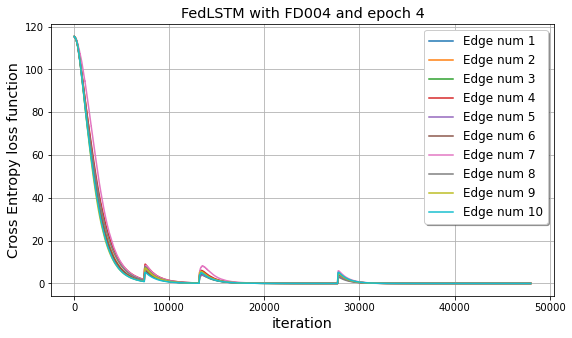

In [38]:
num_workers = 10
iteration_epoch = 3000
epoch = 4
fig, ax = plt.subplots()
fig.set_size_inches(9, 5)
cost_each_worker = np.zeros(shape=(num_workers, 4 * epoch *iteration_epoch))
for worker_i in range(num_workers):
    cost_each_worker[worker_i, :] = np.array(J[worker_i]).flatten()
    plt.plot(cost_each_worker[worker_i, :], label="Edge num " + str(worker_i+1))
plt.title("FedLSTM with FD004 and epoch 4", fontsize="x-large")
plt.ylabel("Cross Entropy loss function", fontsize="x-large")
plt.xlabel("iteration", fontsize="x-large")
plt.grid()
legened = plt.legend(shadow=True, fontsize='large')

dir_logdata_FD004_epoch_4: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD004/Results/epoch_4/"    
plt.rcParams["savefig.directory"] = os.chdir(os.path.dirname(dir_logdata_FD004_epoch_4))
plt.savefig('J_FD004_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_04.eps', format='eps', dpi=1200, bbox_inches='tight')
plt.savefig('J_FD004_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_04.png', format='png', dpi=1200, bbox_inches='tight')

### Plot test models

C:\Users\alibei\AppData\Local\Temp/ipykernel_1168/3542619967.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig[i], ax[i] = plt.subplots()


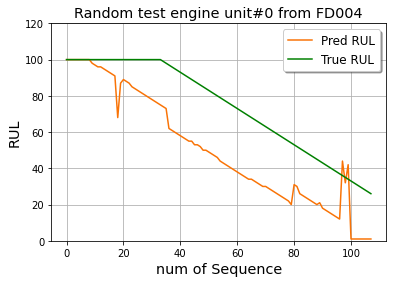

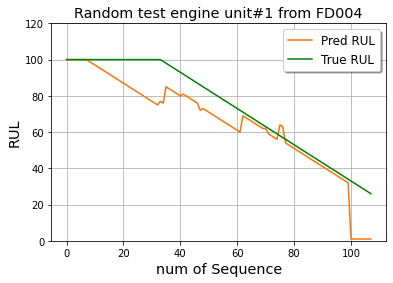

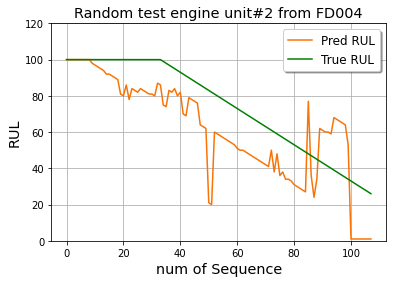

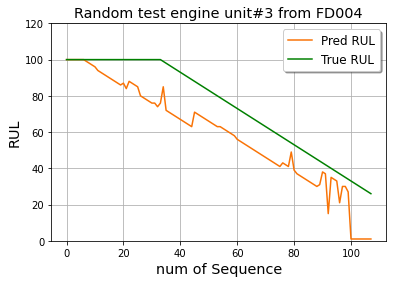

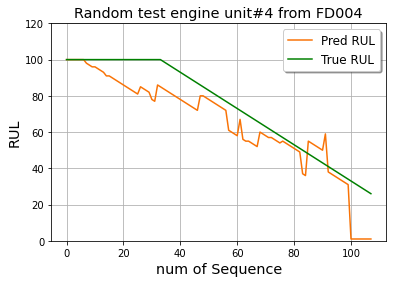

...

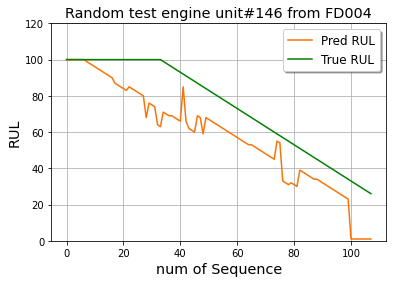

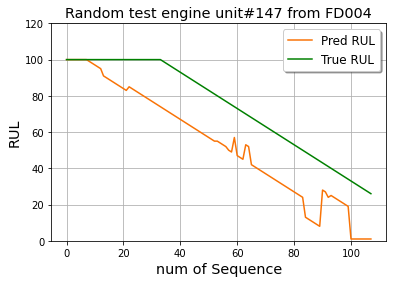

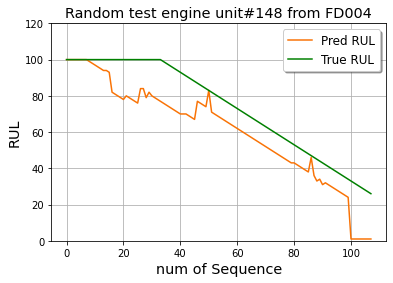

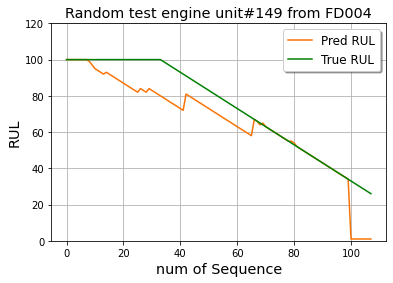

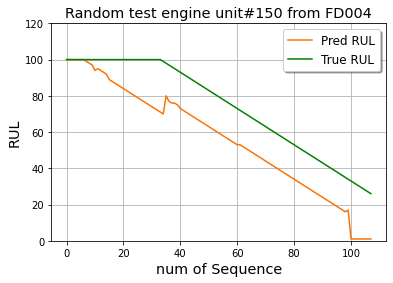

In [44]:
worker_test = LSTM()
fig={}
ax={}
for i in range(len(X_test)):
    Y_hat = worker_test.test_pred(X_test[i], array_params[0])
    fig[i], ax[i] = plt.subplots()
    ax[i].plot(Y_hat, label='Pred RUL', color='#F97306')
    ax[i].plot(Y_test[worker_i], label='True RUL', color='#008000')
    plt.title("Random test engine unit#" + str(i) + " from FD004", fontsize="x-large")
    plt.ylabel("RUL", fontsize="x-large")
    plt.ylim(0, 120)
    plt.xlabel("num of Sequence", fontsize="x-large")
    ax[i].grid()
    ax[i].legend(shadow=True, fontsize='large')
    dir_name: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD004/Results/epoch_4/"
    #plt.rcParams["savefig.directory"] = os.chdir(os.path.dirname(dir_name))
    #plt.savefig("RUL_10Workers_Final_Cost_itter_3000_alpha_004_epoch_04"+str(worker_i)+".eps", format='eps', dpi=1200)
    #plt.savefig("RUL_10Workers_Final_Cost_itter_3000_alpha_004_epoch_04"+str(worker_i)+".png", format='png', dpi=1200)

In [45]:
# Save Specific figures
dir_name: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD004/Results/epoch_4/"    
plt.rcParams["savefig.directory"] = os.chdir(os.path.dirname(dir_name))
fig[139].savefig("FD004 RUL prediction with FedLSTM and epoch 4 for machine number_" + str(139) + ".eps", format='eps', dpi=1200, bbox_inches='tight')
fig[139].savefig("FD004 RUL prediction with FedLSTM and epoch 4 for machine number_" + str(139) + ".png", format='png', dpi=1200, bbox_inches='tight')


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


### RMSE and SCORE

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


[34.81739843]


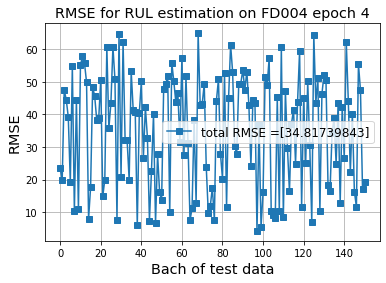

In [46]:
# RMSE and Scoring factor epoch 4
def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())


RMSE = np.zeros(shape=(len(X_test),1))


for worker_i in range(len(X_test)):
    Y_hat = worker_test.test_pred(X_test[worker_i], array_params[0])
    RMSE[worker_i] = rmse(Y_hat, Y_test[worker_i])

fig, ax = plt.subplots()
plt.plot(RMSE, label='RMSE', marker = 's')
plt.title("RMSE for RUL estimation on FD004 epoch 4", fontsize="x-large")
plt.ylabel("RMSE", fontsize="x-large")
plt.xlabel("Bach of test data", fontsize="x-large")
plt.grid()

RMSE_epoch_4 = np.sum(RMSE, axis=0)/len(X_test)
labels = []
labels.append("total RMSE ="+str(RMSE_epoch_4))

plt.legend(labels, loc='best', fontsize='large')


print(RMSE_epoch_4)
plt.rcParams["savefig.directory"] = os.chdir(os.path.dirname(dir_name))
plt.savefig("RMSE for RUL estimation FedLSTM on test dataset FD004 epoch 4.eps", format='eps', dpi=1200, bbox_inches='tight')
plt.savefig("RMSE for RUL estimation FedLSTM on test dataset FD004 epoch 4.png", format='png', dpi=1200, bbox_inches='tight')

[ -71.53873006  -71.30091382  -84.79026998  -87.19699675  -84.01732645
  -75.18566078  -89.37081929  -49.01537951  -84.2562466   -42.53626565
  -83.92514525  -89.49601501  -88.14375674  -85.93022641   24.98103725
  -60.73665528  -87.93695954  -77.6185165   -86.0420775   -84.60040776
  -85.56202276  404.96700005  -74.95424318  -87.4889514   -84.55622885
  -86.09290999  -87.20049064  -87.53550533  -21.93887094  -85.41683612
  -75.93748004  -88.32910038  -86.72244403  -81.32995221  -73.97190764
  -90.14577839  -84.21106256  -86.18819636   17.48281107  -82.96853328
  -87.08340201  -81.82910516  -86.21893018  -84.82956007  -25.44989372
  -74.68390901   36.16223058   -5.17080094  -80.48066158  -60.52887911
  -30.10010137  -86.37806151  -88.28753544  -90.84934565   93.79278896
  -86.25778511  -87.75363615  -85.58396179  -85.23571372  -73.30633871
  -85.9979878   -83.07151285  -88.48853513  -86.04122317  -23.32220585
   87.77498824  -83.06289781  259.09142351  -86.6407458   -83.91281774
  -86.

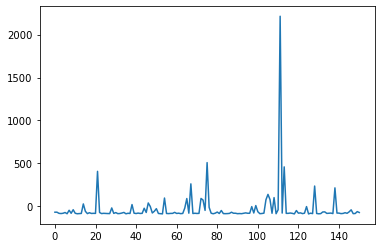

In [47]:
def each_score(predictions, targets):
    tmp = np.zeros(shape=(1, len(predictions)))
    for i in range(len(predictions)):
        Yi = predictions[i] - targets[i]
        if Yi >= 0:
            tmp[:, i] = (np.exp(Yi/10)-1)   
        else:
            tmp[:, i] = np.exp(Yi/13)-1
    return tmp
    
SCORE = np.zeros(shape=(len(X_test), X_test[0].shape[0]))

for worker_i in range(len(X_test)):
    Y_hat = worker_test.test_pred(X_test[worker_i], array_params[0])
    SCORE[worker_i, :] = each_score(Y_hat, Y_test[worker_i])
    
print(np.sum(SCORE, axis=1))
plt.plot(np.sum(SCORE, axis=1))
print("Final value for SCORE:",np.sum(SCORE)/len(X_test))

## Load Cost functions and Parameters

In [101]:
import numpy as np
import pickle
# from model import *

# Import libraries
from random import uniform
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

import time
import math
import sys
import random

dir_logdata_FD004_epoch_4: str = "H:\.1-Electrical_WorkSpace/Projects/Federated Learning on URL Estimation/Machin Learning/DML_Turbofan/Python/Notebook/Results/FedLSTM/FD004/LogData/epoch_4/ "    
# Load cost from a PKL file
a_file = open(dir_logdata_FD004_epoch_4 + "J_10Workers_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_04.pkl", "rb")
J = pickle.load(a_file)
a_file.close()

# Load params data from a PKL file
a_file = open(dir_logdata_FD004_epoch_4 + "array_params_10Workers_Final_Cost_FedLSTM_itter_3000_alpha_004_epoch_04.pkl", "rb")
array_params = pickle.load(a_file)
print(array_params)
a_file.close()

[{'Wf': array([[-0.18564977,  0.0322141 , -0.04818845, ..., -0.12048841,
         0.09804777,  0.05325   ],
       [-0.06109197,  0.09811411, -0.04168961, ...,  0.08114126,
         0.08047905,  0.05512676],
       [-0.12158022, -0.13627538, -0.17668155, ..., -0.20193493,
         0.20272957,  0.12999881],
       ...,
       [ 0.01255876,  0.16984161,  0.03624951, ..., -0.08108413,
         0.04121908,  0.00478767],
       [ 0.02036318,  0.06390896, -0.02934949, ...,  0.06846599,
         0.09238949,  0.08252651],
       [ 0.04791726,  0.01360442, -0.01159031, ...,  0.07645322,
         0.05202115,  0.05020851]]), 'bf': array([[1.05032015],
       [1.08373612],
       [1.08920687],
       [1.02828693],
       [1.0825476 ],
       [1.14573225],
       [1.04020056],
       [1.06803859],
       [1.07327751],
       [1.0113719 ],
       [1.0307025 ],
       [1.02641318],
       [1.07471422],
       [1.07047969],
       [1.10095669],
       [1.0111647 ],
       [1.06367949],
       [1.00765